In [1]:
# Fix for module imports - add parent directory to Python path
import sys
import os

# Get the parent directory (project root) and add it to Python path
project_root = os.path.dirname(os.getcwd())
if project_root not in sys.path:
    sys.path.insert(0, project_root)

print(f"Added to Python path: {project_root}")
print("Now you can import from modules package!")


Added to Python path: /Users/josiasmoukpe/Desktop/sep-forecasting-research
Now you can import from modules package!


In [2]:
import os
import time

import matplotlib.pyplot as plt
import numpy as np
import psutil
import tensorflow as tf
from scipy.stats import pearsonr
from tensorflow.keras.layers import Dense, Input, LeakyReLU
from tensorflow.keras.models import Model

from modules.training.normlayer import NormalizeLayer
from modules.training.phase_manager import IsTraining

# Set random seeds for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

from modules.training.cme_modeling import ModelBuilder as MB

In [3]:
from modules.training.phase_manager import TrainingPhaseManager

# instantiate the model_builder
mb = MB()
pm = TrainingPhaseManager()  # Training phase manager

In [4]:
class TrainerV4:
    def __init__(self, input_dim=2, hidden_dims=None, output_dim=2):
        if hidden_dims is None:
            hidden_dims = [64, 32]
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim
        self.phase_manager = TrainingPhaseManager()
        self.model = self.build_model()
        self.convergence_threshold = None

    def build_model(self):
        inputs = Input(shape=(self.input_dim,))
        x = inputs

        # Hidden layers with Leaky ReLU activation
        for dim in self.hidden_dims:
            x = Dense(dim)(x)
            x = LeakyReLU()(x)

        # Output layer
        outputs = Dense(self.output_dim)(x)
        outputs = NormalizeLayer(name='normalize_layer')(outputs)
        model = Model(inputs=inputs, outputs=outputs)
        return model

    def generate_synthetic_data(self, num_points=200, noise_level=0.15):
        """
        Generate synthetic data where:
        - Features are random 2D points with coordinates between 0 and 1
        - Labels are distances from origin (0,0)
        - Middle distances are ~10x more frequent than extremes
        - noise_level controls the spread of the gaussian weighting (default 0.15)
        """
        # Generate more points than needed for sampling
        pool_size = num_points * 10
        features = np.random.uniform(0, 1, (pool_size, self.input_dim))

        # Calculate distances
        distances = np.sqrt(np.sum(features ** 2, axis=1))

        # Create weights favoring middle distances
        # Use a gaussian centered at ~0.75 (middle of the possible range 0 to √2)
        weights = np.exp(-((distances - 0.75) ** 2) / (2 * noise_level ** 2))

        # Normalize weights to probabilities
        weights = weights / np.sum(weights)

        # Sample indices according to weights
        selected_indices = np.random.choice(
            pool_size,
            size=num_points,
            p=weights,
            replace=False
        )

        # Select the points
        selected_features = features[selected_indices]
        selected_distances = distances[selected_indices]

        return selected_features, selected_distances.reshape(-1, 1)

    def compute_pairwise_correlation(self, features, predictions):
        """Compute pairwise correlation between features and predictions."""
        feat_dists = tf.reduce_sum(tf.square(features[:, tf.newaxis] - features[tf.newaxis, :]), axis=-1)
        pred_dists = tf.reduce_sum(tf.square(predictions[:, tf.newaxis] - predictions[tf.newaxis, :]), axis=-1)

        # Flatten the distance matrices
        feat_dists_flat = feat_dists.numpy().flatten()
        pred_dists_flat = pred_dists.numpy().flatten()

        # Compute correlation
        correlation, _ = pearsonr(feat_dists_flat, pred_dists_flat)
        return correlation

    def train(self, loss_fn, num_points=2000, epochs=1000, batch_size=32, noise_level=0.15, verbose=1):
        # Generate synthetic data with specified noise level
        X_train, y_train = self.generate_synthetic_data(num_points=num_points, noise_level=noise_level)

        # Compile model
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=loss_fn
        )

        # Convert to tf.data.Dataset
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
        train_dataset = train_dataset.batch(batch_size)

        # Initialize tracking variables
        start_time = time.time()
        batch_times = []
        convergence_epoch = None
        convergence_time = None

        class ConvergenceCallback(tf.keras.callbacks.Callback):
            def __init__(self, trainer, threshold_factor=0.0007):
                super().__init__()
                self.trainer = trainer
                self.threshold_factor = threshold_factor
                self.first_loss = None
                self.convergence_reached = False
                self.batch_start_time = None

            def on_train_begin(self, logs=None):
                self.batch_start_time = time.time()

            def on_batch_end(self, batch, logs=None):
                batch_end_time = time.time()
                batch_duration = batch_end_time - self.batch_start_time
                batch_times.append(batch_duration)
                self.batch_start_time = batch_end_time

            def on_epoch_end(self, epoch, logs=None):
                current_loss = logs['loss']

                if self.first_loss is None:
                    self.first_loss = current_loss
                    self.trainer.convergence_threshold = self.first_loss * self.threshold_factor

                if not self.convergence_reached and current_loss <= self.trainer.convergence_threshold:
                    self.convergence_reached = True
                    nonlocal convergence_epoch, convergence_time
                    convergence_epoch = epoch + 1
                    convergence_time = time.time() - start_time

        convergence_callback = ConvergenceCallback(self)

        # Training history
        history = self.model.fit(
            train_dataset,
            epochs=epochs,
            verbose=verbose,
            callbacks=[
                IsTraining(self.phase_manager),
                convergence_callback
            ]
        )

        # Final predictions
        predictions = self.model.predict(X_train)

        # Compute final correlation
        correlation = self.compute_pairwise_correlation(X_train, predictions)

        # Calculate and print metrics
        total_time = time.time() - start_time
        avg_batch_time = np.mean(batch_times)

        print("\nTraining Metrics:")
        print(f"Initial Loss: {history.history['loss'][0]:.6f}")
        print(f"Final Loss: {history.history['loss'][-1]:.6f}")
        print(f"Convergence Threshold: {self.convergence_threshold:.6f}")
        if convergence_epoch:
            print(f"Convergence Epoch: {convergence_epoch}")
            print(f"Loss at Convergence: {history.history['loss'][convergence_epoch - 1]:.6f}")
            print(f"Time to Convergence: {convergence_time:.2f} seconds")
        else:
            print("Model did not converge to threshold")
        print(f"Total Training Time: {total_time:.2f} seconds")
        print(f"Average Time per Batch: {avg_batch_time * 1000:.2f} ms")
        print(f"Final Correlation: {correlation:.4f}")
        print(f"Noise Level Used: {noise_level}")

        return history, correlation

    def plot_training_history(self, history):
        """Plot the training loss over epochs."""
        plt.figure(figsize=(10, 6))
        plt.plot(history.history['loss'])
        plt.axhline(y=self.convergence_threshold, color='r', linestyle='--',
                    label=f'Convergence Threshold ({self.convergence_threshold:.6f})')
        plt.title('Model Loss During Training')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.yscale('log')  # Use log scale to better see convergence
        plt.grid(True)
        plt.legend()
        plt.show()

    def plot_data_distribution(self, features, labels):
        """Plot the distribution of data points and their labels."""
        plt.figure(figsize=(15, 5))

        # Plot points in 2D space
        plt.subplot(1, 3, 1)
        scatter = plt.scatter(features[:, 0], features[:, 1], c=labels, cmap='viridis')
        plt.colorbar(scatter, label='Distance from Origin')
        plt.title('Data Points Colored by Distance')
        plt.xlabel('X')
        plt.ylabel('Y')

        # Plot distance distribution
        plt.subplot(1, 3, 2)
        plt.hist(labels, bins=30, density=True)

        # Add the target distribution curve
        x = np.linspace(0, np.sqrt(2), 100)
        target_dist = np.exp(-((x - 0.75) ** 2) / (2 * 0.15 ** 2))
        target_dist = target_dist / np.max(target_dist) * plt.gca().get_ylim()[1]
        plt.plot(x, target_dist, 'r--', label='Target Distribution')
        plt.legend()

        plt.title('Distribution of Distances')
        plt.xlabel('Distance from Origin')
        plt.ylabel('Density')

        # Plot points with reference circles
        plt.subplot(1, 3, 3)
        plt.scatter(features[:, 0], features[:, 1], alpha=0.5)

        # Add quarter circles at different radii
        for radius in [0.25, 0.5, 0.75, 1.0]:
            circle = plt.Circle((0, 0), radius, fill=False, color='red', alpha=0.3)
            plt.gca().add_artist(circle)

        plt.axis('equal')
        plt.title('Points with Reference Circles')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def plot_predictions(self, features, labels, predictions):
        """Plot original data and model predictions."""
        plt.figure(figsize=(12, 5))

        # Original data
        plt.subplot(1, 2, 1)
        plt.scatter(features[:, 0], features[:, 1], c=labels.flatten(), cmap='viridis')
        plt.colorbar(label='Distance from Origin')
        plt.title('Original Data')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')

        # Predictions
        plt.subplot(1, 2, 2)
        plt.scatter(predictions[:, 0], predictions[:, 1], c=labels.flatten(), cmap='viridis')
        plt.colorbar(label='Distance from Origin')
        plt.title('Model Predictions')
        plt.xlabel('Embedding 1')
        plt.ylabel('Embedding 2')
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.tight_layout()
        plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step

Training Metrics:
Initial Loss: 0.910978
Final Loss: 0.000188
Convergence Threshold: 0.000638
Convergence Epoch: 137
Loss at Convergence: 0.000635
Time to Convergence: 5.31 seconds
Total Training Time: 19.96 seconds
Average Time per Batch: 7.62 ms
Final Correlation: 0.5044
Noise Level Used: 0.5
Final Pairwise Correlation: 0.5044


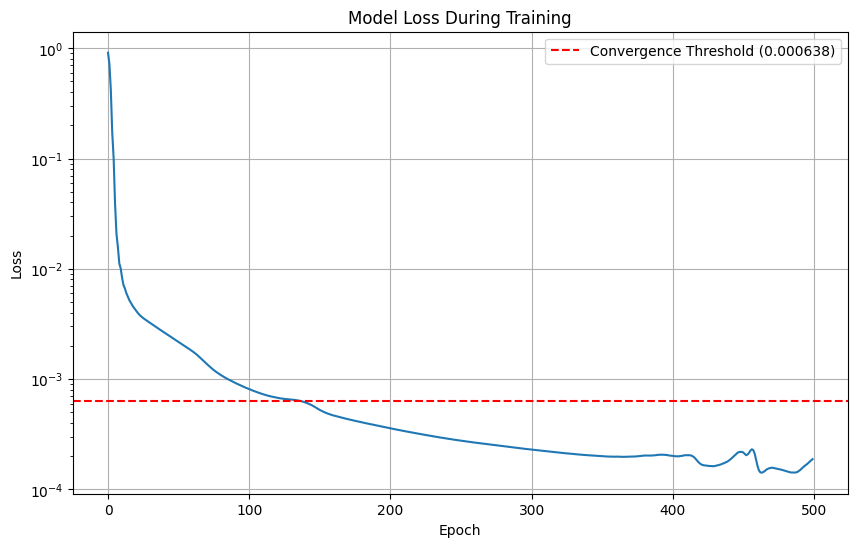

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step


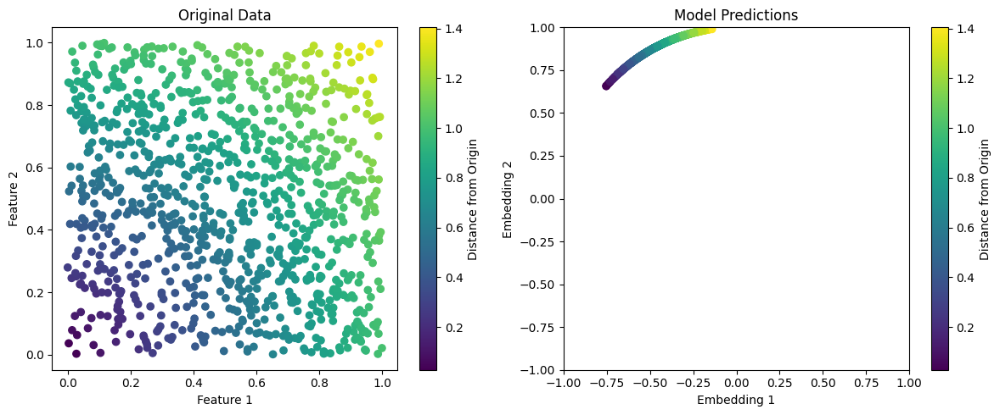

In [5]:
def custom_loss(y_true, y_pred):
    return mb.pdc_loss_vec(y_true, y_pred, pm)  # Replace with appropriate loss function

noise_level = 0.50
trainer = TrainerV4(input_dim=2, hidden_dims=[8, 16, 32, 16, 8], output_dim=2)
history, final_correlation = trainer.train(
    loss_fn=custom_loss, 
    num_points=5000, 
    noise_level=noise_level,
    epochs=500, 
    batch_size=1024,
    verbose=0
)

# Print results
print(f"Final Pairwise Correlation: {final_correlation:.4f}")

# Plot training history
trainer.plot_training_history(history)

# Plot predictions
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
predictions = trainer.model.predict(X_test)
trainer.plot_predictions(X_test, y_test, predictions)

In [6]:
class TrainerV4_1:
    def __init__(self, input_dim=2, hidden_dims=None, output_dim=2, embed_dim=2, use_normalize_layer=True):
        if hidden_dims is None:
            hidden_dims = [64, 32]
        self.input_dim = input_dim  # Now configurable for N dimensions
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim
        self.embed_dim = embed_dim  # Keep at 2 for visualization
        self.use_normalize_layer = use_normalize_layer
        self.phase_manager = TrainingPhaseManager()
        self.model = self.build_model()
        self.convergence_threshold = None

    def build_model(self):
        inputs = Input(shape=(self.input_dim,))  # Use N-dimensional input
        x = inputs

        # Hidden layers with Leaky ReLU activation
        for dim in self.hidden_dims:
            x = Dense(dim)(x)
            x = LeakyReLU()(x)

        # Representation output (optionally normalized vector) - keep at 2D for visualization
        representation_output = Dense(self.embed_dim, name='representation_raw')(x)
        if self.use_normalize_layer:
            representation_output = NormalizeLayer(name='normalize_layer')(representation_output)
            rep_output_name = 'normalize_layer'
        else:
            rep_output_name = 'representation_raw'
        # Distance prediction from representation
        distance_output = Dense(1, name='distance_prediction')(representation_output)
        
        model = Model(inputs=inputs, outputs=[distance_output, representation_output])
        self.rep_output_name = rep_output_name  # Save for later use
        return model

    def generate_synthetic_data(self, num_points=200, noise_level=0.15):
        """
        Generate synthetic data where:
        - Features are random N-dimensional points with coordinates between 0 and 1
        - Labels are distances from origin (0,0,...,0)
        - Middle distances are ~10x more frequent than extremes
        - noise_level controls the spread of the gaussian weighting (default 0.15)
        """
        # Generate more points than needed for sampling
        pool_size = num_points * 10
        features = np.random.uniform(0, 1, (pool_size, self.input_dim))

        # Calculate distances from origin for N-dimensional space
        distances = np.sqrt(np.sum(features ** 2, axis=1))

        # Create weights favoring middle distances
        # For N dimensions, max possible distance is √N
        max_distance = np.sqrt(self.input_dim)
        # Center gaussian at middle of possible range (0 to √N)
        gaussian_center = max_distance * 0.5
        
        weights = np.exp(-((distances - gaussian_center) ** 2) / (2 * noise_level ** 2))

        # Normalize weights to probabilities
        weights = weights / np.sum(weights)

        # Sample indices according to weights
        selected_indices = np.random.choice(
            pool_size,
            size=num_points,
            p=weights,
            replace=False
        )

        # Select the points
        selected_features = features[selected_indices]
        selected_distances = distances[selected_indices]

        return selected_features, selected_distances.reshape(-1, 1)

    def compute_pairwise_correlation(self, features, predictions):
        """Compute pairwise correlation between features and predictions."""
        feat_dists = tf.reduce_sum(tf.square(features[:, tf.newaxis] - features[tf.newaxis, :]), axis=-1)
        pred_dists = tf.reduce_sum(tf.square(predictions[:, tf.newaxis] - predictions[tf.newaxis, :]), axis=-1)

        # Flatten the distance matrices
        feat_dists_flat = feat_dists.numpy().flatten()
        pred_dists_flat = pred_dists.numpy().flatten()

        # Compute correlation
        correlation, _ = pearsonr(feat_dists_flat, pred_dists_flat)
        return correlation

    def compute_distance_metrics(self, y_true, y_pred):
        """Compute evaluation metrics for distance prediction."""
        mse = tf.keras.losses.mse(y_true, y_pred).numpy().mean()
        mae = tf.keras.losses.mae(y_true, y_pred).numpy().mean()
        # R-squared and RMSE removed as per instructions
        return {
            'mse': mse,
            'mae': mae,
        }

    def train(
        self, 
        representation_loss_fn=None, 
        distance_loss_weight=1.0, 
        representation_loss_weight=0.5, 
        representation_targets=None, 
        num_points=2000, 
        epochs=1000, 
        batch_size=32, 
        noise_level=0.15, 
        verbose=0):
        """
        Train the model with dual outputs: distance prediction and representation learning.
        
        Args:
            representation_loss_fn: Loss function for representation learning. If None, uses features as targets (autoencoder style)
            distance_loss_weight: Weight for distance prediction loss
            representation_loss_weight: Weight for representation learning loss  
            representation_targets: Target for representation learning. If None, uses input features
            num_points: Number of training points
            epochs: Number of training epochs
            batch_size: Batch size
            noise_level: Noise level for data generation
            verbose: Verbosity level
        """
        # Generate synthetic data with specified noise level
        X_train, y_distance = self.generate_synthetic_data(num_points=num_points, noise_level=noise_level)
        
        # Set representation targets
        if representation_targets is None:
            y_representation = X_train  # Autoencoder style - reconstruct input features
        else:
            y_representation = representation_targets
            
        # Set representation loss function
        if representation_loss_fn is None:
            representation_loss_fn = 'mse'  # Default to MSE for autoencoder style

        # Prepare loss, loss_weights, metrics, and targets dicts based on output names
        loss_dict = {
            'distance_prediction': 'mse',
            self.rep_output_name: representation_loss_fn
        }
        loss_weights_dict = {
            'distance_prediction': distance_loss_weight,
            self.rep_output_name: representation_loss_weight
        }
        metrics_dict = {
            'distance_prediction': ['mae'],
            self.rep_output_name: []
        }
        targets = {
            'distance_prediction': y_distance,
            self.rep_output_name: y_representation
        }

        # Compile model with multiple outputs and losses
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=loss_dict,
            loss_weights=loss_weights_dict,
            metrics=metrics_dict
        )

        # Convert to tf.data.Dataset
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, targets))
        train_dataset = train_dataset.batch(batch_size)

        # Initialize tracking variables
        start_time = time.time()
        batch_times = []
        convergence_epoch = None
        convergence_time = None

        class ConvergenceCallback(tf.keras.callbacks.Callback):
            def __init__(self, trainer, threshold_factor=0.0007):
                super().__init__()
                self.trainer = trainer
                self.threshold_factor = threshold_factor
                self.first_loss = None
                self.convergence_reached = False
                self.batch_start_time = None

            def on_train_begin(self, logs=None):
                self.batch_start_time = time.time()

            def on_batch_end(self, batch, logs=None):
                batch_end_time = time.time()
                batch_duration = batch_end_time - self.batch_start_time
                batch_times.append(batch_duration)
                self.batch_start_time = batch_end_time

            def on_epoch_end(self, epoch, logs=None):
                # Use total loss for convergence
                current_loss = logs['loss']

                if self.first_loss is None:
                    self.first_loss = current_loss
                    self.trainer.convergence_threshold = self.first_loss * self.threshold_factor

                if not self.convergence_reached and current_loss <= self.trainer.convergence_threshold:
                    self.convergence_reached = True
                    nonlocal convergence_epoch, convergence_time
                    convergence_epoch = epoch + 1
                    convergence_time = time.time() - start_time

        convergence_callback = ConvergenceCallback(self)

        # Training history
        history = self.model.fit(
            train_dataset,
            epochs=epochs,
            verbose=verbose,
            callbacks=[
                IsTraining(self.phase_manager),
                convergence_callback
            ]
        )

        # Final predictions
        predictions = self.model.predict(X_train)
        distance_predictions = predictions[0]
        representation_predictions = predictions[1]

        # Compute evaluation metrics
        distance_metrics = self.compute_distance_metrics(y_distance, distance_predictions)
        correlation = self.compute_pairwise_correlation(X_train, representation_predictions)

        # Calculate and print metrics
        total_time = time.time() - start_time
        avg_batch_time = np.mean(batch_times)

        print("\nTraining Metrics:")
        print(f"Initial Total Loss: {history.history['loss'][0]:.6f}")
        print(f"Final Total Loss: {history.history['loss'][-1]:.6f}")
        print(f"Initial Distance Loss: {history.history['distance_prediction_loss'][0]:.6f}")
        print(f"Final Distance Loss: {history.history['distance_prediction_loss'][-1]:.6f}")
        # Print representation loss using the correct output name
        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            print(f"Initial Representation Loss: {history.history[rep_loss_key][0]:.6f}")
            print(f"Final Representation Loss: {history.history[rep_loss_key][-1]:.6f}")
        else:
            print("Representation Loss: (not available)")
        print(f"Convergence Threshold: {self.convergence_threshold:.6f}")
        
        if convergence_epoch:
            print(f"Convergence Epoch: {convergence_epoch}")
            print(f"Loss at Convergence: {history.history['loss'][convergence_epoch - 1]:.6f}")
            print(f"Time to Convergence: {convergence_time:.2f} seconds")
        else:
            print("Model did not converge to threshold")
            
        print(f"Total Training Time: {total_time:.2f} seconds")
        print(f"Average Time per Batch: {avg_batch_time * 1000:.2f} ms")
        
        print("\nDistance Prediction Metrics:")
        print(f"MSE: {distance_metrics['mse']:.6f}")
        print(f"MAE: {distance_metrics['mae']:.6f}")
        
        print(f"\nRepresentation Quality:")
        print(f"Pairwise Correlation: {correlation:.4f}")
        print(f"Noise Level Used: {noise_level}")

        return history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance

    def plot_training_history(self, history):
        """Plot the training losses over epochs."""
        plt.figure(figsize=(15, 5))
        
        # Total loss
        plt.subplot(1, 3, 1)
        plt.plot(history.history['loss'])
        if self.convergence_threshold:
            plt.axhline(y=self.convergence_threshold, color='r', linestyle='--',
                        label=f'Convergence Threshold ({self.convergence_threshold:.6f})')
        plt.title('Total Loss During Training')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        # Removed log scale
        plt.grid(True)
        plt.legend()
        
        # Distance prediction loss
        plt.subplot(1, 3, 2)
        plt.plot(history.history['distance_prediction_loss'])
        plt.title('Distance Prediction Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        # Removed log scale
        plt.grid(True)
        
        # Representation loss
        plt.subplot(1, 3, 3)
        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            plt.plot(history.history[rep_loss_key])
            plt.title('Representation Loss')
        else:
            plt.plot([])
            plt.title('Representation Loss (N/A)')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        # Removed log scale
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()

    def plot_actual_vs_predicted(self, true_distances, predicted_distances):
        """Plot actual vs predicted distances with performance metrics."""
        plt.figure(figsize=(10, 8))
        
        # Main scatter plot
        plt.scatter(true_distances, predicted_distances, alpha=0.6, s=50)
        
        # Perfect prediction line
        min_dist = min(true_distances.min(), predicted_distances.min())
        max_dist = max(true_distances.max(), predicted_distances.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')
        
        # Calculate and display metrics
        residuals = true_distances.flatten() - predicted_distances.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        
        # Add metrics to plot (no RMSE, no R²)
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes, 
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Make plot square for better visualization
        plt.axis('equal')
        plt.tight_layout()
        plt.show()

    def plot_distance_predictions(self, features, true_distances, predicted_distances):
        """Plot comprehensive distance prediction analysis"""
        plt.figure(figsize=(12, 4))
        
        # Actual vs Predicted scatter plot
        plt.subplot(1, 2, 1)
        plt.scatter(true_distances, predicted_distances, alpha=0.6)
        min_dist = min(true_distances.min(), predicted_distances.min())
        max_dist = max(true_distances.max(), predicted_distances.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', label='Perfect Prediction')
        
        # Calculate metrics
        residuals = true_distances.flatten() - predicted_distances.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes, 
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        plt.xlabel('True Distance')
        plt.ylabel('Predicted Distance')
        plt.title('Distance Prediction: Actual vs Predicted')
        plt.legend()
        plt.grid(True)
        
        # Error distribution
        plt.subplot(1, 2, 2)
        plt.hist(residuals, bins=30, density=True, alpha=0.7, edgecolor='black')
        plt.axvline(x=0, color='r', linestyle='--', label='Zero Error')
        plt.axvline(x=np.mean(residuals), color='orange', linestyle='--', label=f'Mean Error: {np.mean(residuals):.4f}')
        plt.xlabel('Prediction Error')
        plt.ylabel('Density')
        plt.title('Error Distribution')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()

    def plot_data_distribution(self, features, labels):
        """Plot the distribution of data points and their labels (adapted for N-D)."""
        plt.figure(figsize=(15, 5))

        # For N > 2, plot first two dimensions only
        plt.subplot(1, 3, 1)
        scatter = plt.scatter(features[:, 0], features[:, 1], c=labels, cmap='viridis')
        plt.colorbar(scatter, label='Distance from Origin')
        plt.title(f'Data Points (First 2 of {self.input_dim} dims) Colored by Distance')
        plt.xlabel('X1')
        plt.ylabel('X2')

        # Plot distance distribution
        plt.subplot(1, 3, 2)
        plt.hist(labels, bins=30, density=True)

        # Add the target distribution curve
        max_distance = np.sqrt(self.input_dim)
        x = np.linspace(0, max_distance, 100)
        gaussian_center = max_distance * 0.5
        target_dist = np.exp(-((x - gaussian_center) ** 2) / (2 * 0.15 ** 2))
        target_dist = target_dist / np.max(target_dist) * plt.gca().get_ylim()[1]
        plt.plot(x, target_dist, 'r--', label='Target Distribution')
        plt.legend()

        plt.title(f'Distribution of Distances (N={self.input_dim})')
        plt.xlabel('Distance from Origin')
        plt.ylabel('Density')

        # Plot points with reference circles (first 2 dimensions)
        plt.subplot(1, 3, 3)
        plt.scatter(features[:, 0], features[:, 1], alpha=0.5)

        # Add quarter circles at different radii (adjusted for N dimensions)
        max_2d_distance = np.sqrt(2)  # For visualization in 2D
        for radius in np.linspace(0.25, max_2d_distance, 4):
            circle = plt.Circle((0, 0), radius, fill=False, color='red', alpha=0.3)
            plt.gca().add_artist(circle)

        plt.axis('equal')
        plt.title(f'Points with Reference Circles (2D projection of {self.input_dim}D)')
        plt.xlabel('X1')
        plt.ylabel('X2')
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def plot_predictions(self, features, labels, distance_predictions, representation_predictions):
        """Plot original data and representations with actual vs predicted. 
        No feature colored by predicted distance, no residual plot, no RMSE/R².
        Embeddings are always plotted, even if not normalized.
        """
        plt.figure(figsize=(16, 8))

        # Actual vs Predicted (prominent first plot)
        plt.subplot(2, 2, 1)
        plt.scatter(labels, distance_predictions, alpha=0.6, s=50)
        min_dist = min(labels.min(), distance_predictions.min())
        max_dist = max(labels.max(), distance_predictions.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')
        
        # Calculate metrics
        residuals = labels.flatten() - distance_predictions.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes, 
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                fontsize=12, fontweight='bold')
        
        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Removed original data plot (was subplot(2,2,2))

        # Representation space (embedding)
        plt.subplot(2, 2, 3)
        plt.scatter(
            representation_predictions[:, 0], 
            representation_predictions[:, 1], 
            c=labels.flatten(), 
            cmap='viridis',
            alpha=0.6,
            s=50
        )
        plt.colorbar(label='True Distance')
        plt.title(
            'Learned Representation Space'
            + ('' if self.use_normalize_layer else ' (Not Normalized)')
        )
        plt.xlabel('Embedding 1')
        plt.ylabel('Embedding 2')
        # Only set axis limits if normalized
        if self.use_normalize_layer:
            plt.xlim(-1, 1)
            plt.ylim(-1, 1)
        plt.grid(True)
        
        # Error distribution
        plt.subplot(2, 2, 4)
        plt.hist(residuals, bins=30, density=True, alpha=0.7, edgecolor='black')
        plt.axvline(x=0, color='r', linestyle='--', label='Zero Error')
        plt.axvline(
            x=np.mean(residuals), 
            color='orange', 
            linestyle='--', 
            label=f'Mean Error: {np.mean(residuals):.4f}'
        )
        plt.xlabel('Prediction Error')
        plt.ylabel('Density')
        plt.title('Error Distribution')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step

Training Metrics:
Initial Total Loss: 2.821673
Final Total Loss: 0.082924
Initial Distance Loss: 2.298357
Final Distance Loss: 0.002801
Initial Representation Loss: 0.995849
Final Representation Loss: 0.160207
Convergence Threshold: 0.001975
Model did not converge to threshold
Total Training Time: 79.83 seconds
Average Time per Batch: 13.03 ms

Distance Prediction Metrics:
MSE: 0.002648
MAE: 0.040930

Representation Quality:
Pairwise Correlation: 0.0699
Noise Level Used: 0.15
Final Pairwise Correlation: 0.0699
Distance Prediction MAE: 0.040930


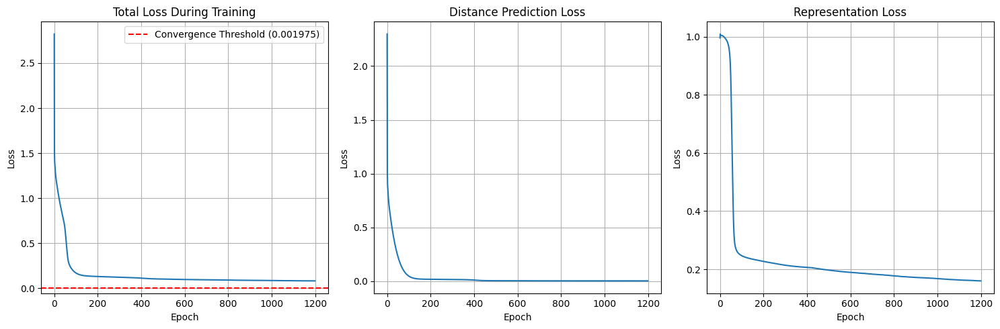

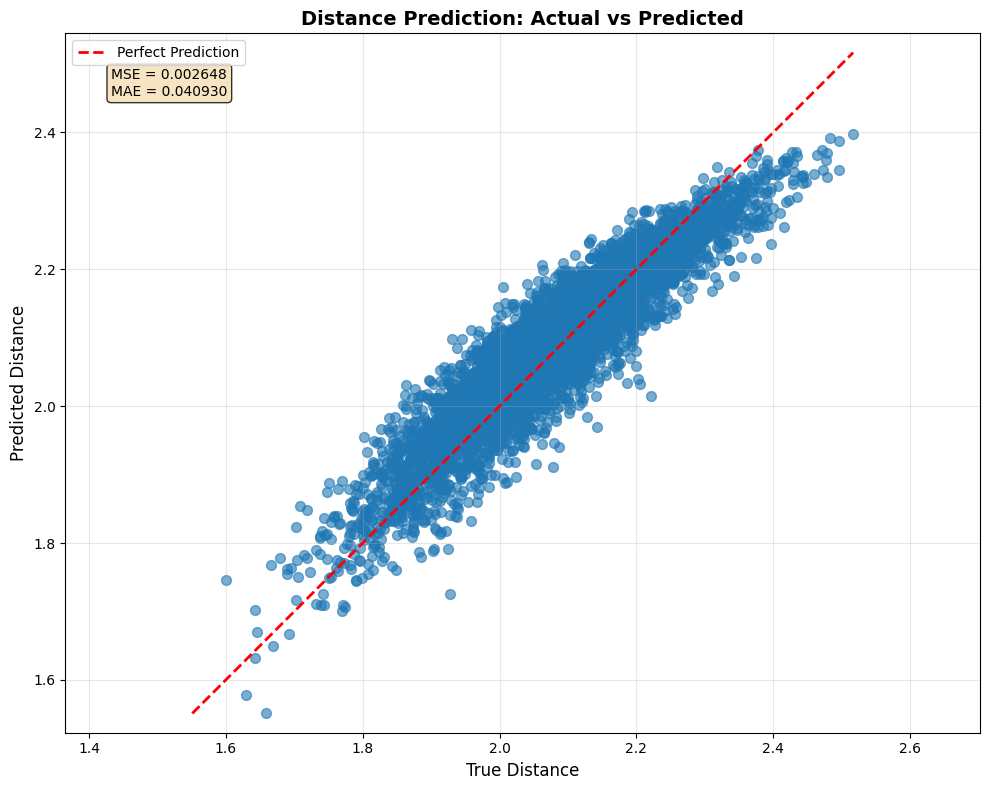

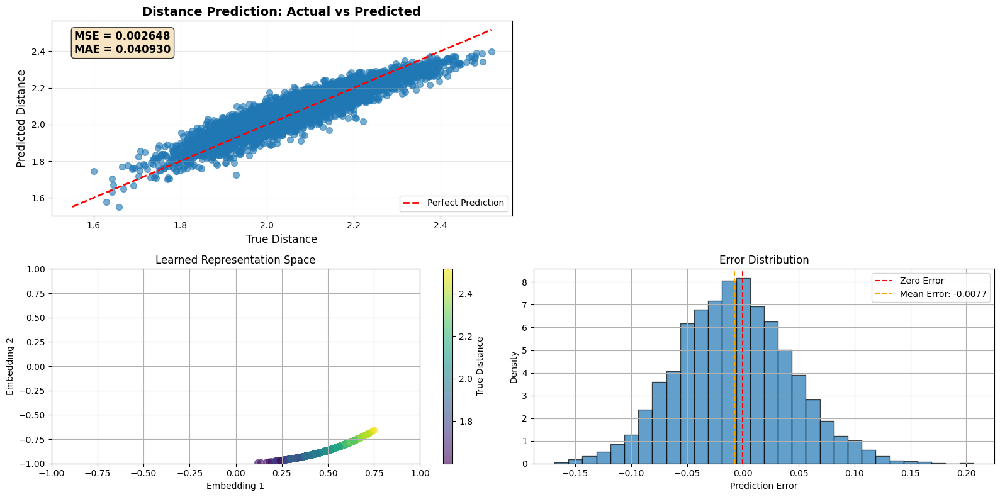

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 521us/step

Test Set Performance:
Test Pairwise Correlation: 0.0840
Test Distance Prediction MAE: 0.045117


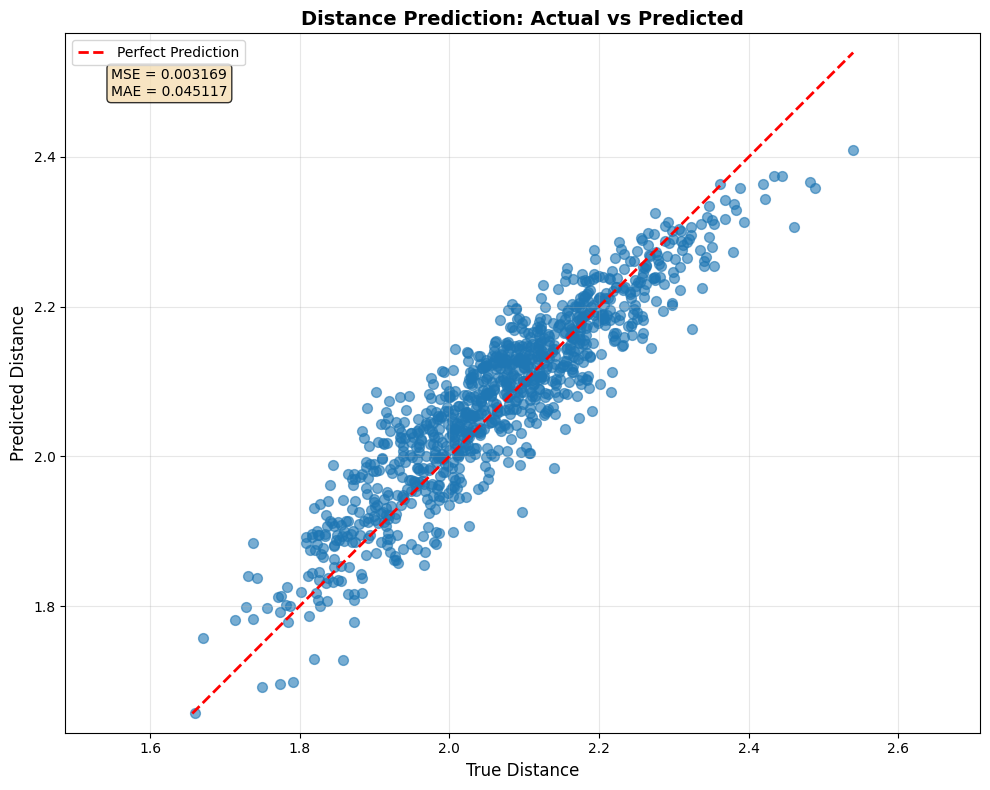

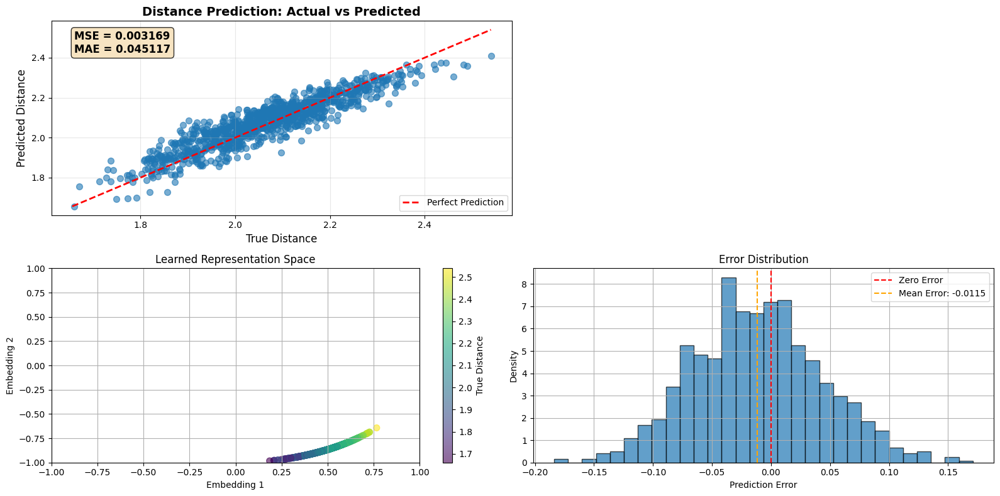

In [5]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=.5,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=1200, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step

Training Metrics:
Initial Total Loss: 3.030337
Final Total Loss: 0.165648
Initial Distance Loss: 2.024577
Final Distance Loss: 0.002585
Initial Representation Loss: 0.997061
Final Representation Loss: 0.162784
Convergence Threshold: 0.002121
Model did not converge to threshold
Total Training Time: 130.54 seconds
Average Time per Batch: 12.84 ms

Distance Prediction Metrics:
MSE: 0.002529
MAE: 0.039915

Representation Quality:
Pairwise Correlation: 0.0648
Noise Level Used: 0.15
Final Pairwise Correlation: 0.0648
Distance Prediction MAE: 0.039915


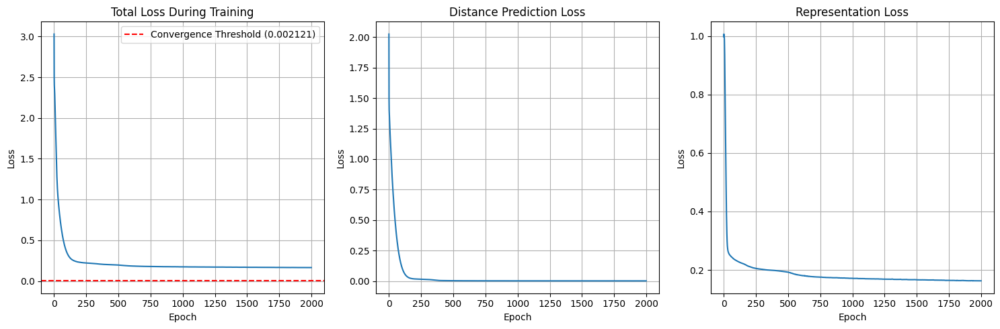

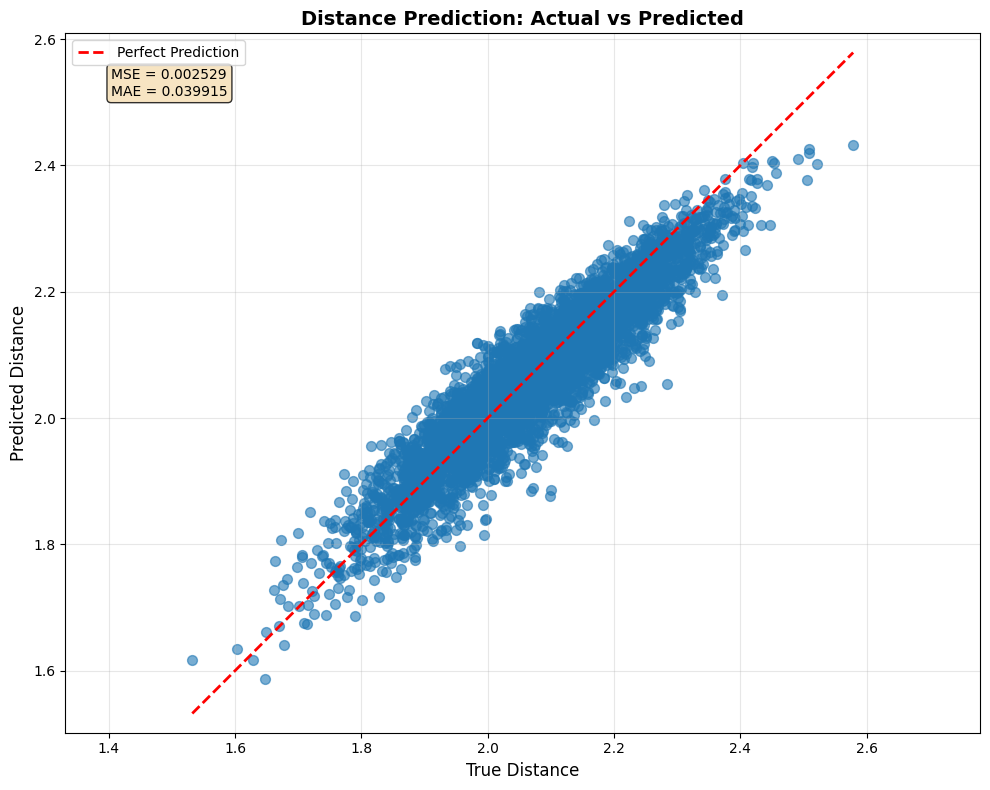

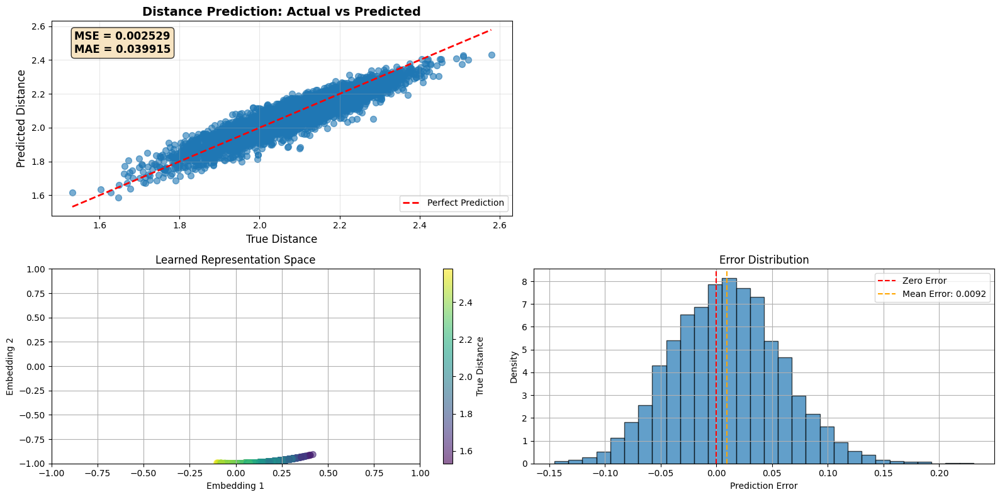

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step

Test Set Performance:
Test Pairwise Correlation: 0.0856
Test Distance Prediction MAE: 0.046045


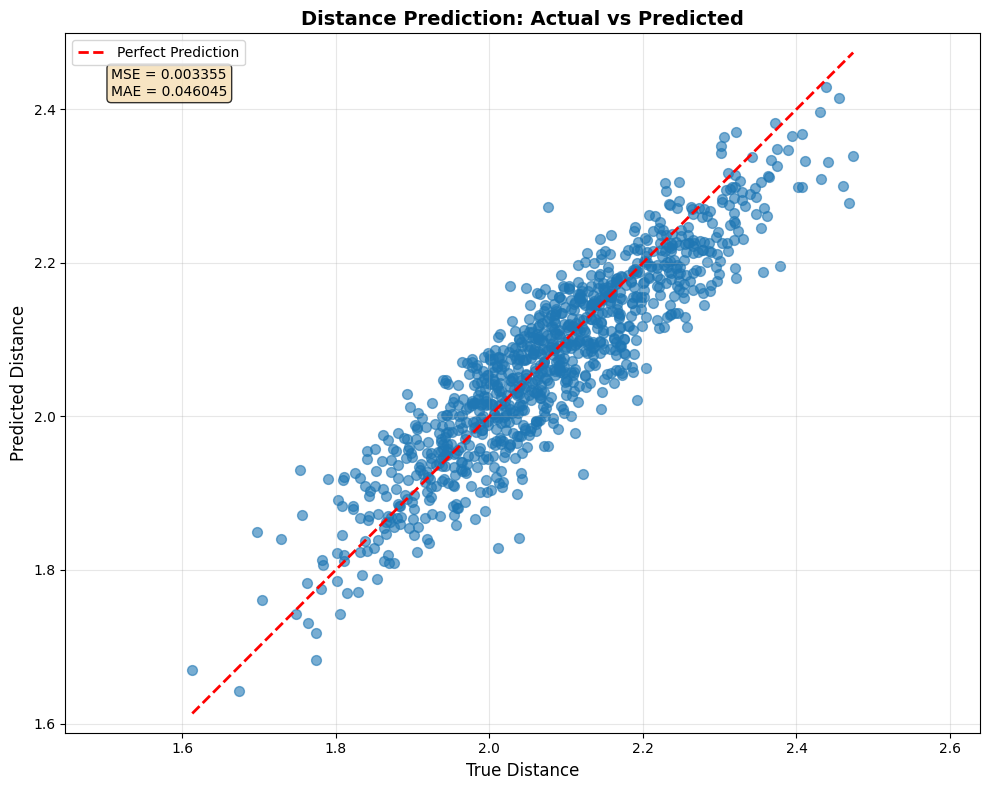

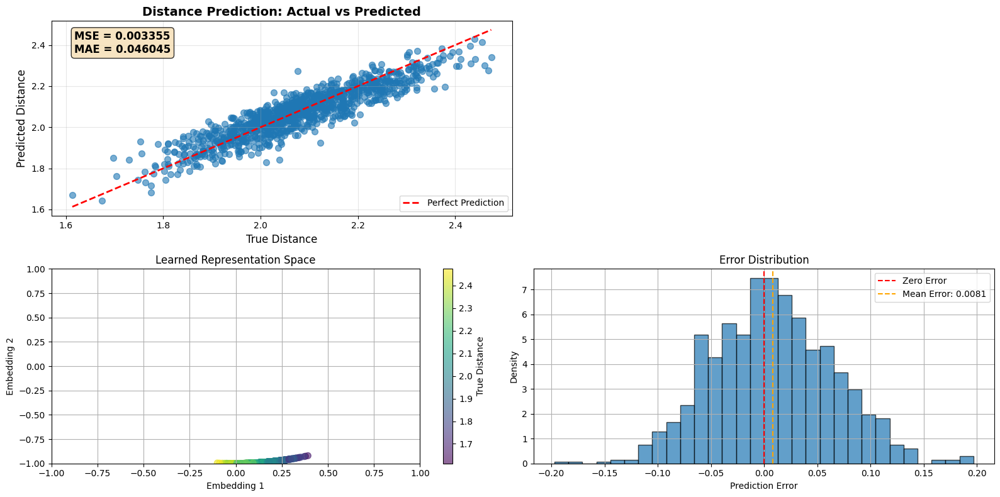

In [6]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=1.0,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=2000, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step

Training Metrics:
Initial Total Loss: 4.124061
Final Total Loss: 0.029708
Initial Distance Loss: 4.007364
Final Distance Loss: 0.019107
Initial Representation Loss: 0.209453
Final Representation Loss: 0.021307
Convergence Threshold: 0.002887
Model did not converge to threshold
Total Training Time: 13.11 seconds
Average Time per Batch: 7.68 ms

Distance Prediction Metrics:
MSE: 0.019061
MAE: 0.111144

Representation Quality:
Pairwise Correlation: 0.1693
Noise Level Used: 0.15
Final Pairwise Correlation: 0.1693
Distance Prediction MAE: 0.111144


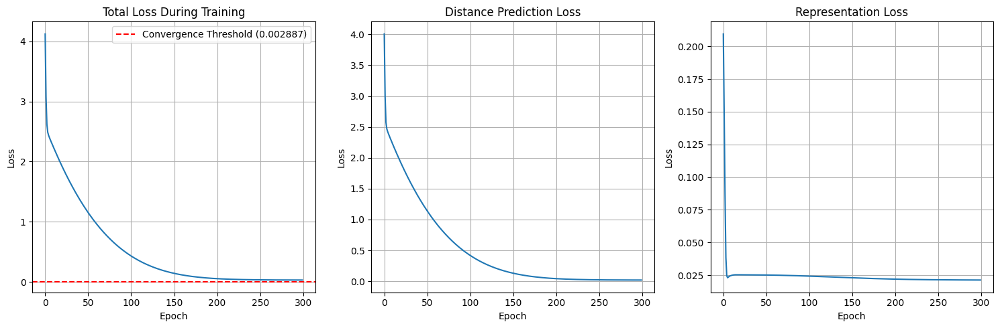

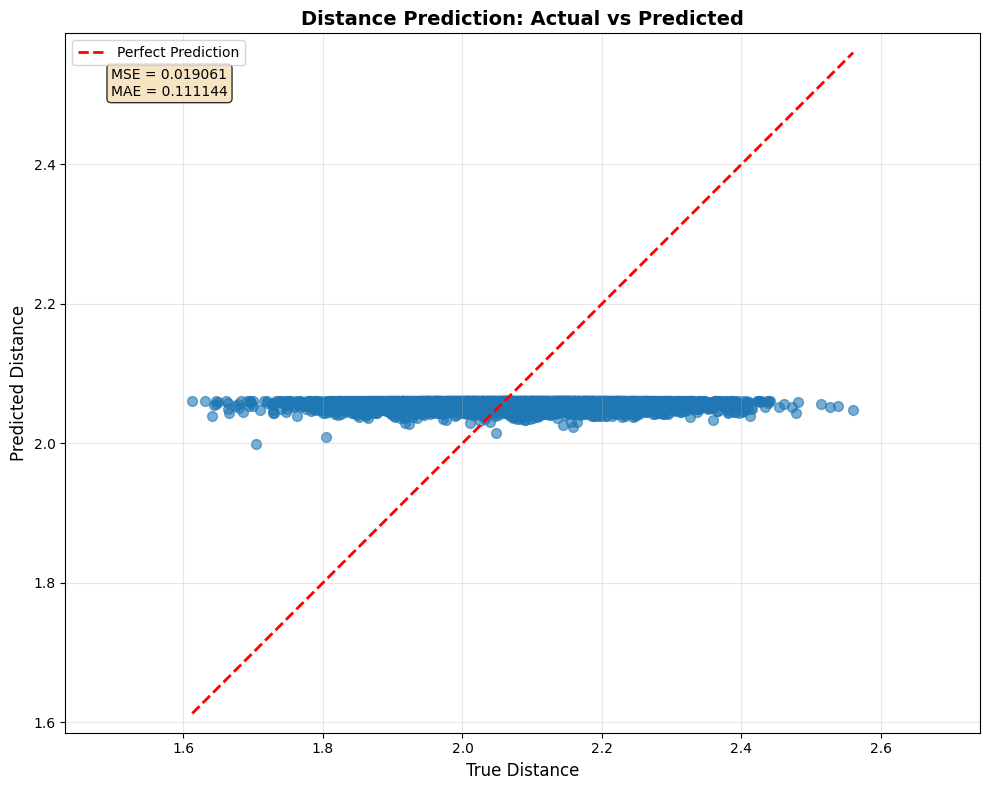

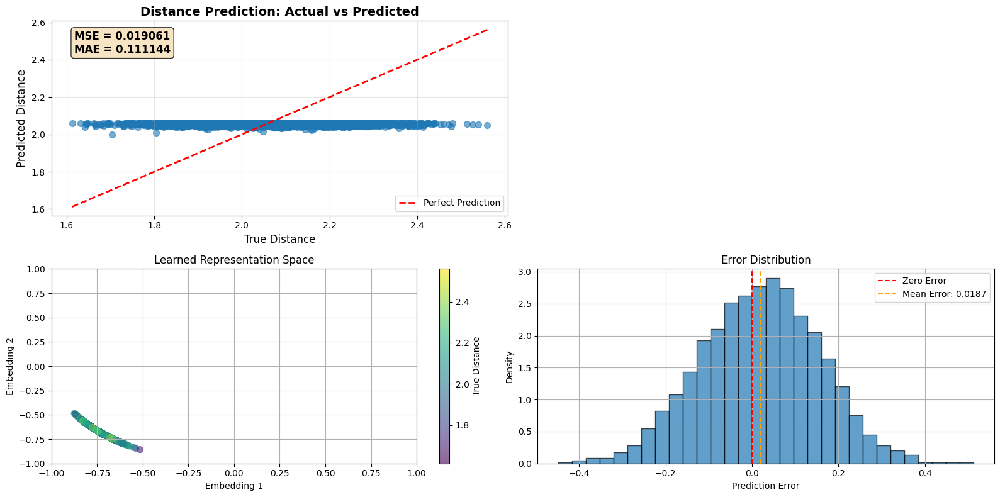

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step

Test Set Performance:
Test Pairwise Correlation: 0.1618
Test Distance Prediction MAE: 0.107471


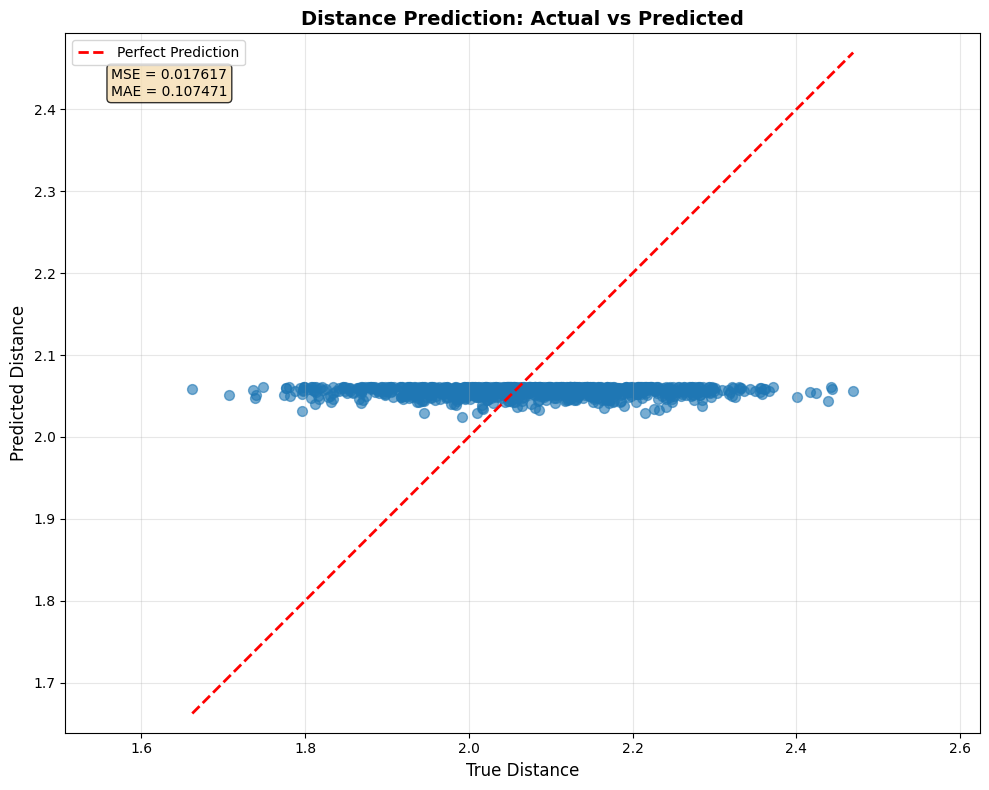

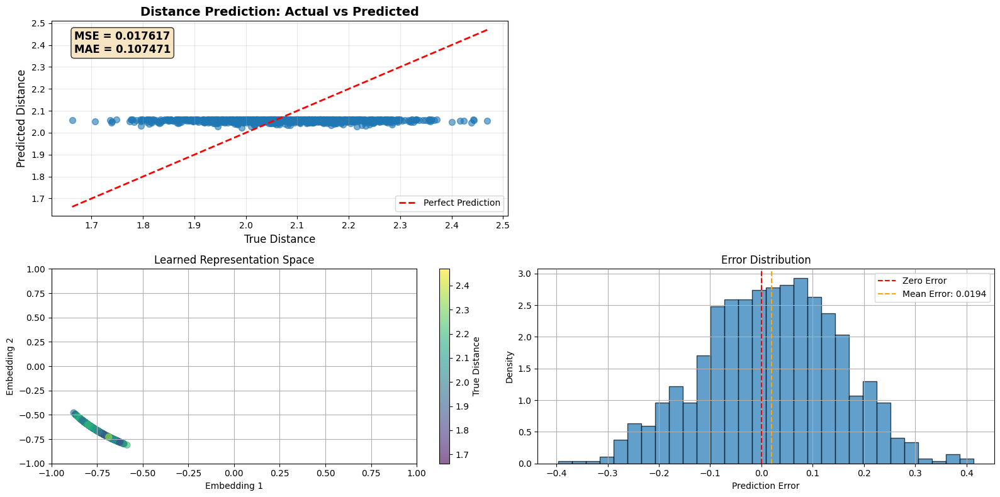

In [39]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pds_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=.5,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step

Training Metrics:
Initial Total Loss: 4.752281
Final Total Loss: 0.113033
Initial Distance Loss: 4.267271
Final Distance Loss: 0.003537
Initial Representation Loss: 0.964176
Final Representation Loss: 0.218723
Convergence Threshold: 0.003327
Model did not converge to threshold
Total Training Time: 16.96 seconds
Average Time per Batch: 10.35 ms

Distance Prediction Metrics:
MSE: 0.003535
MAE: 0.047467

Representation Quality:
Pairwise Correlation: 0.0756
Noise Level Used: 0.15
Final Pairwise Correlation: 0.0756
Distance Prediction MAE: 0.047467


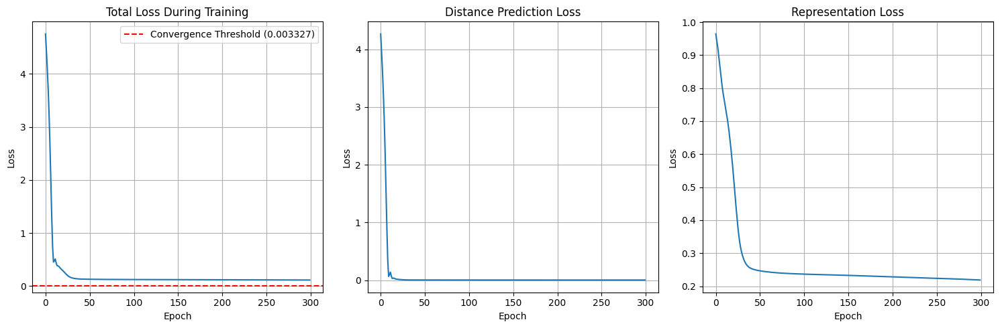

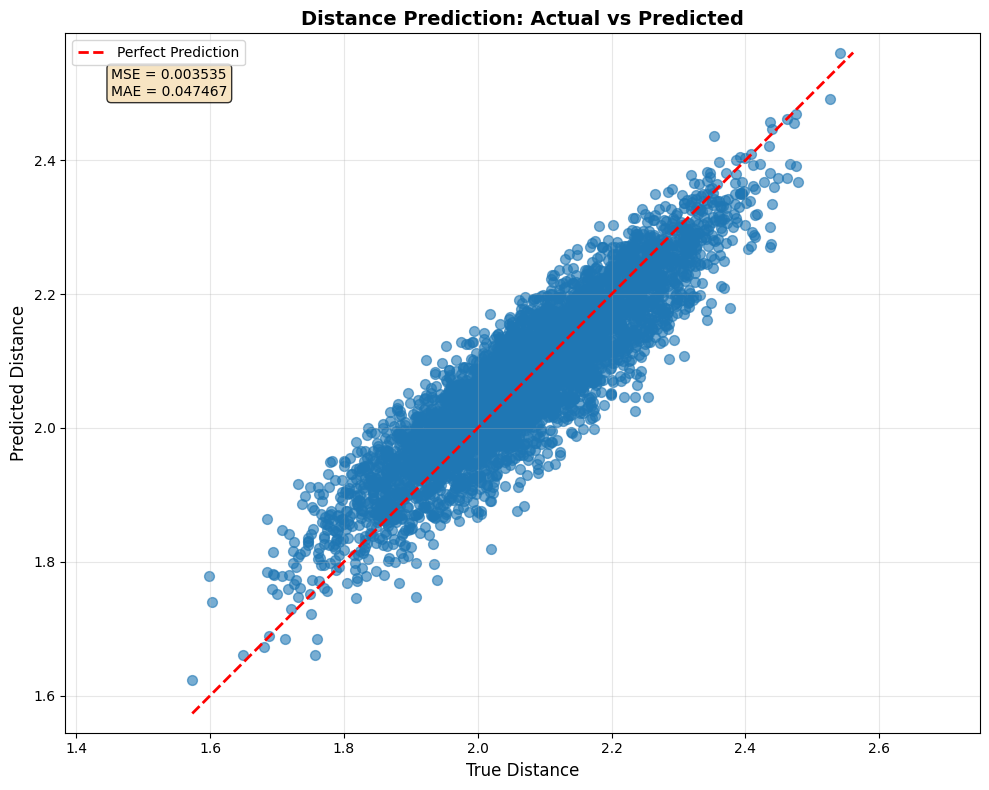

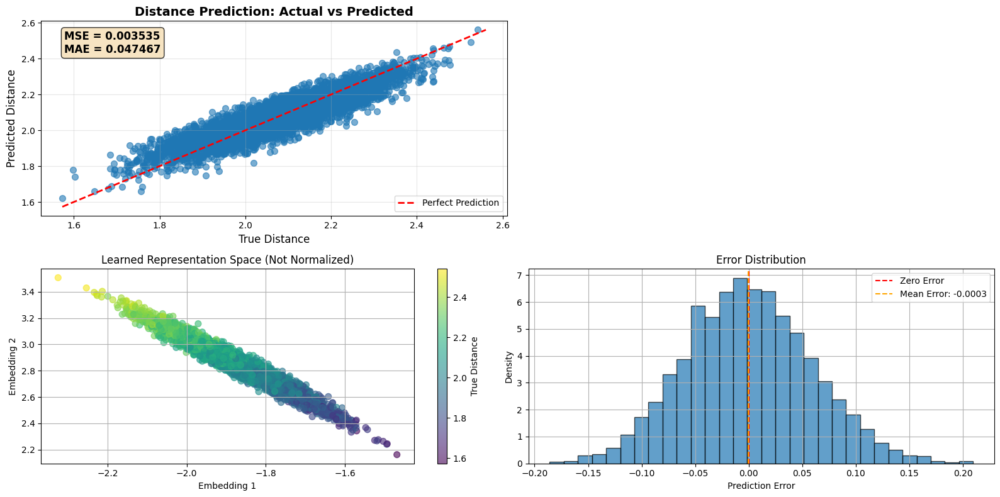

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step

Test Set Performance:
Test Pairwise Correlation: 0.0808
Test Distance Prediction MAE: 0.047748


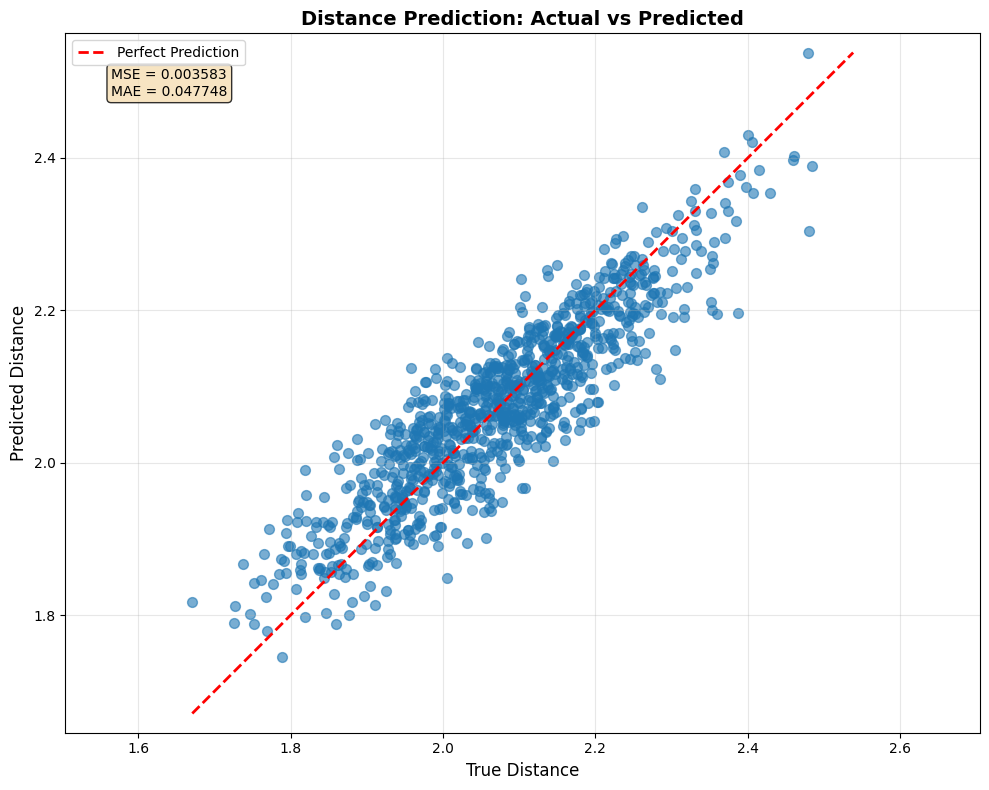

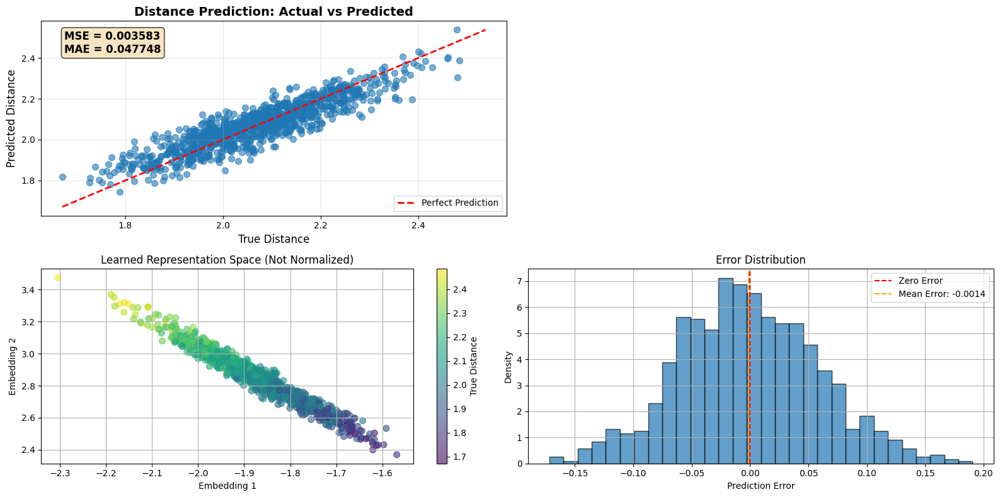

In [7]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=False)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=0.5,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step

Training Metrics:
Initial Total Loss: 9.344448
Final Total Loss: 0.165158
Initial Distance Loss: 8.312140
Final Distance Loss: 0.002596
Initial Representation Loss: 1.001724
Final Representation Loss: 0.162742
Convergence Threshold: 0.006541
Model did not converge to threshold
Total Training Time: 57.07 seconds
Average Time per Batch: 9.25 ms

Distance Prediction Metrics:
MSE: 0.002606
MAE: 0.040649

Representation Quality:
Pairwise Correlation: 0.0667
Noise Level Used: 0.15
Final Pairwise Correlation: 0.0667
Distance Prediction MAE: 0.040649


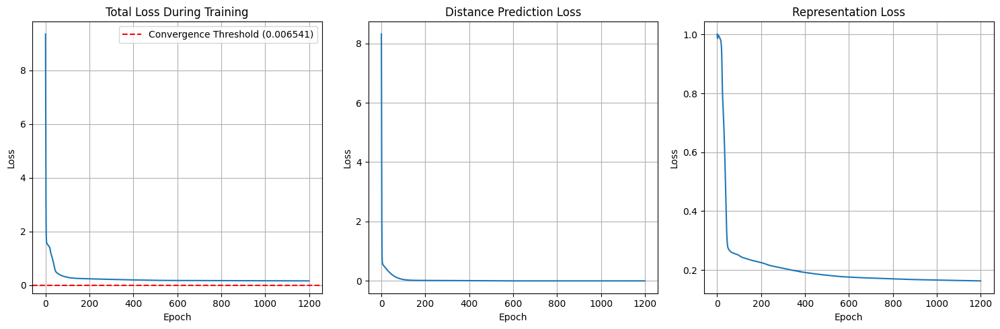

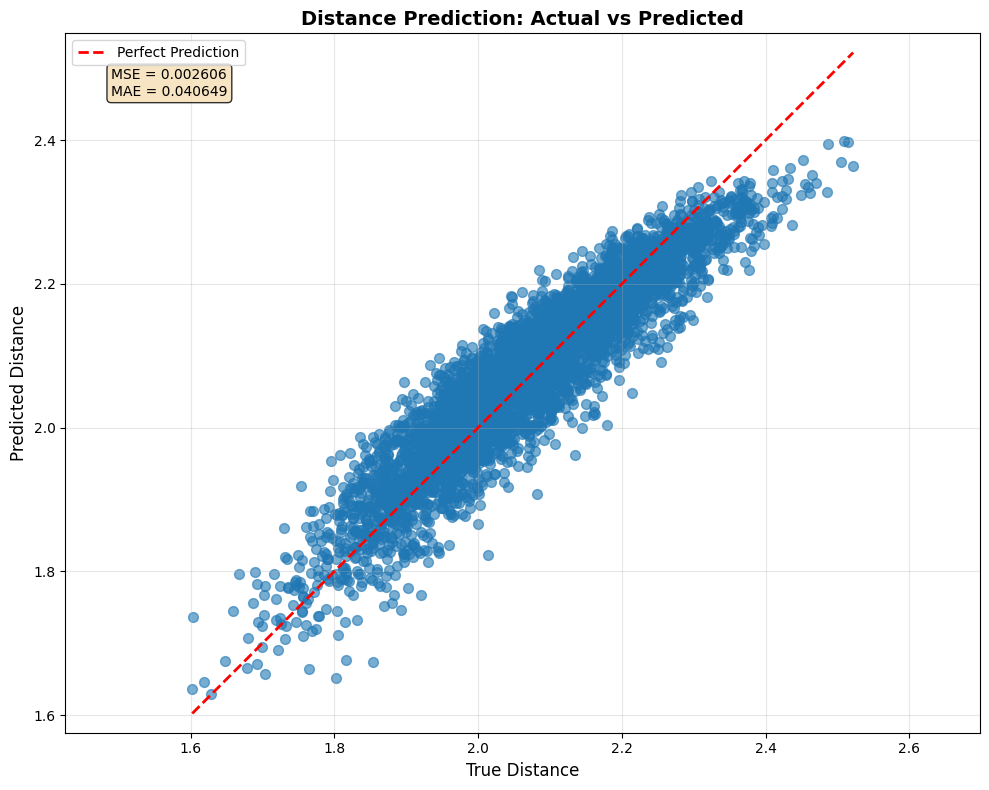

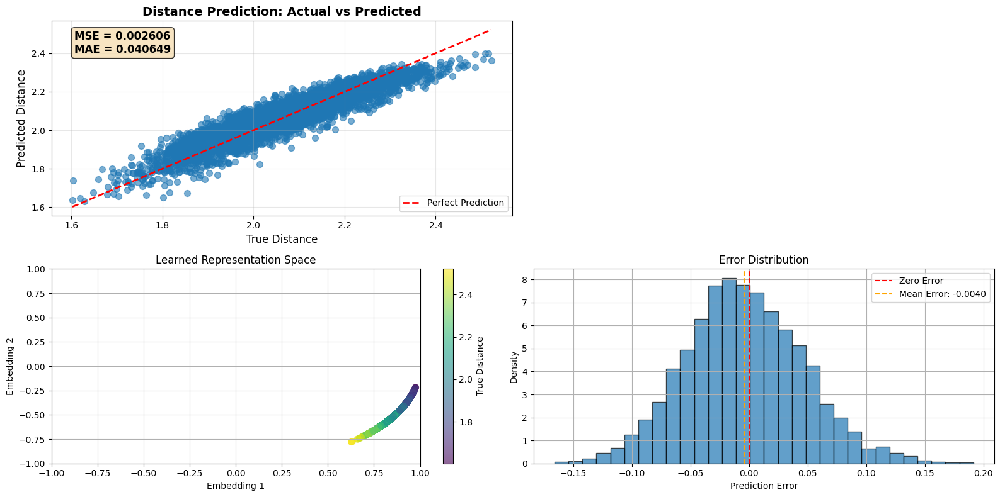

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step

Test Set Performance:
Test Pairwise Correlation: 0.0553
Test Distance Prediction MAE: 0.045286


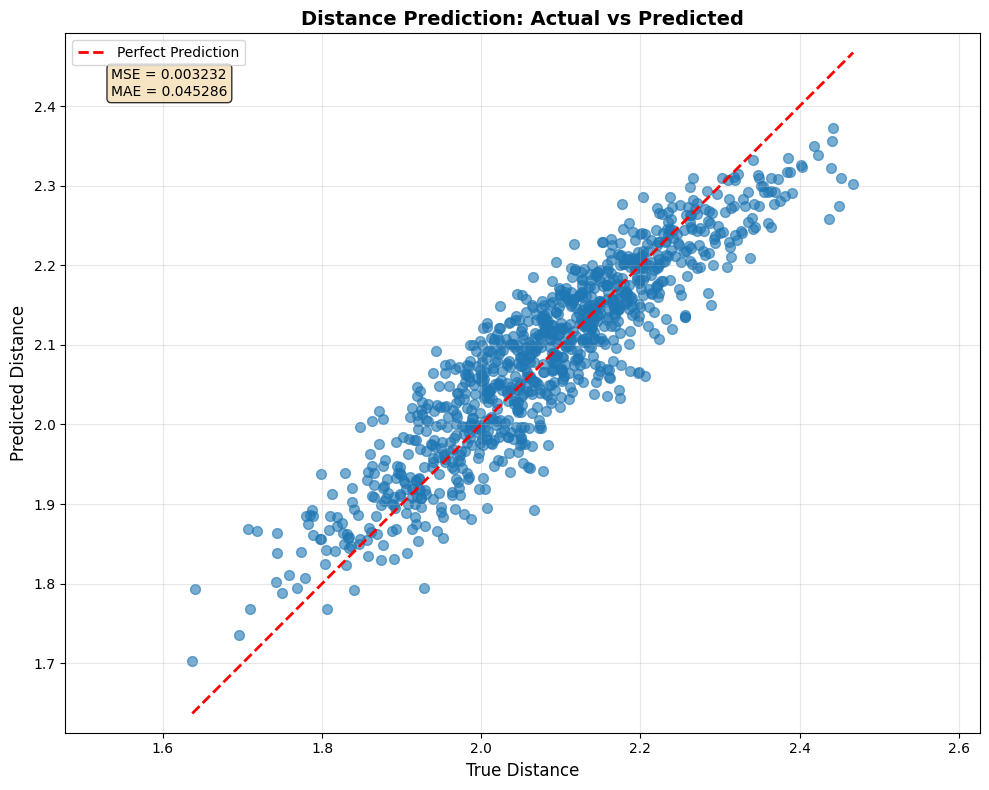

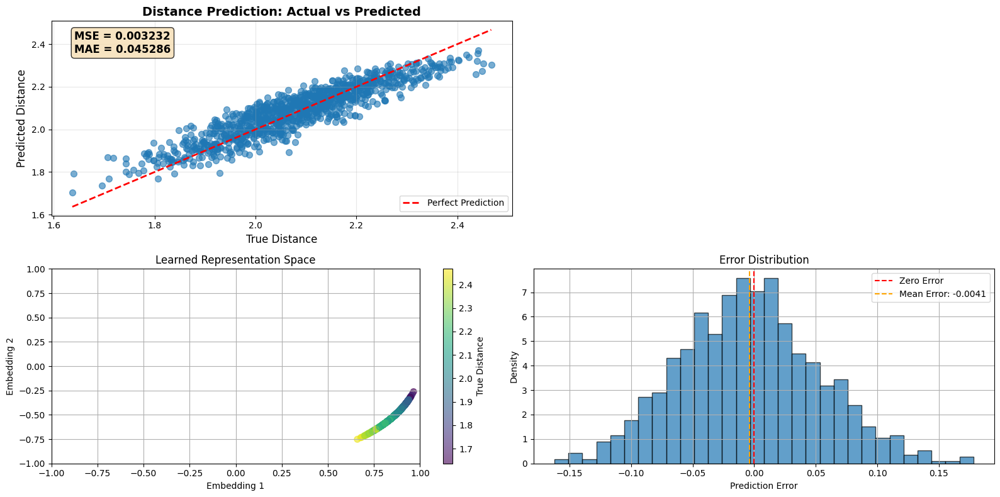

In [59]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=1.0,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=1200, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

In [9]:
class TrainerV4_2:
    def __init__(self, input_dim=2, hidden_dims=None, output_dim=2, embed_dim=2, use_normalize_layer=True, use_Lspread=False, K=1.8):
        if hidden_dims is None:
            hidden_dims = [64, 32]
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim
        self.embed_dim = embed_dim
        self.use_normalize_layer = use_normalize_layer
        self.use_Lspread = use_Lspread
        self.K = K # coefficient for L_spread loss
        self.phase_manager = TrainingPhaseManager()
        self.model = self.build_model()
        self.convergence_threshold = None

        # For tracking global min/max samples
        self.global_min_idx = None
        self.global_max_idx = None
        self.global_y_min = None
        self.global_y_max = None
        self.X_min_sample = None  # Store the actual feature vectors
        self.X_max_sample = None

    def build_model(self):
        inputs = Input(shape=(self.input_dim,))
        x = inputs

        # Hidden layers with Leaky ReLU activation
        for dim in self.hidden_dims:
            x = Dense(dim)(x)
            x = LeakyReLU()(x)

        # Representation output (optionally normalized vector)
        representation_output = Dense(self.embed_dim, name='representation_raw')(x)
        if self.use_normalize_layer:
            representation_output = NormalizeLayer(name='normalize_layer')(representation_output)
            rep_output_name = 'normalize_layer'
        else:
            rep_output_name = 'representation_raw'

        # Distance prediction from representation
        distance_output = Dense(1, name='distance_prediction')(representation_output)

        model = Model(inputs=inputs, outputs=[distance_output, representation_output])
        self.rep_output_name = rep_output_name
        return model

    def generate_synthetic_data(self, num_points=200, noise_level=0.15):
        """Generate synthetic data and store global min/max samples."""
        # Generate more points than needed for sampling
        pool_size = num_points * 10
        features = np.random.uniform(0, 1, (pool_size, self.input_dim))

        # Calculate distances from origin for N-dimensional space
        distances = np.sqrt(np.sum(features ** 2, axis=1))

        # Create weights favoring middle distances
        max_distance = np.sqrt(self.input_dim)
        gaussian_center = max_distance * 0.5

        weights = np.exp(-((distances - gaussian_center) ** 2) / (2 * noise_level ** 2))
        weights = weights / np.sum(weights)

        # Sample indices according to weights
        selected_indices = np.random.choice(
            pool_size,
            size=num_points,
            p=weights,
            replace=False
        )

        # Select the points
        selected_features = features[selected_indices]
        selected_distances = distances[selected_indices]

        # Find global min and max in the selected data
        self.global_min_idx = np.argmin(selected_distances)
        self.global_max_idx = np.argmax(selected_distances)
        self.global_y_min = selected_distances[self.global_min_idx]
        self.global_y_max = selected_distances[self.global_max_idx]

        # Store the actual feature vectors for global min/max samples
        self.X_min_sample = selected_features[self.global_min_idx:self.global_min_idx+1]  # Keep as (1, input_dim)
        self.X_max_sample = selected_features[self.global_max_idx:self.global_max_idx+1]  # Keep as (1, input_dim)

        print(f"Global min: idx={self.global_min_idx}, value={self.global_y_min:.6f}")
        print(f"Global max: idx={self.global_max_idx}, value={self.global_y_max:.6f}")

        return selected_features, selected_distances.reshape(-1, 1)

    def create_spread_loss_function(self):
        """
        Create L_spread loss function that computes: L_spread = (K - dist(z_min, z_max))^2

        This function:
        1. Creates a functional model to extract representations
        2. Gets current embeddings for global min/max samples
        3. Computes the Euclidean distance between them
        4. Returns the squared difference from target distance K
        """
        # Create a functional model to extract representations
        representation_model = Model(
            inputs=self.model.input,
            outputs=self.model.get_layer(self.rep_output_name).output
        )

        # Convert min/max samples to tensors for TensorFlow operations
        X_min_tensor = tf.constant(self.X_min_sample, dtype=tf.float32)
        X_max_tensor = tf.constant(self.X_max_sample, dtype=tf.float32)

        def spread_loss_fn(y_true, y_pred):
            """
            L_spread loss function.

            Args:
                y_true: Ground truth (not used in spread loss computation)
                y_pred: Model predictions (not used in spread loss computation)

            Returns:
                L_spread = (K - dist(z_min, z_max))^2
            """
            # Get current embeddings for global min/max samples
            z_min = representation_model(X_min_tensor)[0]  # Get first (and only) sample
            z_max = representation_model(X_max_tensor)[0]  # Get first (and only) sample

            # Compute Euclidean distance between embeddings
            embedding_distance = tf.norm(z_min - z_max)

            # L_spread = (K - dist(z_min, z_max))^2
            spread_loss = tf.square(self.K - embedding_distance)

            return spread_loss

        return spread_loss_fn

    def compute_pairwise_correlation(self, features, predictions):
        """Compute pairwise correlation between features and predictions."""
        feat_dists = tf.reduce_sum(tf.square(features[:, tf.newaxis] - features[tf.newaxis, :]), axis=-1)
        pred_dists = tf.reduce_sum(tf.square(predictions[:, tf.newaxis] - predictions[tf.newaxis, :]), axis=-1)

        # Flatten the distance matrices
        feat_dists_flat = feat_dists.numpy().flatten()
        pred_dists_flat = pred_dists.numpy().flatten()

        # Compute correlation
        correlation, _ = pearsonr(feat_dists_flat, pred_dists_flat)
        return correlation

    def compute_distance_metrics(self, y_true, y_pred):
        """Compute evaluation metrics for distance prediction."""
        mse = tf.keras.losses.mse(y_true, y_pred).numpy().mean()
        mae = tf.keras.losses.mae(y_true, y_pred).numpy().mean()
        return {
            'mse': mse,
            'mae': mae,
        }

    def train(
        self,
        representation_loss_fn=None,
        distance_loss_weight=1.0,
        representation_loss_weight=0.5,
        spread_loss_weight=0.1,
        representation_targets=None,
        num_points=2000,
        epochs=1000,
        batch_size=32,
        noise_level=0.15,
        verbose=0):
        """Train the model with optional L_spread term computed at every iteration."""

        # Generate synthetic data and identify global min/max
        X_train, y_distance = self.generate_synthetic_data(num_points=num_points, noise_level=noise_level)

        # Set representation targets
        if representation_targets is None:
            y_representation = X_train
        else:
            y_representation = representation_targets

        # Set representation loss function
        if representation_loss_fn is None:
            representation_loss_fn = 'mse'

        # Standard losses and targets
        loss_dict = {
            'distance_prediction': 'mse',
            self.rep_output_name: representation_loss_fn
        }
        loss_weights_dict = {
            'distance_prediction': distance_loss_weight,
            self.rep_output_name: representation_loss_weight
        }
        metrics_dict = {
            'distance_prediction': ['mae'],
            self.rep_output_name: []
        }
        targets = {
            'distance_prediction': y_distance,
            self.rep_output_name: y_representation
        }

        # Add spread loss if enabled
        if self.use_Lspread:
            # Create the spread loss function
            spread_loss_fn = self.create_spread_loss_function()

            # Store original representation loss
            original_rep_loss = representation_loss_fn

            def combined_rep_loss(y_true, y_pred):
                """Combine original representation loss with spread loss."""
                # Original representation loss
                if callable(original_rep_loss):
                    orig_loss = original_rep_loss(y_true, y_pred)
                else:
                    if original_rep_loss == 'mse':
                        orig_loss = tf.reduce_mean(tf.keras.losses.mse(y_true, y_pred))
                    else:
                        orig_loss = tf.constant(0.0, dtype=tf.float32)

                # Spread loss (computed using current global min/max embeddings)
                spread_loss = spread_loss_fn(y_true, y_pred)

                # Combine losses
                total_loss = orig_loss + spread_loss_weight * spread_loss

                return total_loss

            # Update the loss function for representations
            loss_dict[self.rep_output_name] = combined_rep_loss

        # Compile model
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=loss_dict,
            loss_weights=loss_weights_dict,
            metrics=metrics_dict
        )

        # Convert to tf.data.Dataset
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, targets))
        train_dataset = train_dataset.batch(batch_size)

        # Training setup with spread loss tracking
        start_time = time.time()
        batch_times = []
        convergence_epoch = None
        convergence_time = None
        spread_losses = []  # Track spread loss over time

        class SpreadLossTracker(tf.keras.callbacks.Callback):
            def __init__(self, trainer):
                super().__init__()
                self.trainer = trainer
                self.representation_model = None

            def on_train_begin(self, logs=None):
                if self.trainer.use_Lspread:
                    # Create representation model for tracking
                    self.representation_model = Model(
                        inputs=self.trainer.model.input,
                        outputs=self.trainer.model.get_layer(self.trainer.rep_output_name).output
                    )

            def on_epoch_end(self, epoch, logs=None):
                if self.trainer.use_Lspread and self.representation_model is not None:
                    # Compute current spread loss
                    z_min = self.representation_model(self.trainer.X_min_sample)[0]
                    z_max = self.representation_model(self.trainer.X_max_sample)[0]
                    current_distance = np.linalg.norm(z_min.numpy() - z_max.numpy())
                    current_spread_loss = (self.trainer.K - current_distance) ** 2
                    spread_losses.append(current_spread_loss)

                    if epoch % 50 == 0 or epoch < 10:  # Print periodically
                        print(f"Epoch {epoch}: Embedding distance = {current_distance:.6f}, "
                              f"Spread loss = {current_spread_loss:.6f}, Target K = {self.trainer.K}")

        class ConvergenceCallback(tf.keras.callbacks.Callback):
            def __init__(self, trainer, threshold_factor=0.0007):
                super().__init__()
                self.trainer = trainer
                self.threshold_factor = threshold_factor
                self.first_loss = None
                self.convergence_reached = False
                self.batch_start_time = None

            def on_train_begin(self, logs=None):
                self.batch_start_time = time.time()

            def on_batch_end(self, batch, logs=None):
                batch_end_time = time.time()
                batch_duration = batch_end_time - self.batch_start_time
                batch_times.append(batch_duration)
                self.batch_start_time = batch_end_time

            def on_epoch_end(self, epoch, logs=None):
                current_loss = logs['loss']
                if self.first_loss is None:
                    self.first_loss = current_loss
                    self.trainer.convergence_threshold = self.first_loss * self.threshold_factor

                if not self.convergence_reached and current_loss <= self.trainer.convergence_threshold:
                    self.convergence_reached = True
                    nonlocal convergence_epoch, convergence_time
                    convergence_epoch = epoch + 1
                    convergence_time = time.time() - start_time

        # Create callbacks
        convergence_callback = ConvergenceCallback(self)
        spread_tracker = SpreadLossTracker(self)

        # Training
        history = self.model.fit(
            train_dataset,
            epochs=epochs,
            verbose=verbose,
            callbacks=[
                IsTraining(self.phase_manager),
                convergence_callback,
                spread_tracker
            ]
        )

        # Final predictions and evaluation
        predictions = self.model.predict(X_train)
        distance_predictions = predictions[0]
        representation_predictions = predictions[1]

        distance_metrics = self.compute_distance_metrics(y_distance, distance_predictions)
        correlation = self.compute_pairwise_correlation(X_train, representation_predictions)

        # Print results
        total_time = time.time() - start_time
        avg_batch_time = np.mean(batch_times)

        print("\nTraining Metrics:")
        print(f"Initial Total Loss: {history.history['loss'][0]:.6f}")
        print(f"Final Total Loss: {history.history['loss'][-1]:.6f}")
        print(f"Initial Distance Loss: {history.history['distance_prediction_loss'][0]:.6f}")
        print(f"Final Distance Loss: {history.history['distance_prediction_loss'][-1]:.6f}")

        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            print(f"Initial Representation Loss: {history.history[rep_loss_key][0]:.6f}")
            print(f"Final Representation Loss: {history.history[rep_loss_key][-1]:.6f}")

        if self.use_Lspread:
            print(f"\nL_spread Analysis:")
            print(f"K (target distance): {self.K}")
            print(f"Spread loss weight: {spread_loss_weight}")

            # Compute final spread metrics
            z_min = representation_predictions[self.global_min_idx]
            z_max = representation_predictions[self.global_max_idx]
            final_spread_distance = np.linalg.norm(z_min - z_max)
            final_spread_loss = (self.K - final_spread_distance) ** 2

            print(f"Final embedding distance between global min/max: {final_spread_distance:.6f}")
            print(f"Final spread loss: {final_spread_loss:.6f}")

            if len(spread_losses) > 0:
                print(f"Initial spread loss: {spread_losses[0]:.6f}")
                print(f"Spread loss reduction: {((spread_losses[0] - spread_losses[-1]) / spread_losses[0] * 100):.2f}%")

        print(f"\nTraining Summary:")
        print(f"Convergence Threshold: {self.convergence_threshold:.6f}")

        if convergence_epoch:
            print(f"Convergence Epoch: {convergence_epoch}")
            print(f"Time to Convergence: {convergence_time:.2f} seconds")
        else:
            print("Model did not converge to threshold")

        print(f"Total Training Time: {total_time:.2f} seconds")
        print(f"Average Time per Batch: {avg_batch_time * 1000:.2f} ms")

        print("\nDistance Prediction Metrics:")
        print(f"MSE: {distance_metrics['mse']:.6f}")
        print(f"MAE: {distance_metrics['mae']:.6f}")

        print(f"\nRepresentation Quality:")
        print(f"Pairwise Correlation: {correlation:.4f}")
        print(f"Noise Level Used: {noise_level}")

        # Store spread losses in history for plotting
        if self.use_Lspread:
            history.history['spread_losses'] = spread_losses

        return history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance

    def plot_training_history(self, history):
        """Plot the training losses over epochs, including spread loss tracking."""
        if self.use_Lspread and 'spread_losses' in history.history:
            plt.figure(figsize=(20, 5))
            subplot_count = 4
        else:
            plt.figure(figsize=(15, 5))
            subplot_count = 3

        # Total loss
        plt.subplot(1, subplot_count, 1)
        plt.plot(history.history['loss'])
        if self.convergence_threshold:
            plt.axhline(y=self.convergence_threshold, color='r', linestyle='--',
                        label=f'Convergence Threshold ({self.convergence_threshold:.6f})')
        plt.title('Total Loss During Training')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        plt.legend()

        # Distance prediction loss
        plt.subplot(1, subplot_count, 2)
        plt.plot(history.history['distance_prediction_loss'])
        plt.title('Distance Prediction Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)

        # Representation loss
        plt.subplot(1, subplot_count, 3)
        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            plt.plot(history.history[rep_loss_key])
            title = 'Representation Loss'
            if self.use_Lspread:
                title += f' (includes L_spread)'
            plt.title(title)
        else:
            plt.plot([])
            plt.title('Representation Loss (N/A)')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)

        # Spread loss tracking (if available)
        if self.use_Lspread and 'spread_losses' in history.history:
            plt.subplot(1, subplot_count, 4)
            plt.plot(history.history['spread_losses'])
            plt.axhline(y=0, color='r', linestyle='--', alpha=0.5, label='Target (0)')
            plt.title(f'L_spread Loss (K={self.K})')
            plt.xlabel('Epoch')
            plt.ylabel('Spread Loss')
            plt.grid(True)
            plt.legend()

        plt.tight_layout()
        plt.show()

    def plot_actual_vs_predicted(self, true_distances, predicted_distances):
        """Plot actual vs predicted distances with performance metrics."""
        plt.figure(figsize=(10, 8))

        # Main scatter plot
        plt.scatter(true_distances, predicted_distances, alpha=0.6, s=50)

        # Perfect prediction line
        min_dist = min(true_distances.min(), predicted_distances.min())
        max_dist = max(true_distances.max(), predicted_distances.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')

        # Calculate and display metrics
        residuals = true_distances.flatten() - predicted_distances.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))

        # Add metrics to plot
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Make plot square for better visualization
        plt.axis('equal')
        plt.tight_layout()
        plt.show()

    def plot_predictions(self, features, labels, distance_predictions, representation_predictions):
        """Plot original data and representations with actual vs predicted."""
        plt.figure(figsize=(16, 8))

        # Actual vs Predicted (prominent first plot)
        plt.subplot(2, 2, 1)
        plt.scatter(labels, distance_predictions, alpha=0.6, s=50)
        min_dist = min(labels.min(), distance_predictions.min())
        max_dist = max(labels.max(), distance_predictions.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')

        # Calculate metrics
        residuals = labels.flatten() - distance_predictions.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                fontsize=12, fontweight='bold')

        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Representation space (embedding)
        plt.subplot(2, 2, 3)
        scatter = plt.scatter(
            representation_predictions[:, 0],
            representation_predictions[:, 1],
            c=labels.flatten(),
            cmap='viridis',
            alpha=0.6,
            s=50
        )

        # Highlight global min/max samples
        # if self.global_min_idx is not None and self.global_max_idx is not None:
        #     z_min = representation_predictions[self.global_min_idx]
        #     z_max = representation_predictions[self.global_max_idx]
        #     plt.scatter(z_min[0], z_min[1], c='red', s=200, marker='x', linewidths=3, label=f'Global Min (y={self.global_y_min:.3f})')
        #     plt.scatter(z_max[0], z_max[1], c='blue', s=200, marker='x', linewidths=3, label=f'Global Max (y={self.global_y_max:.3f})')

        #     # Draw line between them
        #     plt.plot([z_min[0], z_max[0]], [z_min[1], z_max[1]], 'k--', alpha=0.7, linewidth=2)

        #     # Add distance annotation
        #     distance = np.linalg.norm(z_min - z_max)
        #     mid_x, mid_y = (z_min[0] + z_max[0]) / 2, (z_min[1] + z_max[1]) / 2
        #     plt.annotate(f'd={distance:.3f}', (mid_x, mid_y), xytext=(5, 5),
        #                 textcoords='offset points', fontsize=10,
        #                 bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

        #     plt.legend()

        plt.colorbar(scatter, label='True Distance')
        title = 'Learned Representation Space'
        if self.use_Lspread:
            title += f' (L_spread: K={self.K})'
        if not self.use_normalize_layer:
            title += ' (Not Normalized)'
        plt.title(title)
        plt.xlabel('Embedding 1')
        plt.ylabel('Embedding 2')

        # Only set axis limits if normalized
        if self.use_normalize_layer:
            plt.xlim(-1.1, 1.1)
            plt.ylim(-1.1, 1.1)
        plt.grid(True)

        # Error distribution
        plt.subplot(2, 2, 4)
        plt.hist(residuals, bins=30, density=True, alpha=0.7, edgecolor='black')
        plt.axvline(x=0, color='r', linestyle='--', label='Zero Error')
        plt.axvline(
            x=np.mean(residuals),
            color='orange',
            linestyle='--',
            label=f'Mean Error: {np.mean(residuals):.4f}'
        )
        plt.xlabel('Prediction Error')
        plt.ylabel('Density')
        plt.title('Error Distribution')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def plot_data_distribution(self, features, labels):
        """Plot the distribution of data points and their labels (adapted for N-D)."""
        plt.figure(figsize=(15, 5))

        # For N > 2, plot first two dimensions only
        plt.subplot(1, 3, 1)
        scatter = plt.scatter(features[:, 0], features[:, 1], c=labels, cmap='viridis')
        plt.colorbar(scatter, label='Distance from Origin')
        plt.title(f'Data Points (First 2 of {self.input_dim} dims) Colored by Distance')
        plt.xlabel('X1')
        plt.ylabel('X2')

        # Plot distance distribution
        plt.subplot(1, 3, 2)
        plt.hist(labels, bins=30, density=True)

        # Add the target distribution curve
        max_distance = np.sqrt(self.input_dim)
        x = np.linspace(0, max_distance, 100)
        gaussian_center = max_distance * 0.5
        target_dist = np.exp(-((x - gaussian_center) ** 2) / (2 * 0.15 ** 2))
        target_dist = target_dist / np.max(target_dist) * plt.gca().get_ylim()[1]
        plt.plot(x, target_dist, 'r--', label='Target Distribution')
        plt.legend()

        plt.title(f'Distribution of Distances (N={self.input_dim})')
        plt.xlabel('Distance from Origin')
        plt.ylabel('Density')

        # Plot points with reference circles (first 2 dimensions)
        plt.subplot(1, 3, 3)
        plt.scatter(features[:, 0], features[:, 1], alpha=0.5)

        # Add quarter circles at different radii (adjusted for N dimensions)
        max_2d_distance = np.sqrt(2)  # For visualization in 2D
        for radius in np.linspace(0.25, max_2d_distance, 4):
            circle = plt.Circle((0, 0), radius, fill=False, color='red', alpha=0.3)
            plt.gca().add_artist(circle)

        plt.axis('equal')
        plt.title(f'Points with Reference Circles (2D projection of {self.input_dim}D)')
        plt.xlabel('X1')
        plt.ylabel('X2')
        plt.grid(True)

        plt.tight_layout()
        plt.show()

Global min: idx=4939, value=1.627007
Global max: idx=4045, value=2.553147
Epoch 0: Embedding distance = 0.119895, Spread loss = 2.822752, Target K = 1.8
Epoch 1: Embedding distance = 0.062107, Spread loss = 3.020270, Target K = 1.8
Epoch 2: Embedding distance = 0.067594, Spread loss = 3.001231, Target K = 1.8
Epoch 3: Embedding distance = 0.179185, Spread loss = 2.627042, Target K = 1.8
Epoch 4: Embedding distance = 0.492313, Spread loss = 1.710046, Target K = 1.8
Epoch 5: Embedding distance = 0.805978, Spread loss = 0.988080, Target K = 1.8
Epoch 6: Embedding distance = 0.864668, Spread loss = 0.874846, Target K = 1.8
Epoch 7: Embedding distance = 0.927963, Spread loss = 0.760448, Target K = 1.8
Epoch 8: Embedding distance = 0.986783, Spread loss = 0.661322, Target K = 1.8
Epoch 9: Embedding distance = 0.998448, Spread loss = 0.642486, Target K = 1.8
Epoch 50: Embedding distance = 1.404492, Spread loss = 0.156426, Target K = 1.8
Epoch 100: Embedding distance = 1.667081, Spread loss = 

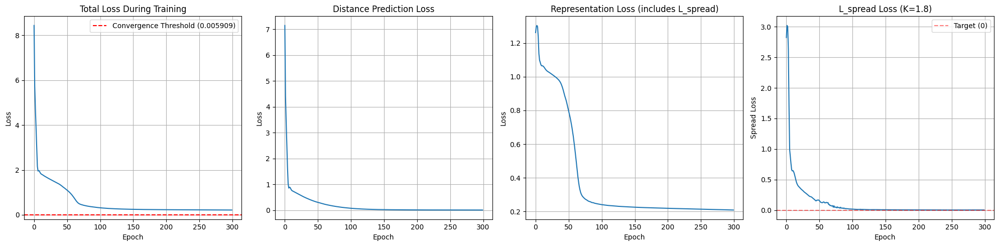

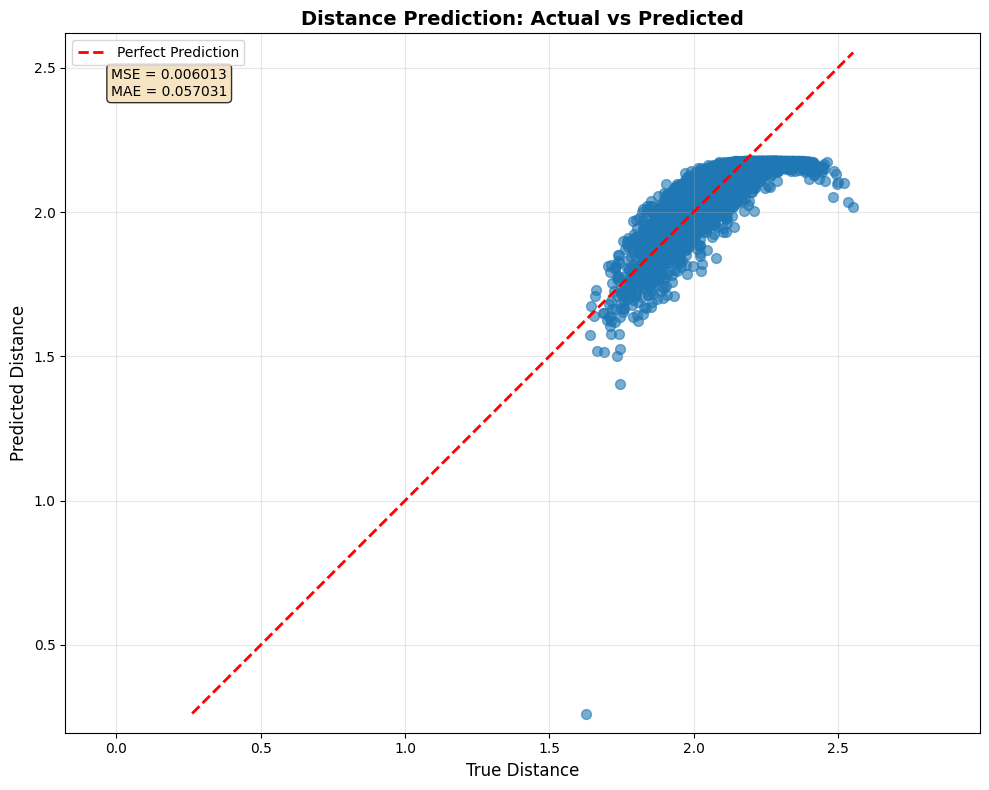

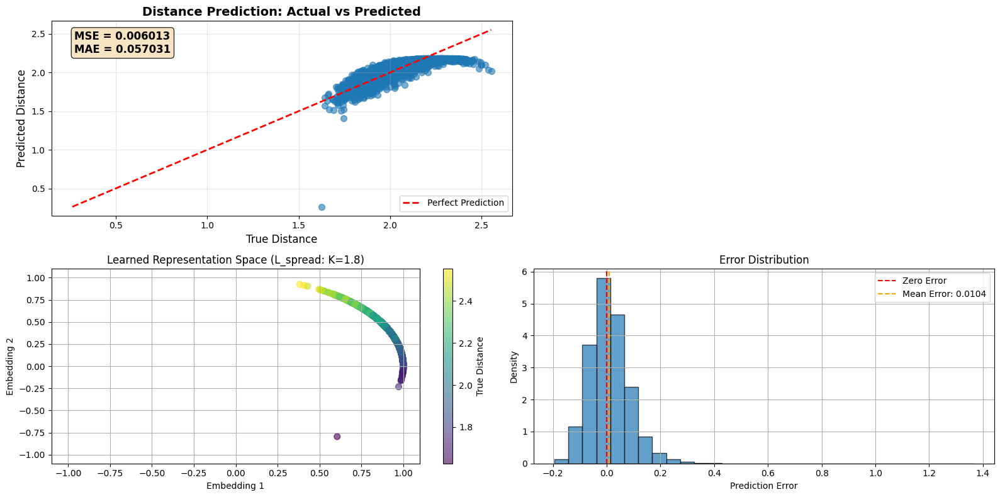

Global min: idx=520, value=1.621459
Global max: idx=999, value=2.505467
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step

Test Set Performance:
Test Pairwise Correlation: 0.0632
Test Distance Prediction MAE: 0.056220


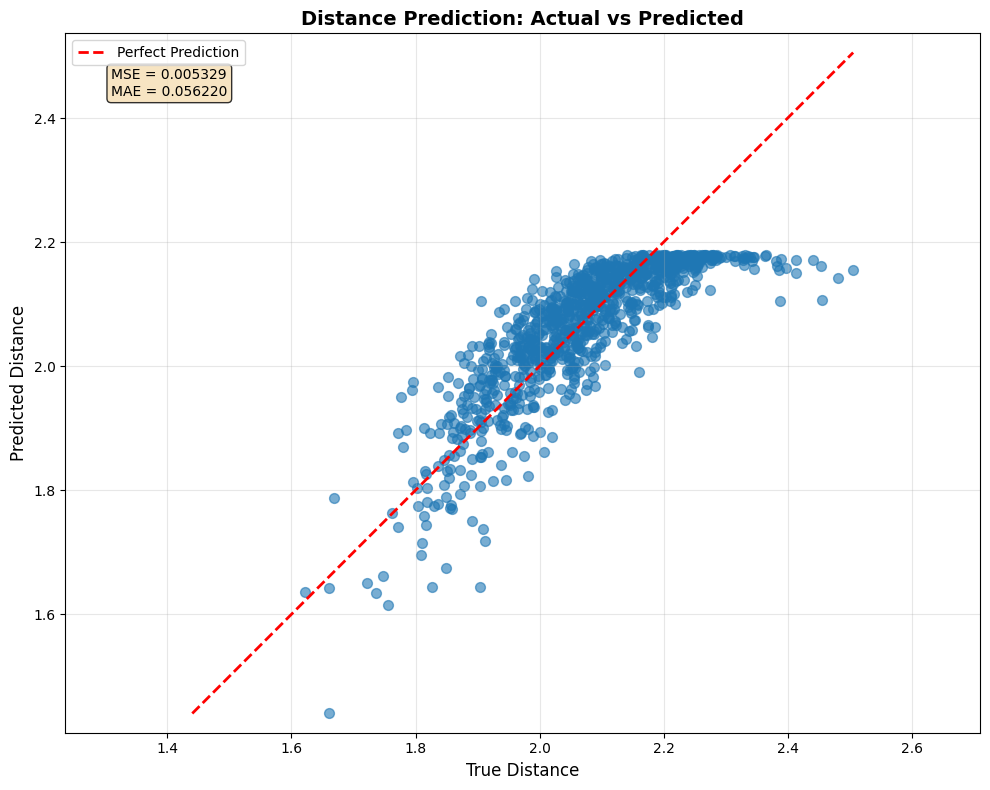

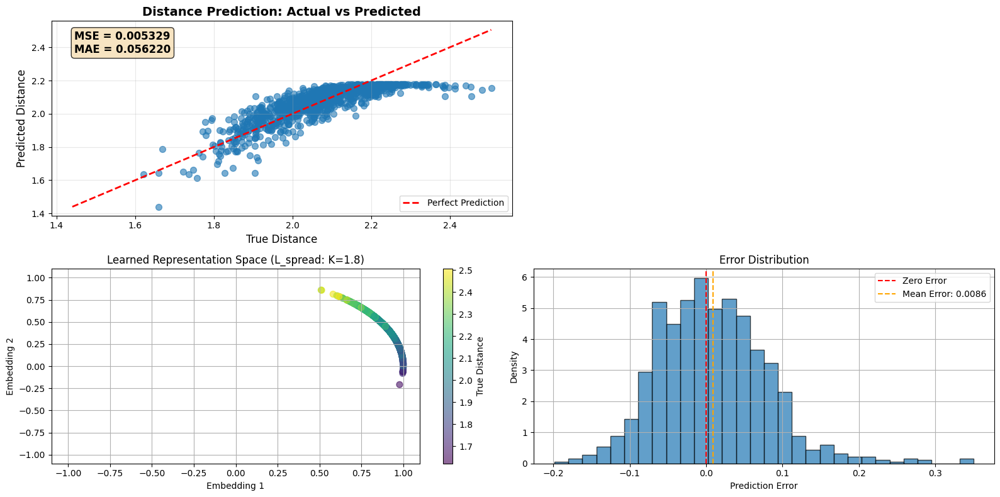

In [16]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.8 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=4812, value=1.622252
Global max: idx=4566, value=2.681754
Epoch 0: Embedding distance = 0.080008, Spread loss = 1.742378, Target K = 1.4
Epoch 1: Embedding distance = 0.069390, Spread loss = 1.770522, Target K = 1.4
Epoch 2: Embedding distance = 0.094180, Spread loss = 1.705166, Target K = 1.4
Epoch 3: Embedding distance = 0.115954, Spread loss = 1.648774, Target K = 1.4
Epoch 4: Embedding distance = 0.238147, Spread loss = 1.349902, Target K = 1.4
Epoch 5: Embedding distance = 0.261923, Spread loss = 1.295218, Target K = 1.4
Epoch 6: Embedding distance = 0.318239, Spread loss = 1.170207, Target K = 1.4
Epoch 7: Embedding distance = 0.373194, Spread loss = 1.054331, Target K = 1.4
Epoch 8: Embedding distance = 0.427771, Spread loss = 0.945230, Target K = 1.4
Epoch 9: Embedding distance = 0.475989, Spread loss = 0.853797, Target K = 1.4
Epoch 50: Embedding distance = 1.051600, Spread loss = 0.121382, Target K = 1.4
Epoch 100: Embedding distance = 1.225159, Spread loss = 

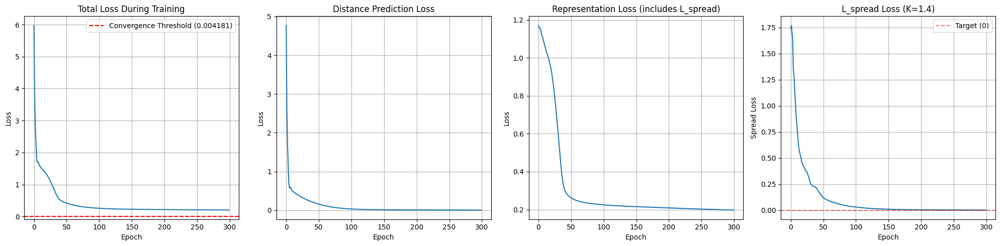

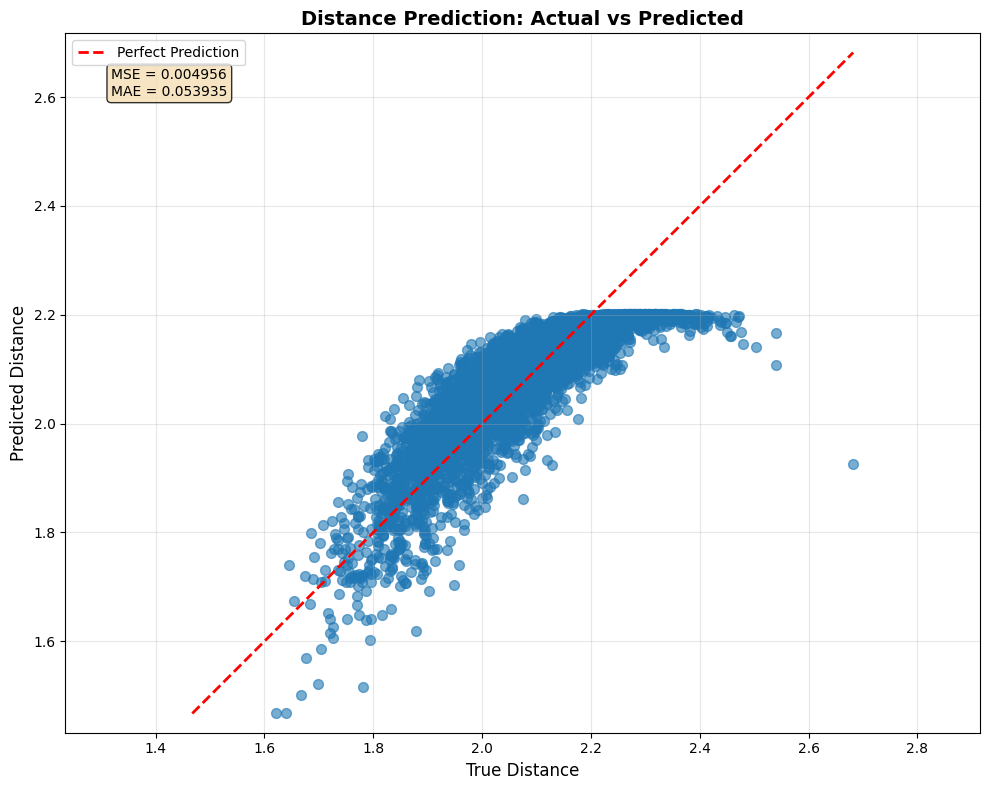

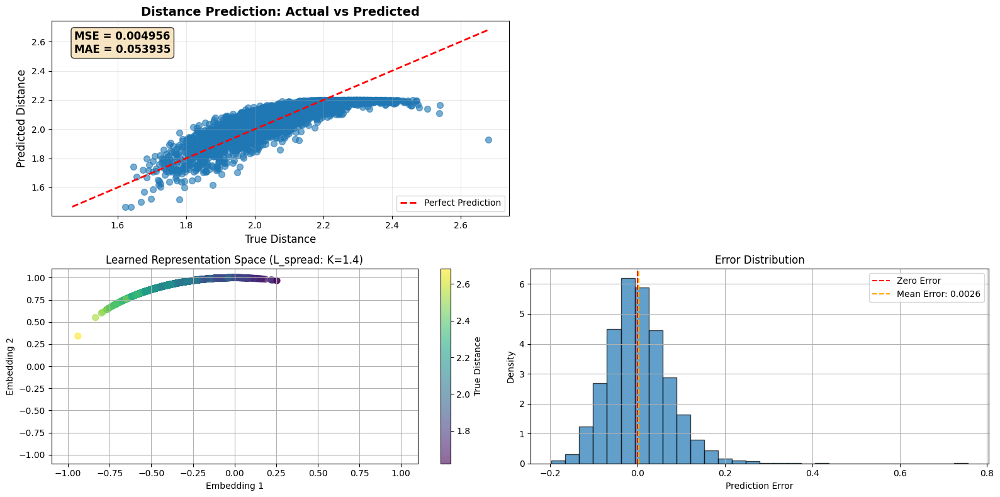

Global min: idx=751, value=1.667115
Global max: idx=436, value=2.480653
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step

Test Set Performance:
Test Pairwise Correlation: 0.0954
Test Distance Prediction MAE: 0.058406


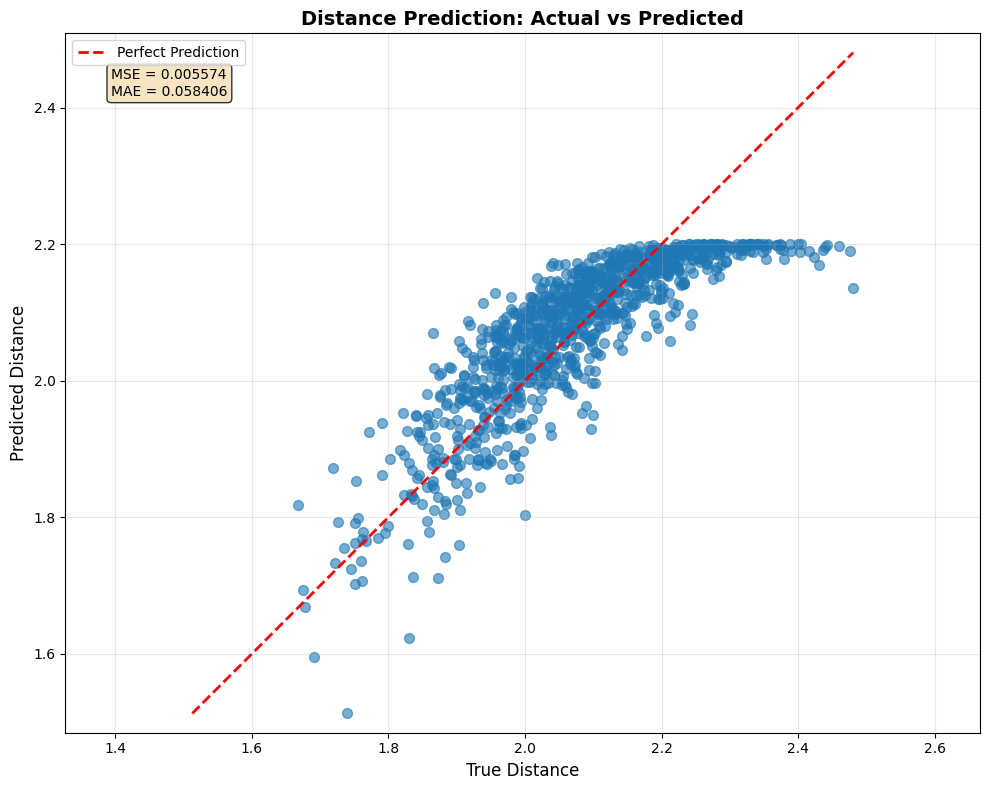

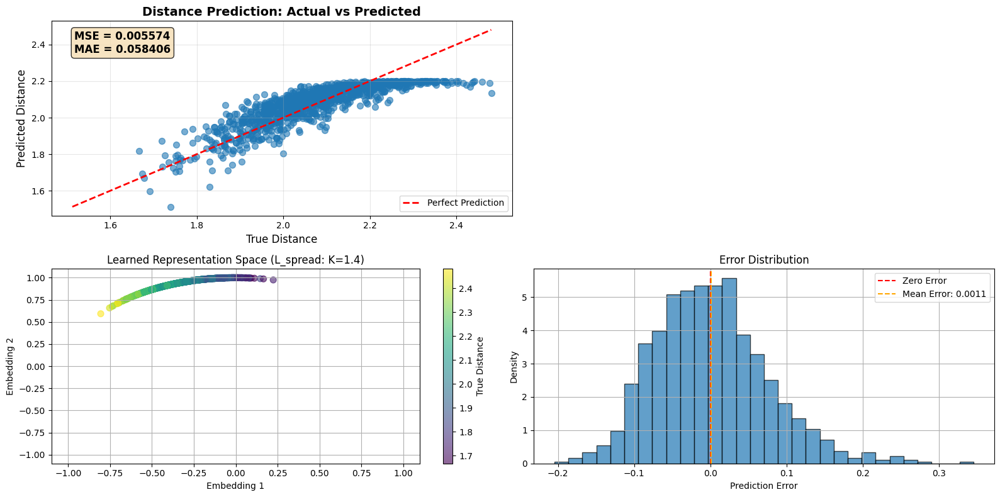

In [17]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.4 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=3319, value=1.621838
Global max: idx=2432, value=2.553281
Epoch 0: Embedding distance = 0.275160, Spread loss = 0.525393, Target K = 1.0
Epoch 1: Embedding distance = 0.646112, Spread loss = 0.125237, Target K = 1.0
Epoch 2: Embedding distance = 0.233885, Spread loss = 0.586933, Target K = 1.0
Epoch 3: Embedding distance = 0.099018, Spread loss = 0.811768, Target K = 1.0
Epoch 4: Embedding distance = 0.091828, Spread loss = 0.824776, Target K = 1.0
Epoch 5: Embedding distance = 0.108640, Spread loss = 0.794523, Target K = 1.0
Epoch 6: Embedding distance = 0.126597, Spread loss = 0.762832, Target K = 1.0
Epoch 7: Embedding distance = 0.142873, Spread loss = 0.734667, Target K = 1.0
Epoch 8: Embedding distance = 0.158355, Spread loss = 0.708366, Target K = 1.0
Epoch 9: Embedding distance = 0.172188, Spread loss = 0.685273, Target K = 1.0
Epoch 50: Embedding distance = 0.696283, Spread loss = 0.092244, Target K = 1.0
Epoch 100: Embedding distance = 0.781418, Spread loss = 

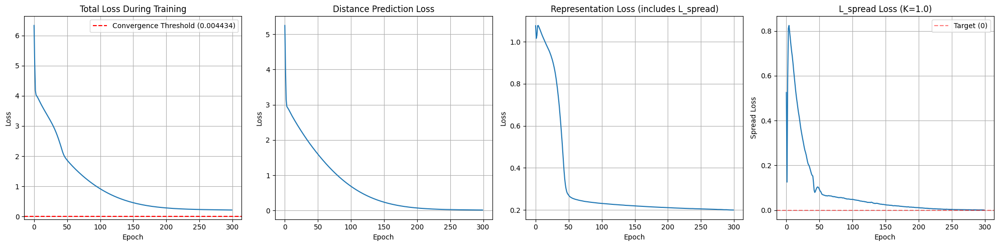

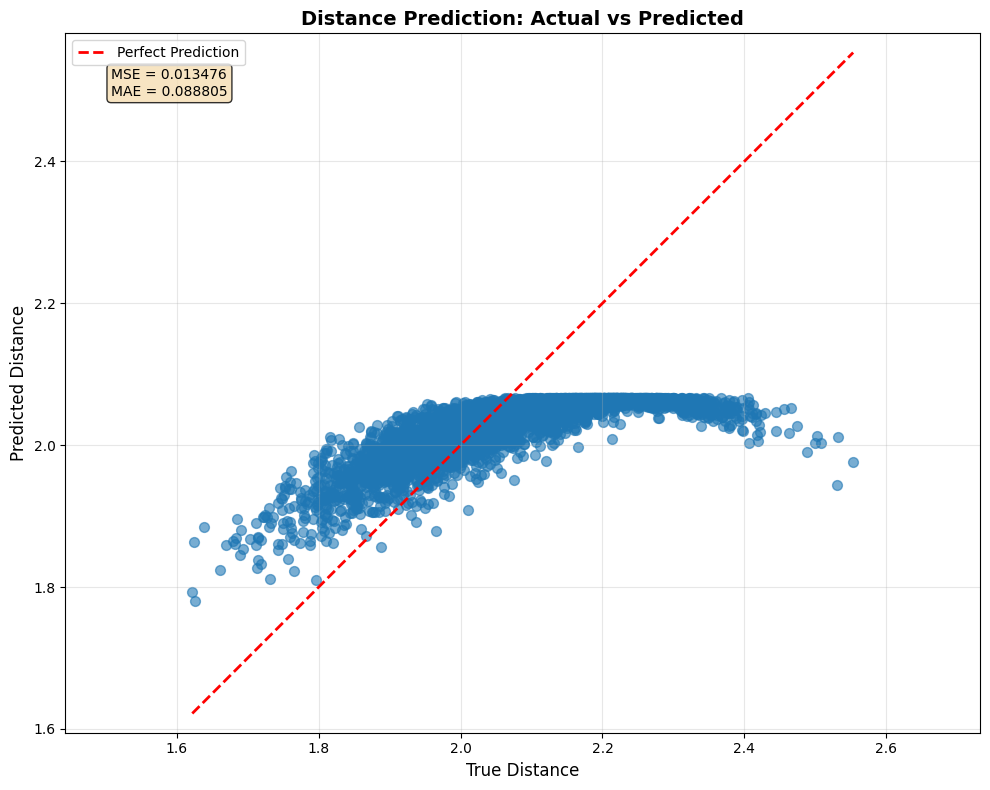

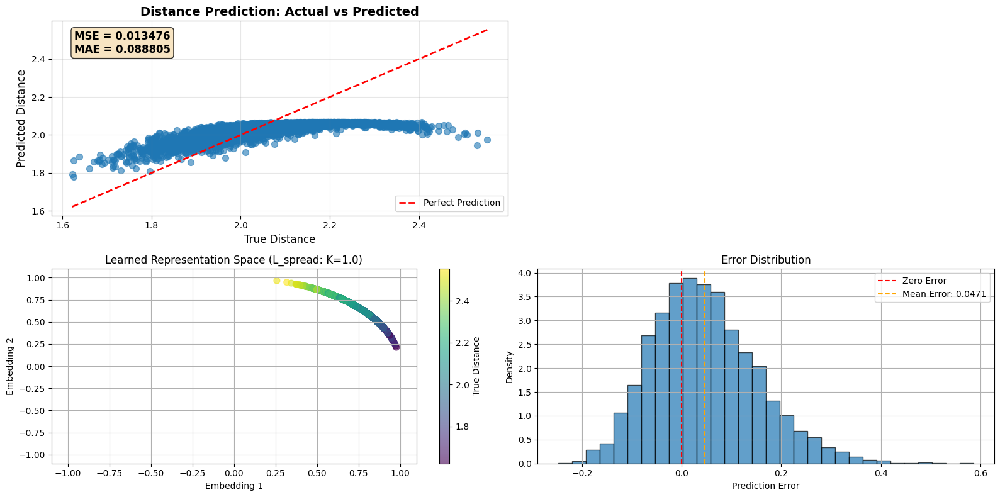

Global min: idx=403, value=1.658202
Global max: idx=375, value=2.448713
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step

Test Set Performance:
Test Pairwise Correlation: 0.0648
Test Distance Prediction MAE: 0.088376


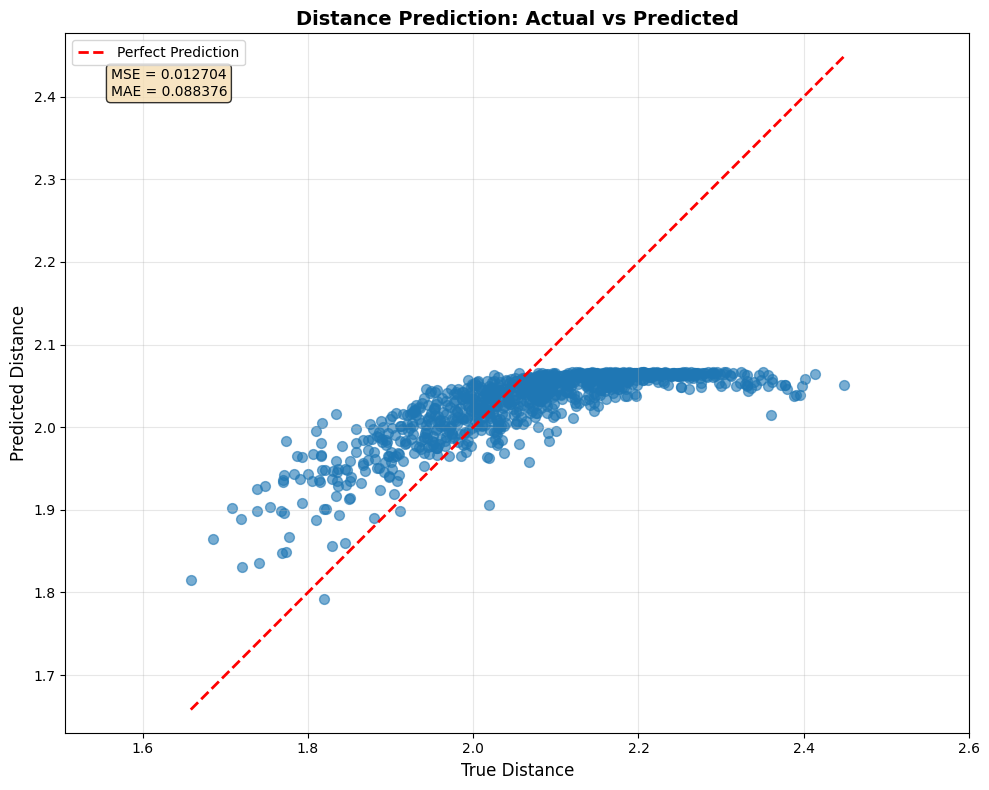

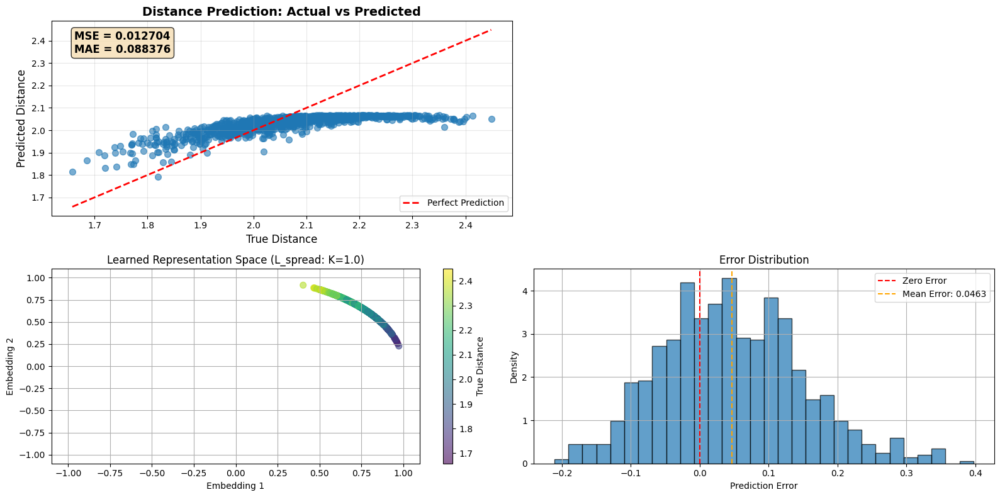

In [18]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.0 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=2064, value=1.563923
Global max: idx=3645, value=2.539736
Epoch 0: Embedding distance = 0.480239, Spread loss = 0.102247, Target K = 0.8
Epoch 1: Embedding distance = 0.207163, Spread loss = 0.351456, Target K = 0.8
Epoch 2: Embedding distance = 0.133104, Spread loss = 0.444751, Target K = 0.8
Epoch 3: Embedding distance = 0.125845, Spread loss = 0.454485, Target K = 0.8
Epoch 4: Embedding distance = 0.118024, Spread loss = 0.465091, Target K = 0.8
Epoch 5: Embedding distance = 0.117177, Spread loss = 0.466248, Target K = 0.8
Epoch 6: Embedding distance = 0.121000, Spread loss = 0.461041, Target K = 0.8
Epoch 7: Embedding distance = 0.128809, Spread loss = 0.450498, Target K = 0.8
Epoch 8: Embedding distance = 0.127790, Spread loss = 0.451866, Target K = 0.8
Epoch 9: Embedding distance = 0.125499, Spread loss = 0.454952, Target K = 0.8
Epoch 50: Embedding distance = 0.395324, Spread loss = 0.163762, Target K = 0.8
Epoch 100: Embedding distance = 0.701176, Spread loss = 

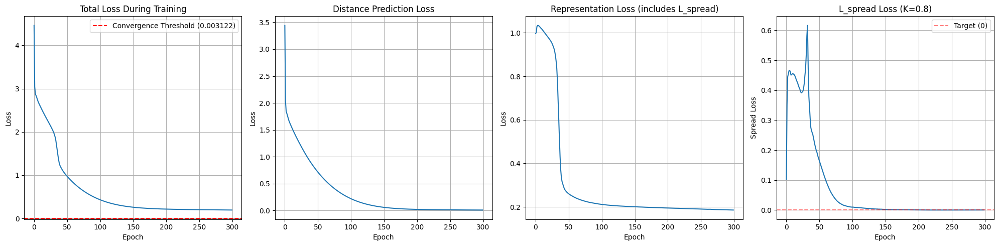

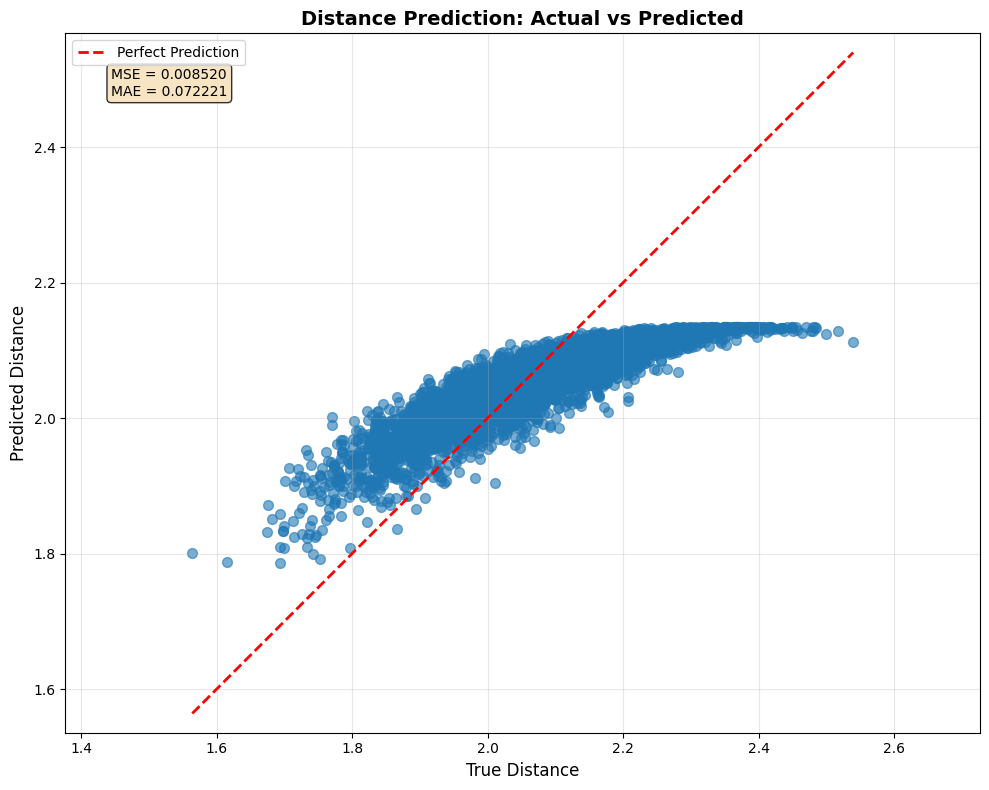

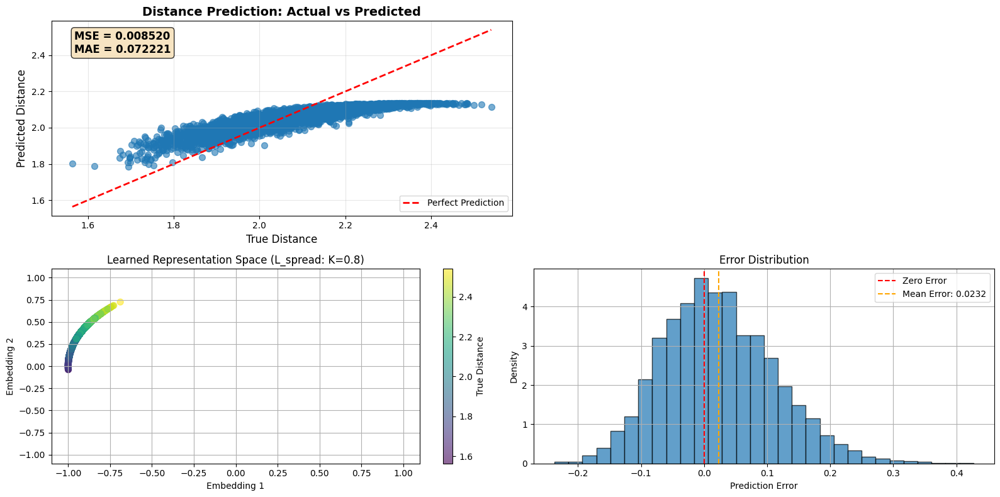

Global min: idx=403, value=1.660526
Global max: idx=487, value=2.446406
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step

Test Set Performance:
Test Pairwise Correlation: 0.0590
Test Distance Prediction MAE: 0.069302


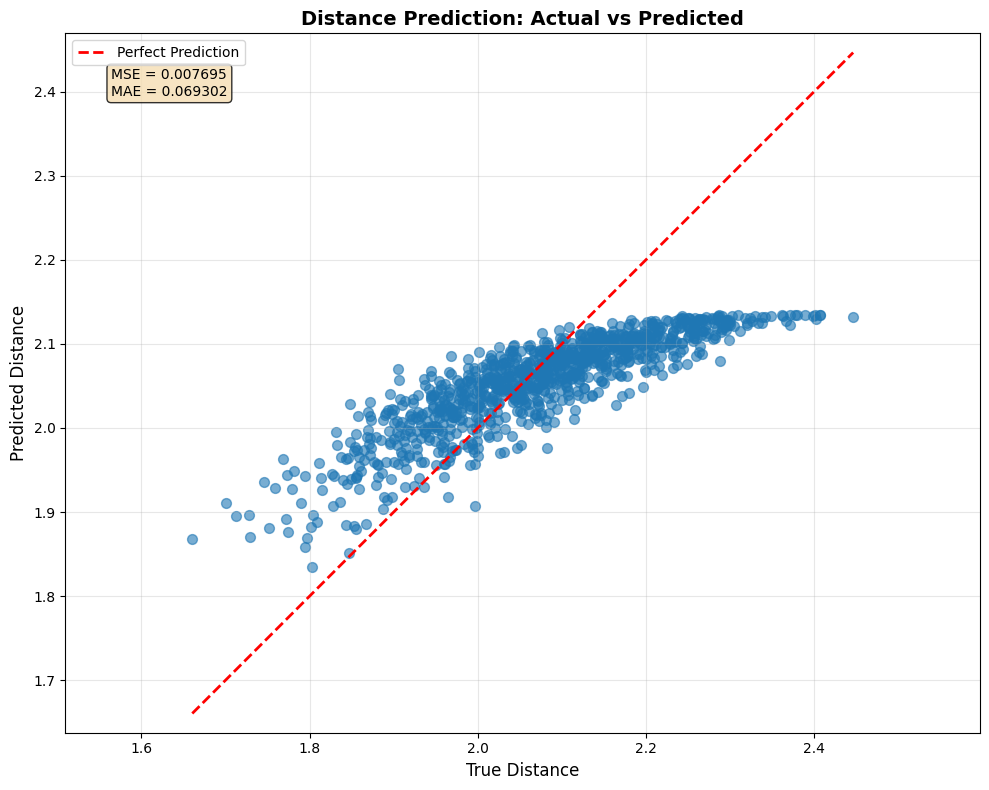

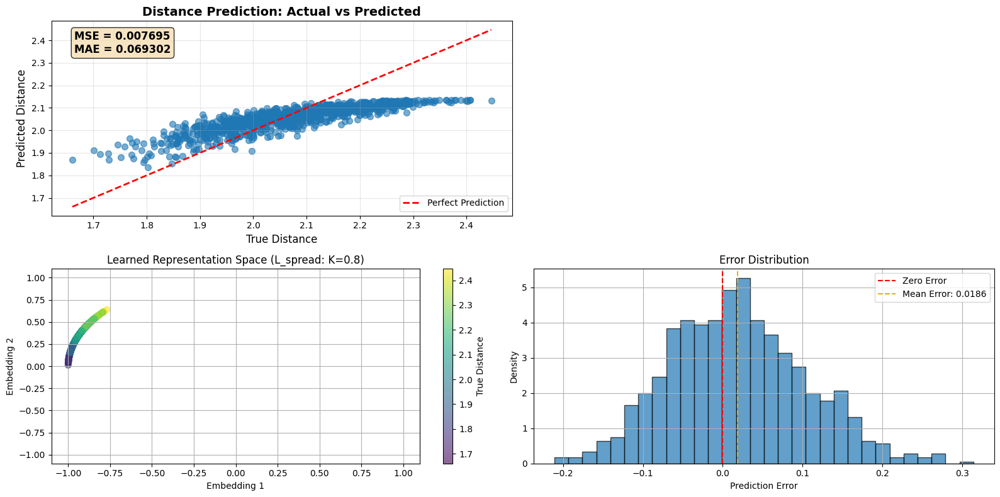

In [19]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=0.8 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=459, value=1.585667
Global max: idx=4358, value=2.474537
Epoch 0: Embedding distance = 0.023236, Spread loss = 0.227304, Target K = 0.5
Epoch 1: Embedding distance = 0.052105, Spread loss = 0.200610, Target K = 0.5
Epoch 2: Embedding distance = 0.067201, Spread loss = 0.187315, Target K = 0.5
Epoch 3: Embedding distance = 0.093408, Spread loss = 0.165317, Target K = 0.5
Epoch 4: Embedding distance = 0.123573, Spread loss = 0.141697, Target K = 0.5
Epoch 5: Embedding distance = 0.153489, Spread loss = 0.120070, Target K = 0.5
Epoch 6: Embedding distance = 0.182119, Spread loss = 0.101049, Target K = 0.5
Epoch 7: Embedding distance = 0.207713, Spread loss = 0.085432, Target K = 0.5
Epoch 8: Embedding distance = 0.228490, Spread loss = 0.073718, Target K = 0.5
Epoch 9: Embedding distance = 0.242131, Spread loss = 0.066496, Target K = 0.5
Epoch 50: Embedding distance = 0.307977, Spread loss = 0.036873, Target K = 0.5
Epoch 100: Embedding distance = 0.448294, Spread loss = 0

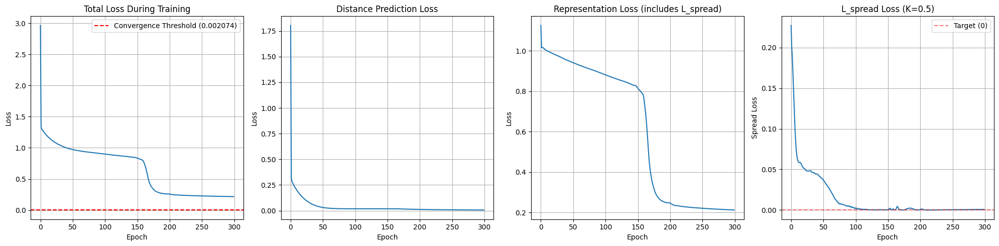

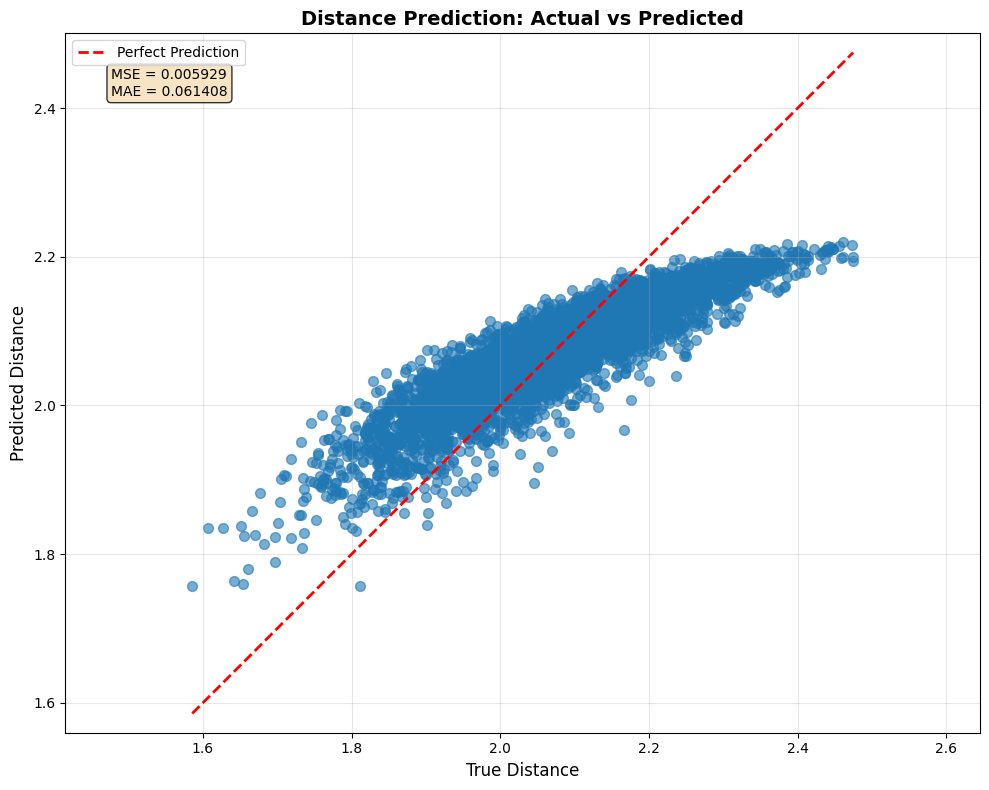

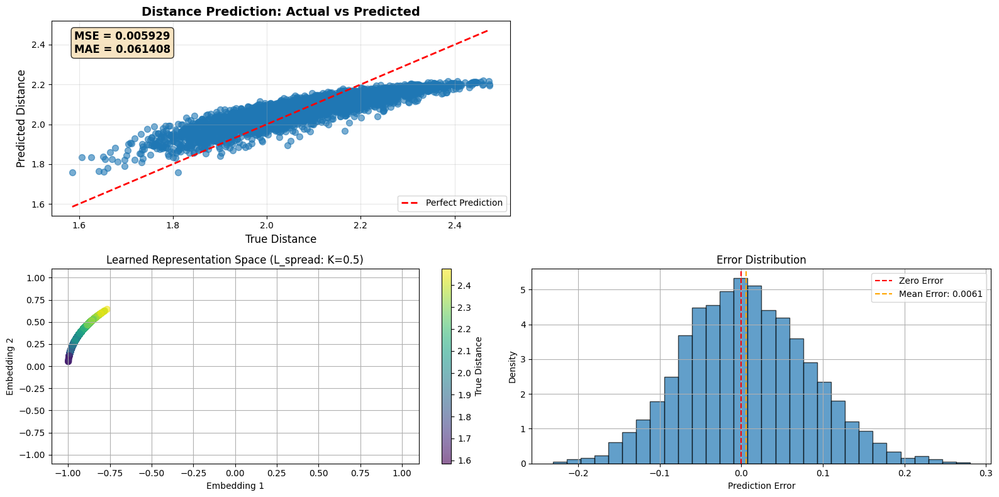

Global min: idx=552, value=1.593074
Global max: idx=758, value=2.543113
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step

Test Set Performance:
Test Pairwise Correlation: 0.0859
Test Distance Prediction MAE: 0.063180


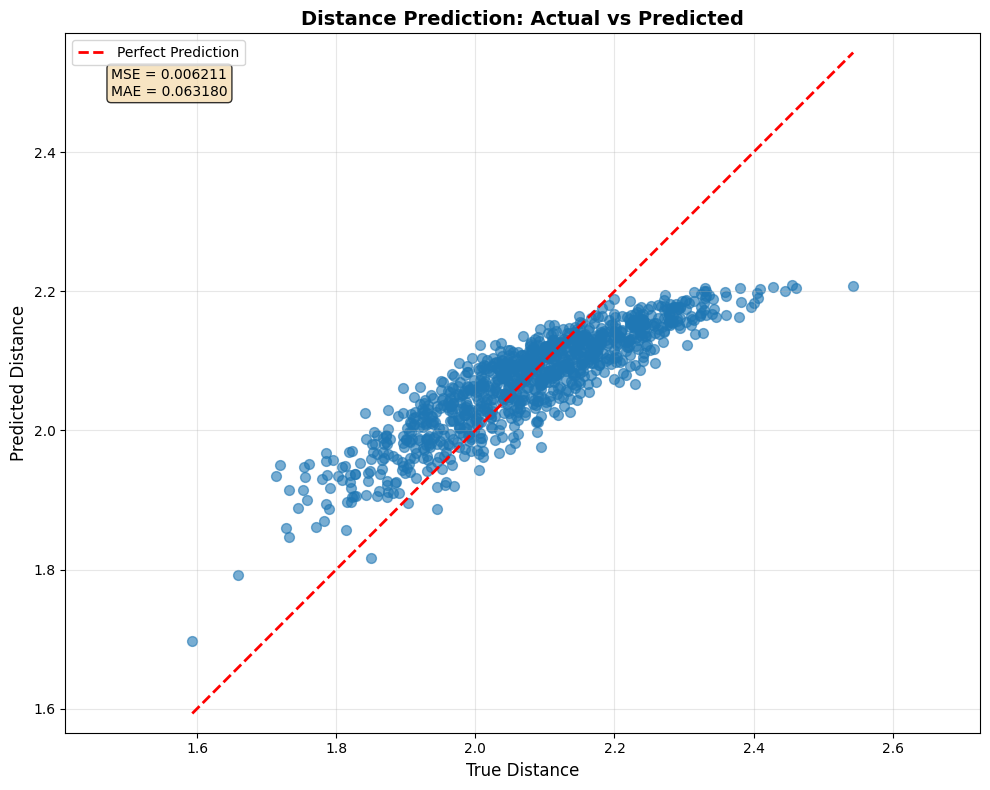

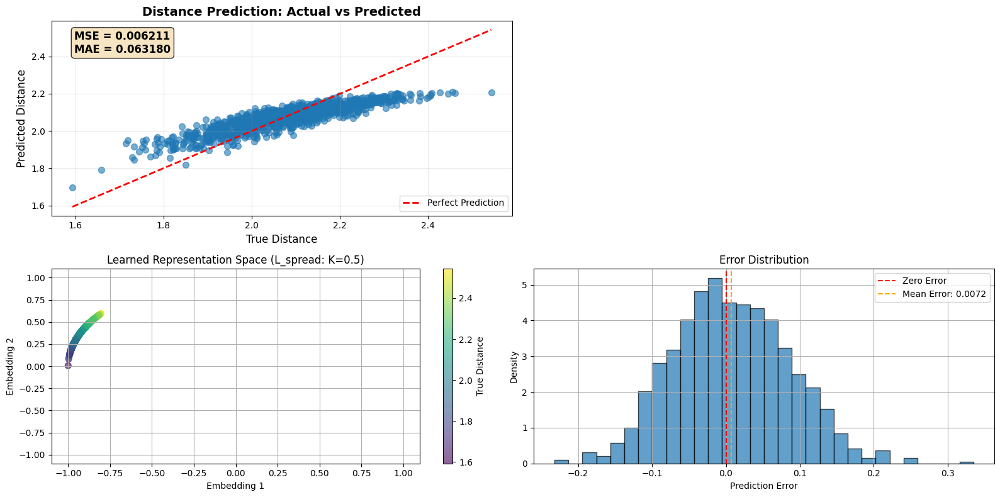

In [20]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=0.5 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=164, value=1.610546
Global max: idx=3077, value=2.505247
Epoch 0: Embedding distance = 0.071814, Spread loss = 0.031750, Target K = 0.25
Epoch 1: Embedding distance = 0.235787, Spread loss = 0.000202, Target K = 0.25
Epoch 2: Embedding distance = 0.221626, Spread loss = 0.000805, Target K = 0.25
Epoch 3: Embedding distance = 0.182670, Spread loss = 0.004533, Target K = 0.25
Epoch 4: Embedding distance = 0.118874, Spread loss = 0.017194, Target K = 0.25
Epoch 5: Embedding distance = 0.063901, Spread loss = 0.034633, Target K = 0.25
Epoch 6: Embedding distance = 0.011676, Spread loss = 0.056798, Target K = 0.25
Epoch 7: Embedding distance = 0.033805, Spread loss = 0.046740, Target K = 0.25
Epoch 8: Embedding distance = 0.082284, Spread loss = 0.028129, Target K = 0.25
Epoch 9: Embedding distance = 0.112575, Spread loss = 0.018886, Target K = 0.25
Epoch 50: Embedding distance = 0.150544, Spread loss = 0.009891, Target K = 0.25
Epoch 100: Embedding distance = 0.306193, Spre

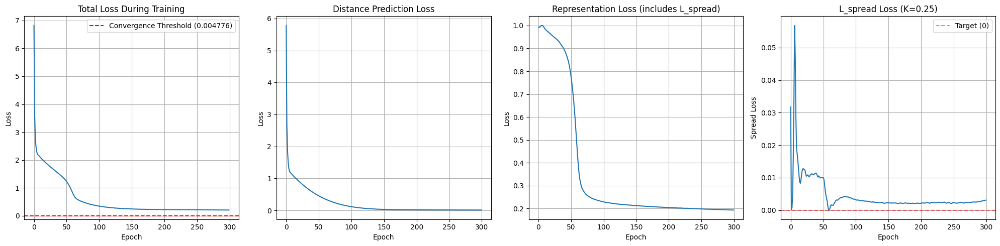

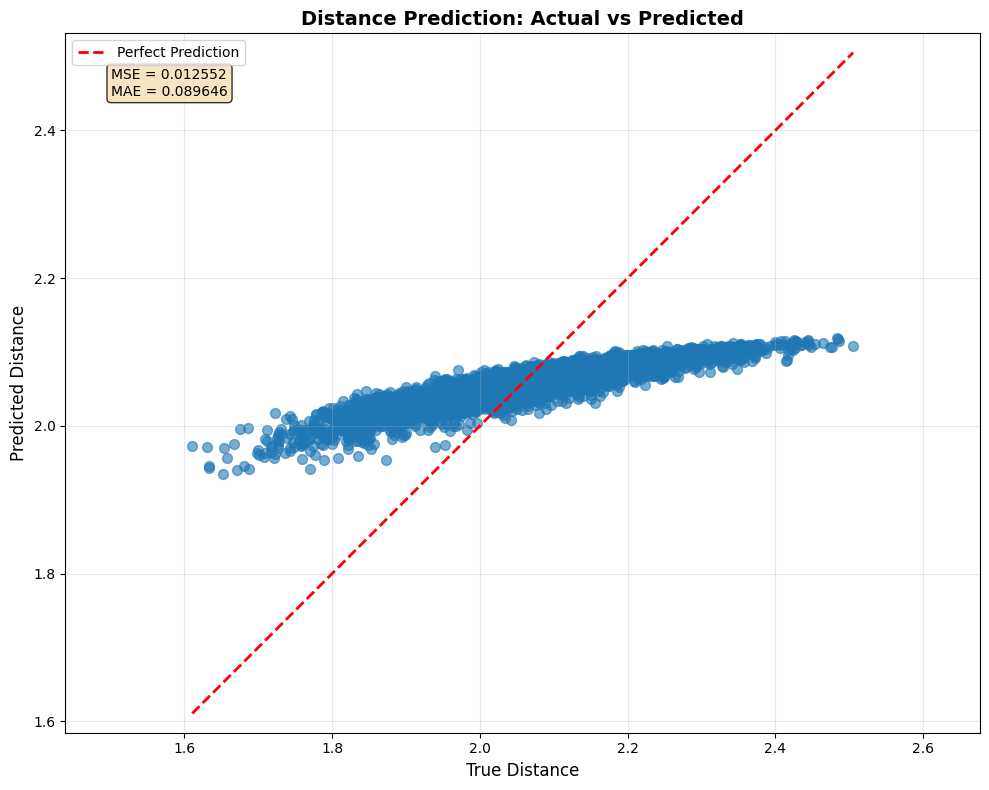

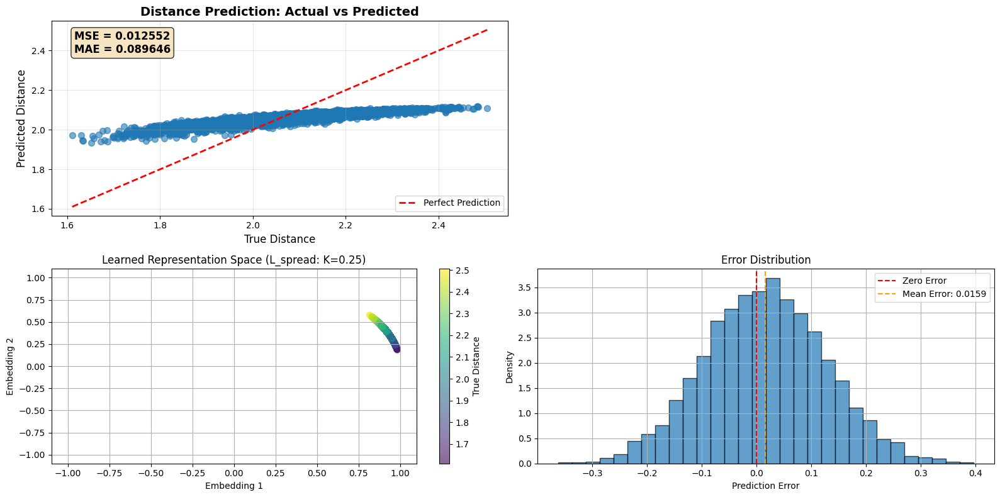

Global min: idx=104, value=1.606667
Global max: idx=755, value=2.445774
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step

Test Set Performance:
Test Pairwise Correlation: 0.0812
Test Distance Prediction MAE: 0.091063


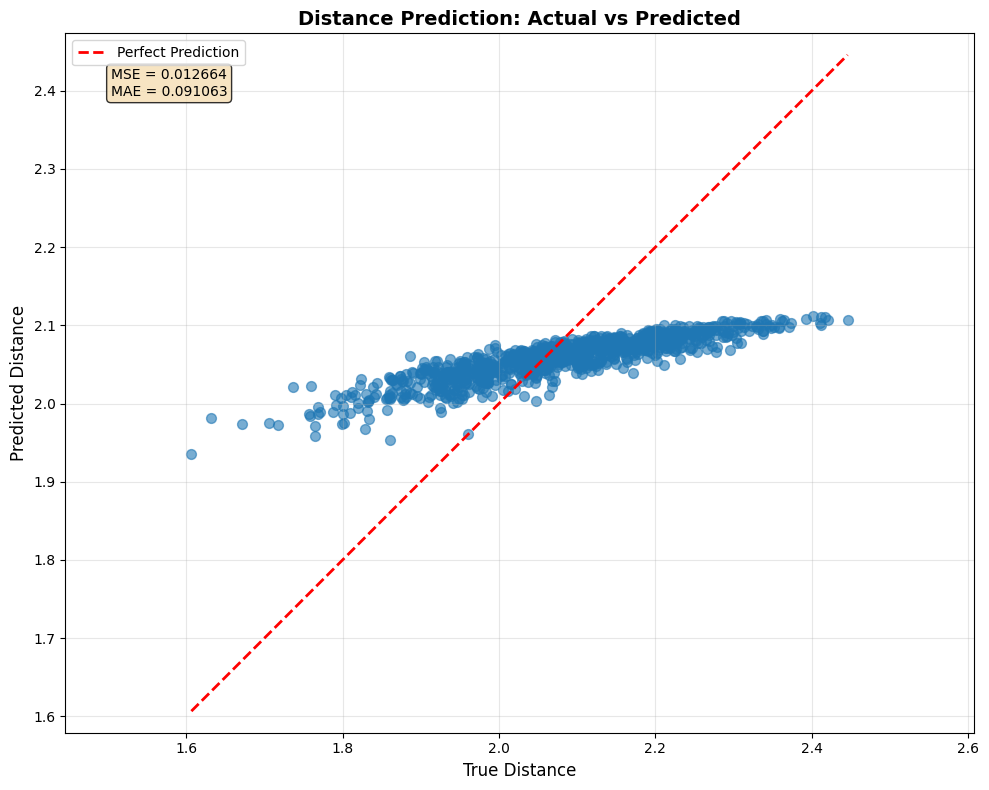

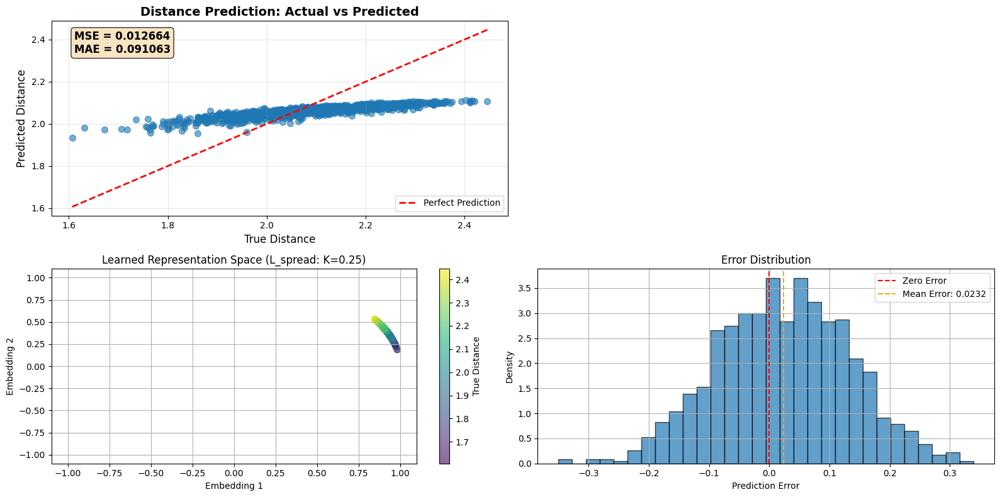

In [21]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=0.25 # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

In [11]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.8  # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.01,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

ValueError: Fewer non-zero entries in p than size

Global min: idx=2764, value=1.598136
Global max: idx=4553, value=2.548203
Epoch 0: Embedding distance = 0.394356, Spread loss = 1.975835, Target K = 1.8
Epoch 1: Embedding distance = 0.500241, Spread loss = 1.689373, Target K = 1.8
Epoch 2: Embedding distance = 0.524832, Spread loss = 1.626053, Target K = 1.8
Epoch 3: Embedding distance = 0.537643, Spread loss = 1.593545, Target K = 1.8
Epoch 4: Embedding distance = 0.601189, Spread loss = 1.437148, Target K = 1.8
Epoch 5: Embedding distance = 0.671347, Spread loss = 1.273857, Target K = 1.8
Epoch 6: Embedding distance = 0.755201, Spread loss = 1.091605, Target K = 1.8
Epoch 7: Embedding distance = 0.893639, Spread loss = 0.821489, Target K = 1.8
Epoch 8: Embedding distance = 0.950180, Spread loss = 0.722194, Target K = 1.8
Epoch 9: Embedding distance = 0.991199, Spread loss = 0.654159, Target K = 1.8
Epoch 50: Embedding distance = 1.430209, Spread loss = 0.136745, Target K = 1.8
Epoch 100: Embedding distance = 1.610564, Spread loss = 

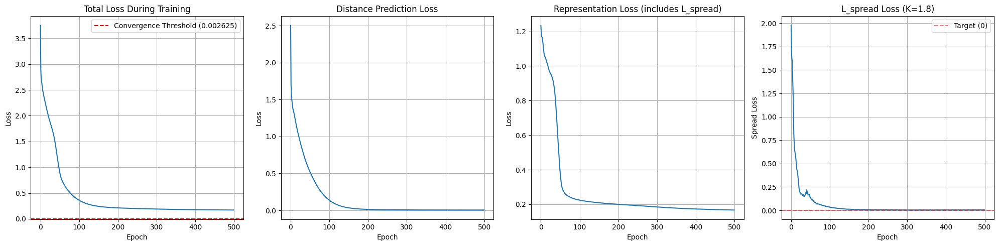

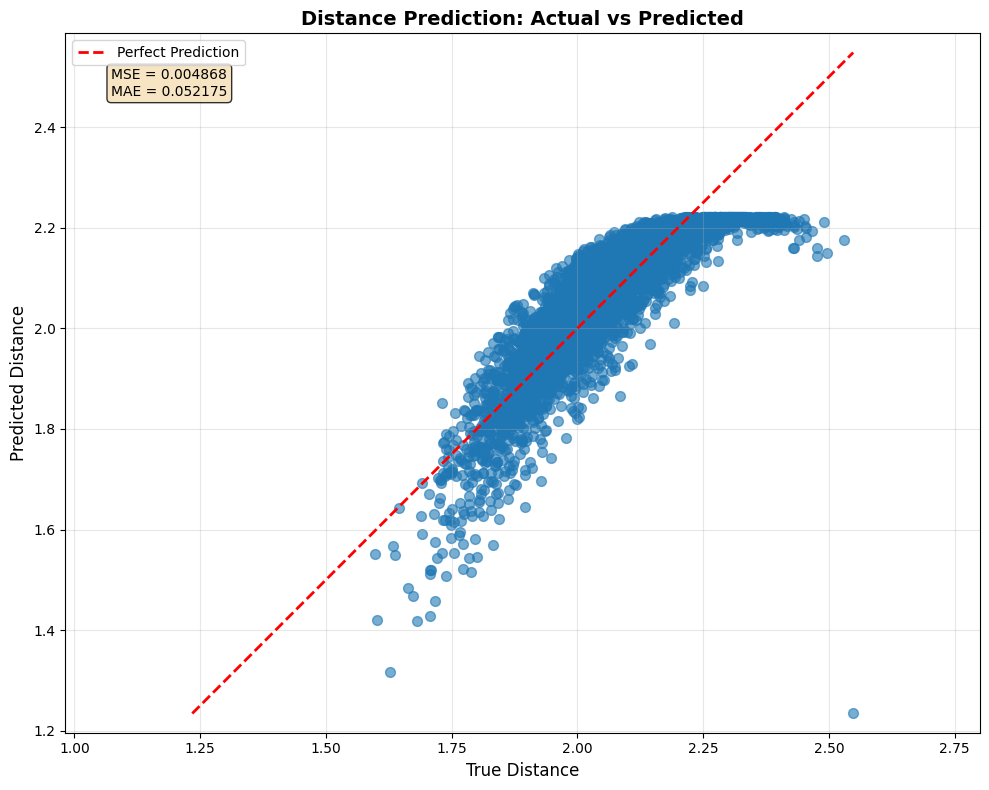

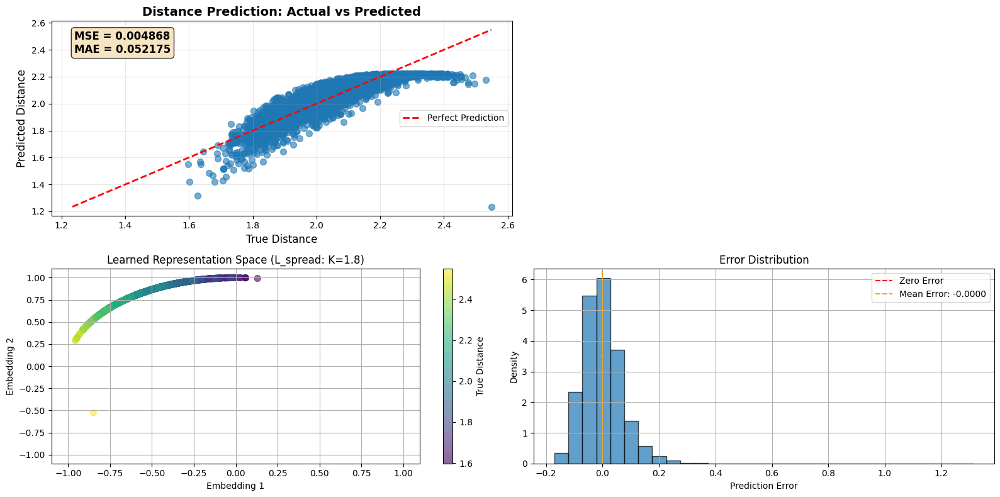

Global min: idx=910, value=1.651498
Global max: idx=834, value=2.435412
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step

Test Set Performance:
Test Pairwise Correlation: 0.0729
Test Distance Prediction MAE: 0.056639


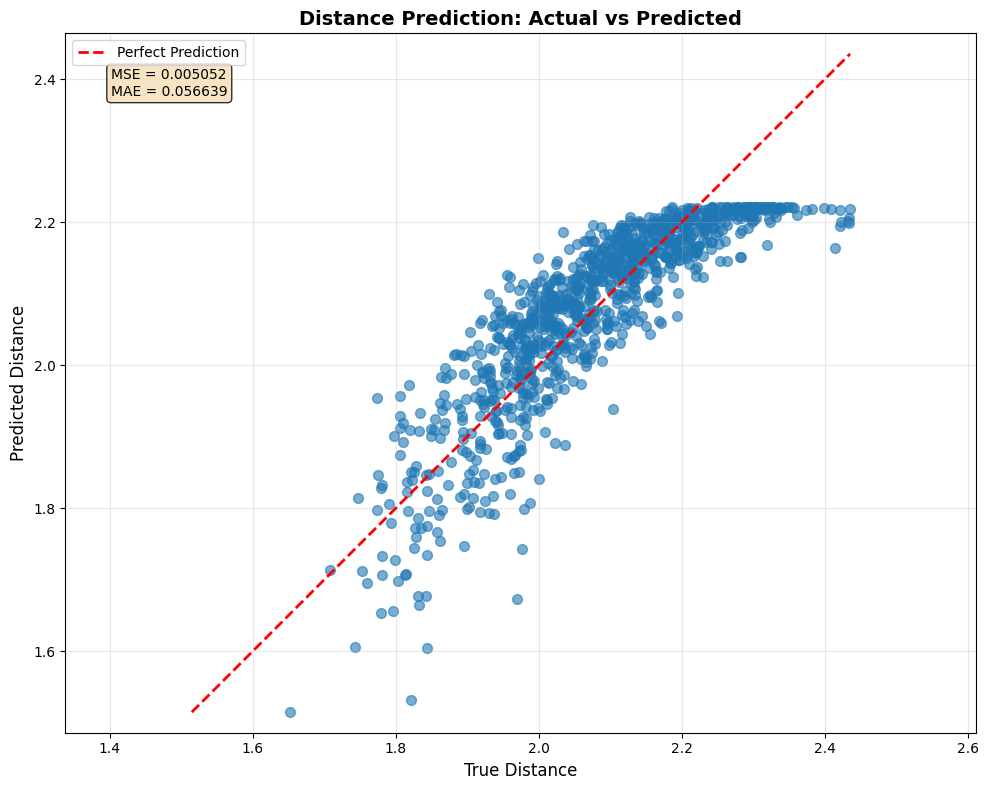

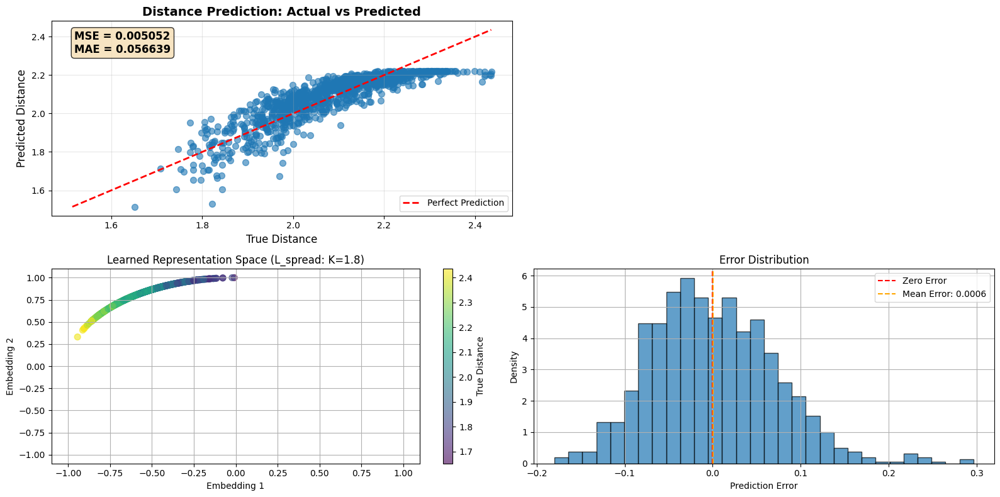

In [34]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.8  # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=500, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=2774, value=1.629238
Global max: idx=4134, value=2.533221
Epoch 0: Embedding distance = 1.854416, Spread loss = 0.206494, Target K = 1.4
Epoch 1: Embedding distance = 1.098437, Spread loss = 0.090940, Target K = 1.4
Epoch 2: Embedding distance = 0.638067, Spread loss = 0.580541, Target K = 1.4
Epoch 3: Embedding distance = 0.511718, Spread loss = 0.789045, Target K = 1.4
Epoch 4: Embedding distance = 0.507235, Spread loss = 0.797030, Target K = 1.4
Epoch 5: Embedding distance = 0.566370, Spread loss = 0.694939, Target K = 1.4
Epoch 6: Embedding distance = 0.648896, Spread loss = 0.564158, Target K = 1.4
Epoch 7: Embedding distance = 0.721843, Spread loss = 0.459897, Target K = 1.4
Epoch 8: Embedding distance = 0.776213, Spread loss = 0.389110, Target K = 1.4
Epoch 9: Embedding distance = 0.814125, Spread loss = 0.343249, Target K = 1.4
Epoch 50: Embedding distance = 0.949881, Spread loss = 0.202607, Target K = 1.4
Epoch 100: Embedding distance = 1.267556, Spread loss = 

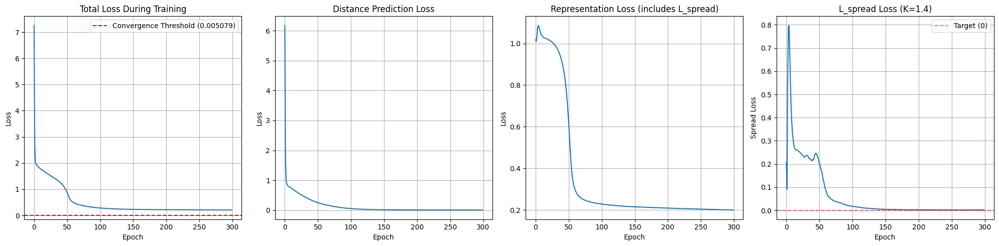

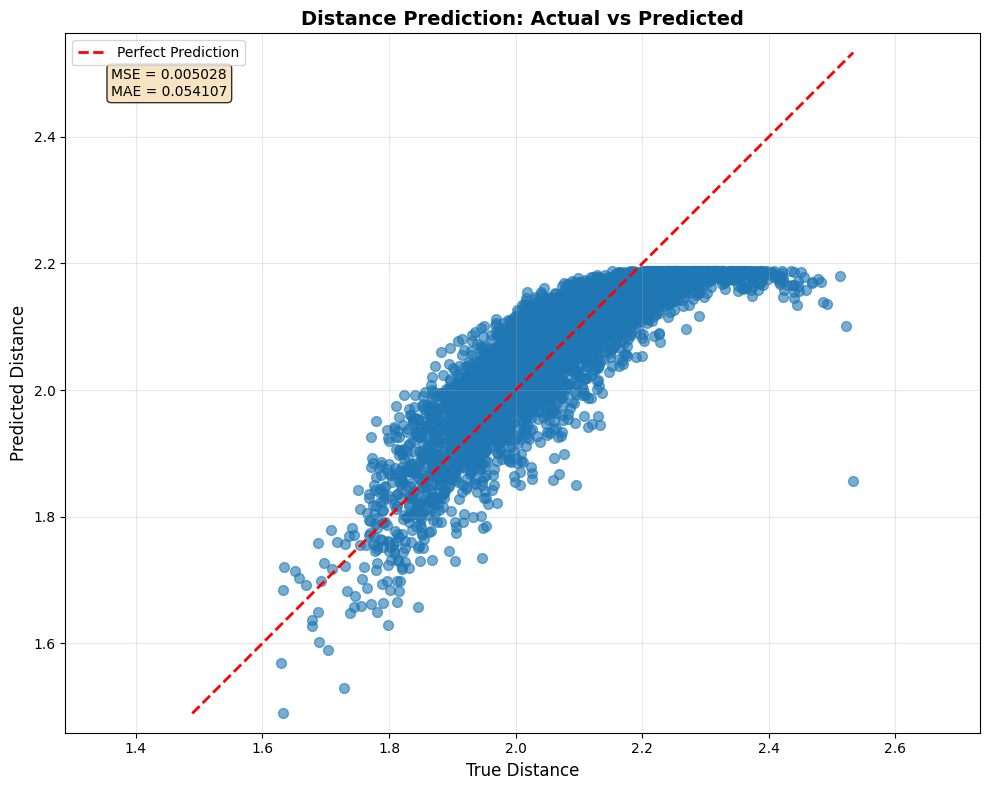

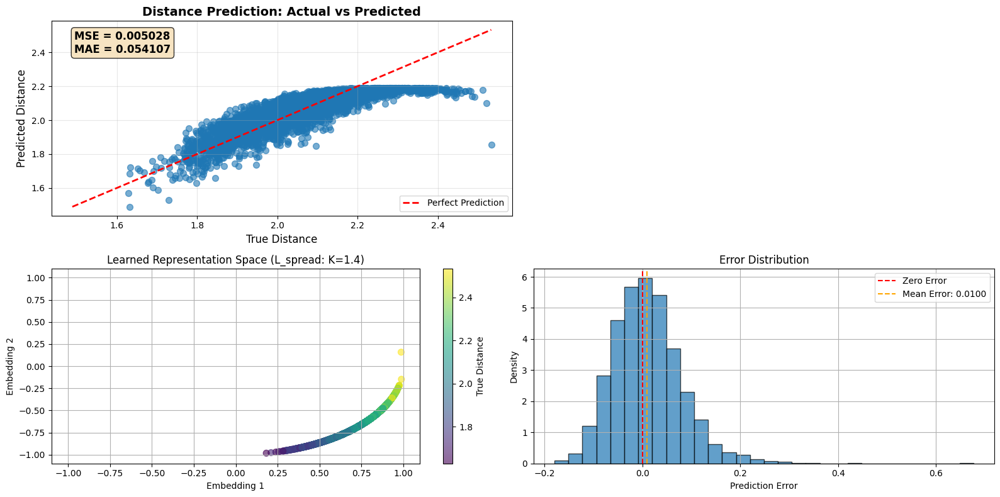

Global min: idx=310, value=1.462971
Global max: idx=191, value=2.558637
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step

Test Set Performance:
Test Pairwise Correlation: 0.0779
Test Distance Prediction MAE: 0.056657


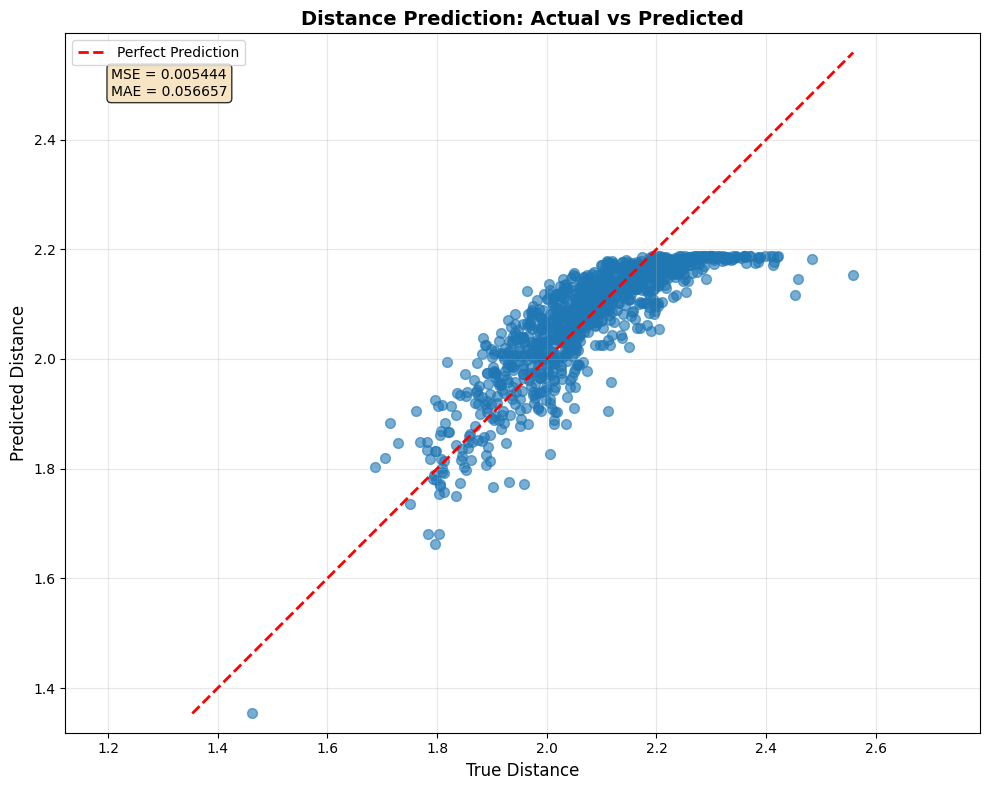

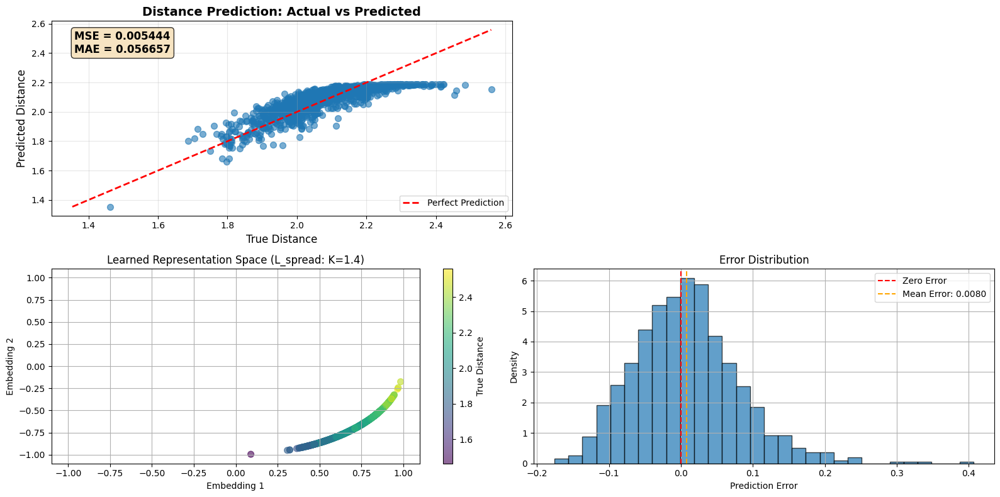

In [35]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=True,  # Enable L_spread
    K=1.4  # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

Global min: idx=614, value=1.591000
Global max: idx=4629, value=2.562070
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step

Training Metrics:
Initial Total Loss: 6.098617
Final Total Loss: 0.223228
Initial Distance Loss: 5.103283
Final Distance Loss: 0.016967
Initial Representation Loss: 0.981711
Final Representation Loss: 0.205726

Training Summary:
Convergence Threshold: 0.004269
Model did not converge to threshold
Total Training Time: 16.11 seconds
Average Time per Batch: 9.35 ms

Distance Prediction Metrics:
MSE: 0.016923
MAE: 0.104623

Representation Quality:
Pairwise Correlation: 0.0717
Noise Level Used: 0.15
Final Pairwise Correlation: 0.0717
Distance Prediction MAE: 0.104623


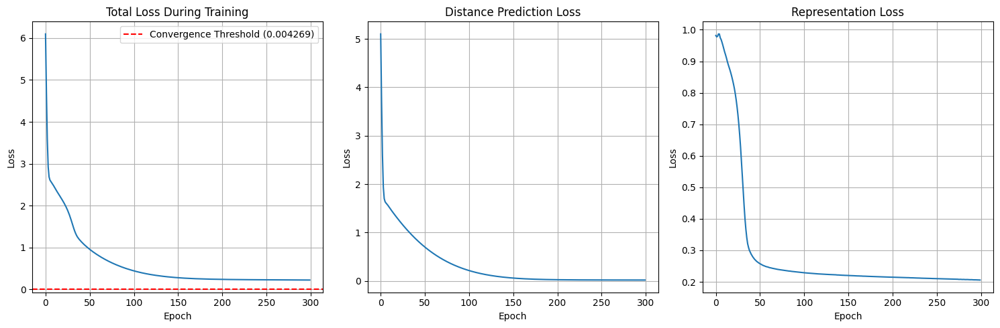

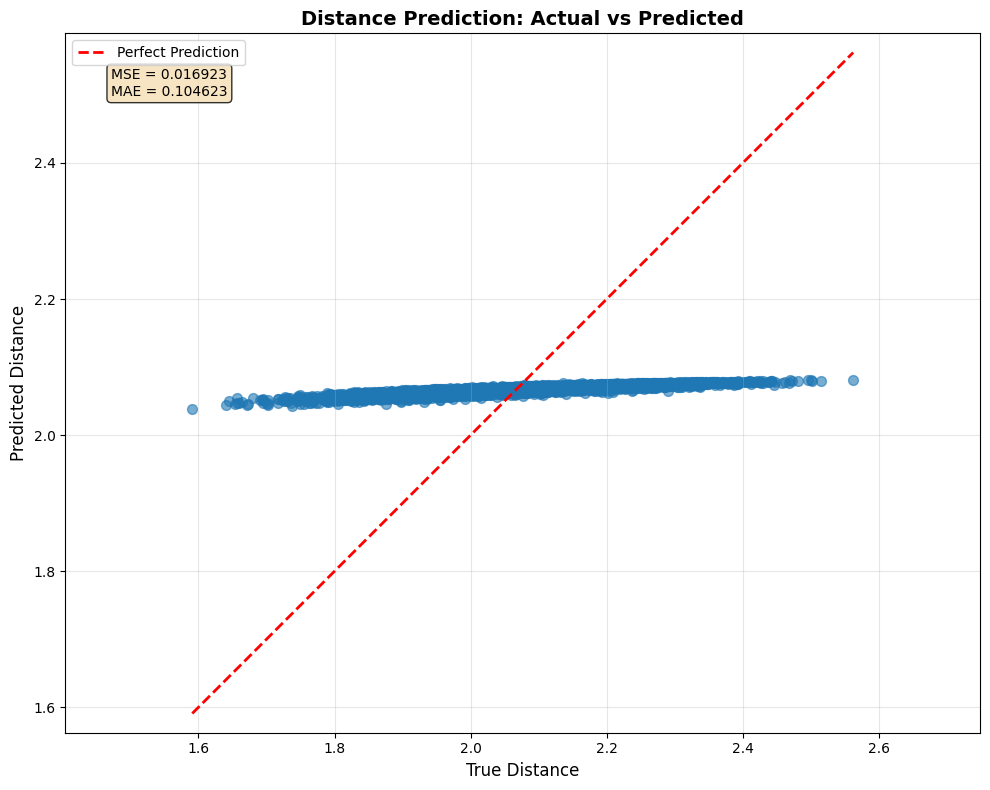

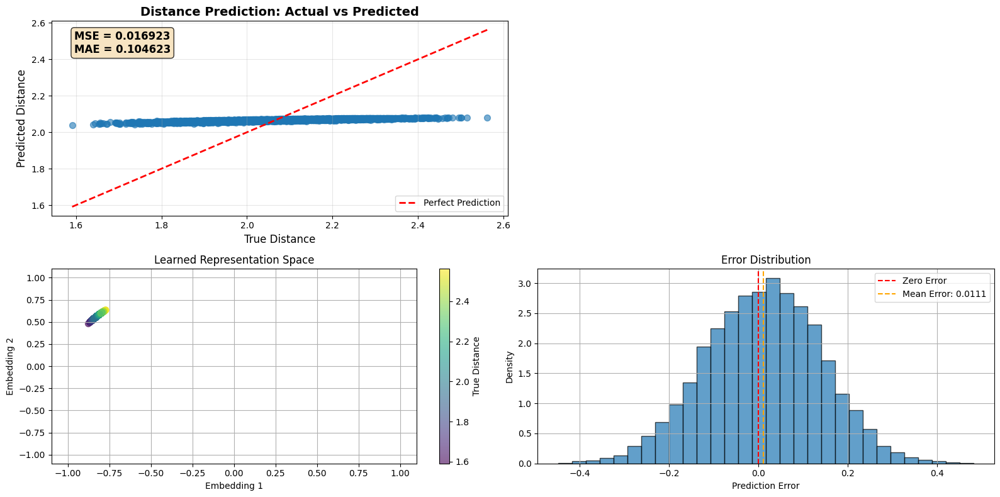

Global min: idx=960, value=1.607926
Global max: idx=743, value=2.435437
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step

Test Set Performance:
Test Pairwise Correlation: 0.0601
Test Distance Prediction MAE: 0.108579


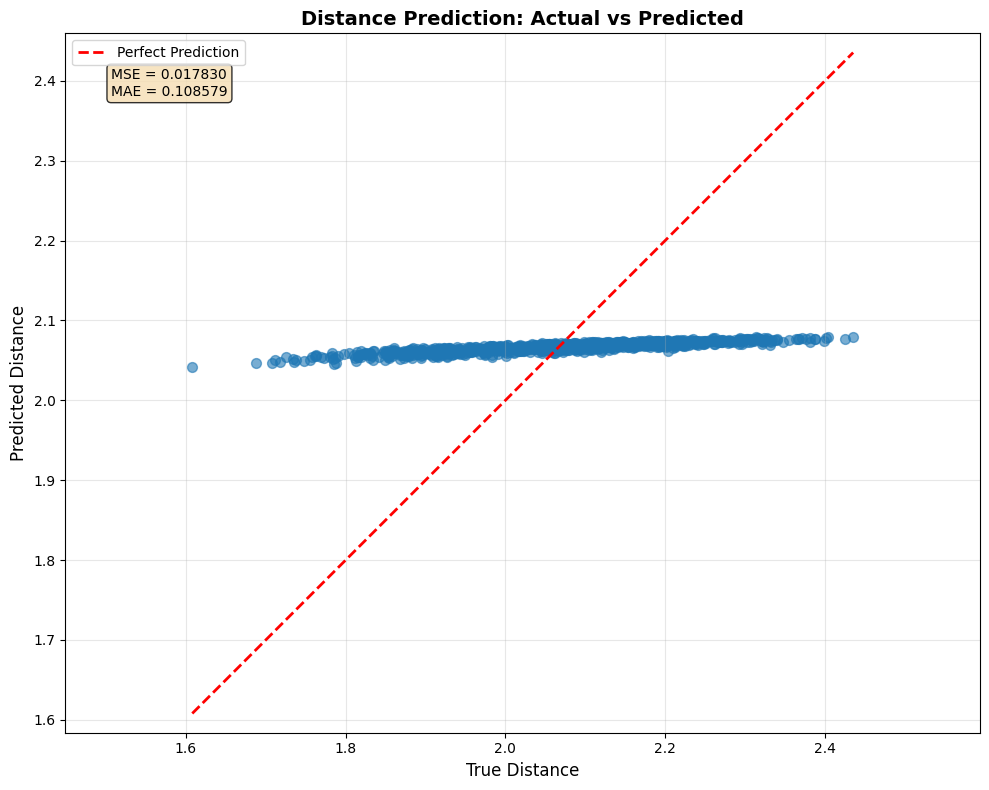

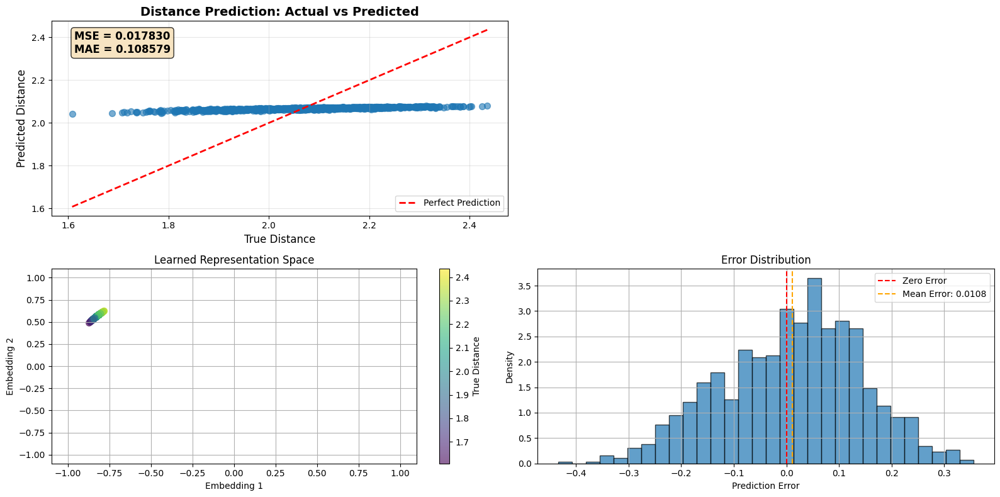

In [33]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

# Create trainer with L_spread enabled
trainer = TrainerV4_2(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=True,
    use_Lspread=False,  # Enable L_spread
    K=1.8  # Target distance between min/max embeddings
)

# Train with L_spread (computed at every iteration)
history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance = trainer.train(
    representation_loss_fn=custom_loss_wrapper,
    distance_loss_weight=1.0,
    representation_loss_weight=1.0,
    spread_loss_weight=0.1,  # Weight for L_spread term
    num_points=5000, 
    noise_level=0.15, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=0.15)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

In [6]:
import tensorflow as tf
import numpy as np

def lcf_loss_vec(y_true, y_pred):
    """
    Vectorized Less Correlated Features loss - squared PCC between all pairs of feature dimensions.
    
    Args:
        y_pred: shape (batch_size, embed_dim)
        y_true: not used, kept for compatibility with Keras loss interface
        
    Returns:
        Mean squared Pearson correlation between all pairs of feature dimensions
        
    Complexity: O(embed_dim^2) - no upper triangle extraction for speed
    """
    # Transpose to work with feature dimensions as rows
    features = tf.transpose(y_pred)  # Shape: (embed_dim, batch_size)
    embed_dim = tf.shape(features)[0]
    batch_size = tf.cast(tf.shape(features)[1], tf.float32)
    
    # Center the features
    means = tf.reduce_mean(features, axis=1, keepdims=True)  # Shape: (embed_dim, 1)
    centered = features - means  # Shape: (embed_dim, batch_size)
    
    # Compute covariance matrix: cov[i,j] = mean((f_i - mean_i) * (f_j - mean_j))
    cov_matrix = tf.matmul(centered, centered, transpose_b=True) / batch_size
    
    # Compute standard deviations and correlation matrix
    variances = tf.reduce_mean(tf.square(centered), axis=1)  # Shape: (embed_dim,)
    std_devs = tf.sqrt(variances + 1e-8)
    
    # Compute outer product using broadcasting instead of tf.outer
    std_outer = tf.expand_dims(std_devs, 1) * tf.expand_dims(std_devs, 0)  # Shape: (embed_dim, embed_dim)
    corr_matrix = cov_matrix / (std_outer + 1e-8)
    
    # Square correlations and exclude diagonal (self-correlations = 1)
    corr_squared = tf.square(corr_matrix) * (1.0 - tf.eye(embed_dim))
    
    # Mean over all off-diagonal pairs (counts each pair twice due to symmetry)
    return tf.reduce_sum(corr_squared) / tf.cast(embed_dim * (embed_dim - 1), tf.float32)


# Test function to verify correctness
def test_lcf_loss():
    """Test the vectorized LCF loss against a simple 2D case"""
    
    # Create test data: batch_size=4, embed_dim=3
    np.random.seed(42)
    test_data = tf.constant([
        [1.0, 2.0, 3.0],  # instance 1: (1, 2)
        [1.5, 2.2, 3.1],  # instance 2: (1.5, 2.2) 
        [0.8, 1.9, 2.8],  # instance 3: (0.8, 1.9)
        [1.2, 2.1, 3.2],  # instance 4: (1.2, 2.1)
    ], dtype=tf.float32)
    
    # Compute LCF loss
    loss = lcf_loss_vec(None, test_data)
    
    print("Test Data:")
    print("Instance 1: [1.0, 2.0, 3.0]")
    print("Instance 2: [1.5, 2.2, 3.1]") 
    print("Instance 3: [0.8, 1.9, 2.8]")
    print("Instance 4: [1.2, 2.1, 3.2]")
    print()
    
    print("Feature vectors across instances:")
    print("f1 (dim 1): [1.0, 1.5, 0.8, 1.2]")
    print("f2 (dim 2): [2.0, 2.2, 1.9, 2.1]") 
    print("f3 (dim 3): [3.0, 3.1, 2.8, 3.2]")
    print()
    
    print(f"LCF Loss (vectorized): {loss:.6f}")
    
    # Manual verification for 2D case
    if test_data.shape[1] == 2:  # Only verify for 2D
        f1 = test_data[:, 0]
        f2 = test_data[:, 1]
        
        f1_mean = tf.reduce_mean(f1)
        f2_mean = tf.reduce_mean(f2)
        f1_centered = f1 - f1_mean
        f2_centered = f2 - f2_mean
        
        cov = tf.reduce_mean(f1_centered * f2_centered)
        std1 = tf.sqrt(tf.reduce_mean(tf.square(f1_centered)) + 1e-8)
        std2 = tf.sqrt(tf.reduce_mean(tf.square(f2_centered)) + 1e-8)
        pcc = cov / (std1 * std2 + 1e-8)
        manual_loss = tf.square(pcc)
        
        print(f"Manual 2D calculation: {manual_loss:.6f}")
        print(f"Difference: {abs(loss - manual_loss):.8f}")
    
    return loss

def test_lcf_loss_loop():
    """Test the vectorized LCF loss against a for-loop implementation for arbitrary feature size"""
    np.random.seed(123)
    batch_size = 8
    embed_dim = 5
    data = np.random.randn(batch_size, embed_dim).astype(np.float32)
    tf_data = tf.constant(data)

    # Vectorized loss
    loss_vec = lcf_loss_vec(None, tf_data).numpy()

    # For-loop loss (manual, using numpy)
    means = np.mean(data, axis=0)
    centered = data - means
    stds = np.std(data, axis=0, ddof=0) + 1e-8
    total = 0.0
    count = 0
    for i in range(embed_dim):
        for j in range(embed_dim):
            if i != j:
                cov = np.mean(centered[:, i] * centered[:, j])
                pcc = cov / (stds[i] * stds[j] + 1e-8)
                total += pcc ** 2
                count += 1
    loss_loop = total / count if count > 0 else 0.0

    print("\nFor-loop test (arbitrary feature size):")
    print(f"Vectorized LCF loss: {loss_vec:.8f}")
    print(f"For-loop LCF loss:  {loss_loop:.8f}")
    print(f"Difference:         {abs(loss_vec - loss_loop):.10f}")

    assert np.allclose(loss_vec, loss_loop, atol=1e-6), "Vectorized and loop LCF loss do not match!"

if __name__ == "__main__":
    test_lcf_loss()
    test_lcf_loss_loop()

Test Data:
Instance 1: [1.0, 2.0, 3.0]
Instance 2: [1.5, 2.2, 3.1]
Instance 3: [0.8, 1.9, 2.8]
Instance 4: [1.2, 2.1, 3.2]

Feature vectors across instances:
f1 (dim 1): [1.0, 1.5, 0.8, 1.2]
f2 (dim 2): [2.0, 2.2, 1.9, 2.1]
f3 (dim 3): [3.0, 3.1, 2.8, 3.2]

LCF Loss (vectorized): 0.756687

For-loop test (arbitrary feature size):
Vectorized LCF loss: 0.14021841
For-loop LCF loss:  0.14021841
Difference:         0.0000000000


In [9]:
import tensorflow as tf
import numpy as np
import time
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from tensorflow.keras.layers import Dense, LeakyReLU, Input, Lambda
from tensorflow.keras.models import Model

def lcf_loss_vec(y_true, y_pred):
    """
    Vectorized Less Correlated Features loss - squared PCC between all pairs of feature dimensions.
    """
    # Transpose to work with feature dimensions as rows
    features = tf.transpose(y_pred)  # Shape: (embed_dim, batch_size)
    embed_dim = tf.shape(features)[0]
    batch_size = tf.cast(tf.shape(features)[1], tf.float32)
    
    # Center the features
    means = tf.reduce_mean(features, axis=1, keepdims=True)  # Shape: (embed_dim, 1)
    centered = features - means  # Shape: (embed_dim, batch_size)
    
    # Compute covariance matrix: cov[i,j] = mean((f_i - mean_i) * (f_j - mean_j))
    cov_matrix = tf.matmul(centered, centered, transpose_b=True) / batch_size
    
    # Compute standard deviations and correlation matrix
    variances = tf.reduce_mean(tf.square(centered), axis=1)  # Shape: (embed_dim,)
    std_devs = tf.sqrt(variances + 1e-8)
    
    # Compute outer product using broadcasting instead of tf.outer
    std_outer = tf.expand_dims(std_devs, 1) * tf.expand_dims(std_devs, 0)  # Shape: (embed_dim, embed_dim)
    corr_matrix = cov_matrix / (std_outer + 1e-8)
    
    # Square correlations and exclude diagonal (self-correlations = 1)
    corr_squared = tf.square(corr_matrix) * (1.0 - tf.eye(embed_dim))
    
    # Mean over all off-diagonal pairs (counts each pair twice due to symmetry)
    return tf.reduce_sum(corr_squared) / tf.cast(embed_dim * (embed_dim - 1), tf.float32)


class TrainerV4_3:
    def __init__(self, input_dim=2, hidden_dims=None, output_dim=2, embed_dim=2, use_normalize_layer=True):
        if hidden_dims is None:
            hidden_dims = [64, 32]
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim
        self.embed_dim = embed_dim
        self.use_normalize_layer = use_normalize_layer
        self.phase_manager = TrainingPhaseManager()
        self.model = self.build_model()
        self.convergence_threshold = None

    def build_model(self):
        inputs = Input(shape=(self.input_dim,))
        x = inputs

        # Hidden layers with Leaky ReLU activation
        for dim in self.hidden_dims:
            x = Dense(dim)(x)
            x = LeakyReLU()(x)

        # Representation output (optionally normalized vector)
        representation_output = Dense(self.embed_dim, name='representation_raw')(x)
        if self.use_normalize_layer:
            representation_output = NormalizeLayer(name='normalize_layer')(representation_output)
            rep_output_name = 'normalize_layer'
        else:
            rep_output_name = 'representation_raw'
            
        # Distance prediction from representation
        distance_output = Dense(1, name='distance_prediction')(representation_output)
        
        # LCF auxiliary output (same as representation, but for LCF loss)
        lcf_output = Lambda(lambda x: x, name='lcf_auxiliary')(representation_output)
        
        model = Model(
            inputs=inputs, 
            outputs=[distance_output, representation_output, lcf_output]
        )
        self.rep_output_name = rep_output_name
        return model

    def generate_synthetic_data(self, num_points=200, noise_level=0.15):
        """Generate synthetic data with N-dimensional input and distance labels."""
        # Generate more points than needed for sampling
        pool_size = num_points * 10
        features = np.random.uniform(0, 1, (pool_size, self.input_dim))

        # Calculate distances from origin for N-dimensional space
        distances = np.sqrt(np.sum(features ** 2, axis=1))

        # Create weights favoring middle distances
        max_distance = np.sqrt(self.input_dim)
        gaussian_center = max_distance * 0.5
        
        weights = np.exp(-((distances - gaussian_center) ** 2) / (2 * noise_level ** 2))
        weights = weights / np.sum(weights)

        # Sample indices according to weights
        selected_indices = np.random.choice(
            pool_size,
            size=num_points,
            p=weights,
            replace=False
        )

        selected_features = features[selected_indices]
        selected_distances = distances[selected_indices]

        return selected_features, selected_distances.reshape(-1, 1)

    def compute_pairwise_correlation(self, features, predictions):
        """Compute pairwise correlation between features and predictions."""
        feat_dists = tf.reduce_sum(tf.square(features[:, tf.newaxis] - features[tf.newaxis, :]), axis=-1)
        pred_dists = tf.reduce_sum(tf.square(predictions[:, tf.newaxis] - predictions[tf.newaxis, :]), axis=-1)

        feat_dists_flat = feat_dists.numpy().flatten()
        pred_dists_flat = pred_dists.numpy().flatten()

        correlation, _ = pearsonr(feat_dists_flat, pred_dists_flat)
        return correlation

    def compute_distance_metrics(self, y_true, y_pred):
        """Compute evaluation metrics for distance prediction."""
        mse = tf.keras.losses.mse(y_true, y_pred).numpy().mean()
        mae = tf.keras.losses.mae(y_true, y_pred).numpy().mean()
        return {'mse': mse, 'mae': mae}

    def train(
        self, 
        representation_loss_fn=None, 
        distance_loss_weight=1.0, 
        representation_loss_weight=0.5,
        lcf_loss_weight=0.1,  # NEW: Weight for LCF auxiliary loss
        representation_targets=None, 
        num_points=2000, 
        epochs=1000, 
        batch_size=32, 
        noise_level=0.15, 
        verbose=0):
        """
        Train the model with three outputs: distance prediction, representation learning, and LCF auxiliary.
        
        Args:
            representation_loss_fn: Loss function for representation learning
            distance_loss_weight: Weight for distance prediction loss
            representation_loss_weight: Weight for representation learning loss
            lcf_loss_weight: Weight for LCF auxiliary loss (NEW)
            representation_targets: Target for representation learning
            num_points: Number of training points
            epochs: Number of training epochs
            batch_size: Batch size
            noise_level: Noise level for data generation
            verbose: Verbosity level
        """
        # Generate synthetic data
        X_train, y_distance = self.generate_synthetic_data(num_points=num_points, noise_level=noise_level)
        
        # Set representation targets
        if representation_targets is None:
            y_representation = X_train  # Autoencoder style
        else:
            y_representation = representation_targets
            
        # Set representation loss function
        if representation_loss_fn is None:
            representation_loss_fn = 'mse'

        # Dummy targets for LCF (not used, as LCF only looks at y_pred)
        y_lcf = np.zeros_like(y_representation)  # Dummy targets

        # Prepare loss, loss_weights, metrics, and targets dicts for three outputs
        loss_dict = {
            'distance_prediction': 'mse',
            self.rep_output_name: representation_loss_fn,
            'lcf_auxiliary': lcf_loss_vec  # NEW: LCF loss
        }
        loss_weights_dict = {
            'distance_prediction': distance_loss_weight,
            self.rep_output_name: representation_loss_weight,
            'lcf_auxiliary': lcf_loss_weight  # NEW: LCF weight
        }
        metrics_dict = {
            'distance_prediction': ['mae'],
            self.rep_output_name: [],
            'lcf_auxiliary': []  # NEW: No additional metrics for LCF
        }
        targets = {
            'distance_prediction': y_distance,
            self.rep_output_name: y_representation,
            'lcf_auxiliary': y_lcf  # NEW: Dummy targets for LCF
        }

        # Compile model with three outputs and losses
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=loss_dict,
            loss_weights=loss_weights_dict,
            metrics=metrics_dict
        )

        # Convert to tf.data.Dataset
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, targets))
        train_dataset = train_dataset.batch(batch_size)

        # Initialize tracking variables
        start_time = time.time()
        batch_times = []
        convergence_epoch = None
        convergence_time = None

        class ConvergenceCallback(tf.keras.callbacks.Callback):
            def __init__(self, trainer, threshold_factor=0.0007):
                super().__init__()
                self.trainer = trainer
                self.threshold_factor = threshold_factor
                self.first_loss = None
                self.convergence_reached = False
                self.batch_start_time = None

            def on_train_begin(self, logs=None):
                self.batch_start_time = time.time()

            def on_batch_end(self, batch, logs=None):
                batch_end_time = time.time()
                batch_duration = batch_end_time - self.batch_start_time
                batch_times.append(batch_duration)
                self.batch_start_time = batch_end_time

            def on_epoch_end(self, epoch, logs=None):
                current_loss = logs['loss']

                if self.first_loss is None:
                    self.first_loss = current_loss
                    self.trainer.convergence_threshold = self.first_loss * self.threshold_factor

                if not self.convergence_reached and current_loss <= self.trainer.convergence_threshold:
                    self.convergence_reached = True
                    nonlocal convergence_epoch, convergence_time
                    convergence_epoch = epoch + 1
                    convergence_time = time.time() - start_time

        convergence_callback = ConvergenceCallback(self)

        # Training
        history = self.model.fit(
            train_dataset,
            epochs=epochs,
            verbose=verbose,
            callbacks=[
                IsTraining(self.phase_manager),
                convergence_callback
            ]
        )

        # Final predictions
        predictions = self.model.predict(X_train)
        distance_predictions = predictions[0]
        representation_predictions = predictions[1]
        # Note: predictions[2] is the LCF auxiliary output, which is identical to representation

        # Compute evaluation metrics
        distance_metrics = self.compute_distance_metrics(y_distance, distance_predictions)
        correlation = self.compute_pairwise_correlation(X_train, representation_predictions)

        # Calculate and print metrics
        total_time = time.time() - start_time
        avg_batch_time = np.mean(batch_times)

        print("\nTraining Metrics:")
        print(f"Initial Total Loss: {history.history['loss'][0]:.6f}")
        print(f"Final Total Loss: {history.history['loss'][-1]:.6f}")
        print(f"Initial Distance Loss: {history.history['distance_prediction_loss'][0]:.6f}")
        print(f"Final Distance Loss: {history.history['distance_prediction_loss'][-1]:.6f}")
        
        # Print representation loss
        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            print(f"Initial Representation Loss: {history.history[rep_loss_key][0]:.6f}")
            print(f"Final Representation Loss: {history.history[rep_loss_key][-1]:.6f}")
        
        # Print LCF loss (NEW)
        if 'lcf_auxiliary_loss' in history.history:
            print(f"Initial LCF Loss: {history.history['lcf_auxiliary_loss'][0]:.6f}")
            print(f"Final LCF Loss: {history.history['lcf_auxiliary_loss'][-1]:.6f}")
        
        print(f"Convergence Threshold: {self.convergence_threshold:.6f}")
        
        if convergence_epoch:
            print(f"Convergence Epoch: {convergence_epoch}")
            print(f"Loss at Convergence: {history.history['loss'][convergence_epoch - 1]:.6f}")
            print(f"Time to Convergence: {convergence_time:.2f} seconds")
        else:
            print("Model did not converge to threshold")
            
        print(f"Total Training Time: {total_time:.2f} seconds")
        print(f"Average Time per Batch: {avg_batch_time * 1000:.2f} ms")
        
        print("\nDistance Prediction Metrics:")
        print(f"MSE: {distance_metrics['mse']:.6f}")
        print(f"MAE: {distance_metrics['mae']:.6f}")
        
        print(f"\nRepresentation Quality:")
        print(f"Pairwise Correlation: {correlation:.4f}")
        print(f"Noise Level Used: {noise_level}")
        print(f"LCF Loss Weight: {lcf_loss_weight}")  # NEW

        return history, distance_metrics, correlation, distance_predictions, representation_predictions, X_train, y_distance

    def plot_training_history(self, history):
        """Plot the training losses over epochs - now with LCF loss."""
        plt.figure(figsize=(20, 5))
        
        # Total loss
        plt.subplot(1, 4, 1)
        plt.plot(history.history['loss'])
        if self.convergence_threshold:
            plt.axhline(y=self.convergence_threshold, color='r', linestyle='--',
                        label=f'Convergence Threshold ({self.convergence_threshold:.6f})')
        plt.title('Total Loss During Training')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        plt.legend()
        
        # Distance prediction loss
        plt.subplot(1, 4, 2)
        plt.plot(history.history['distance_prediction_loss'])
        plt.title('Distance Prediction Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        
        # Representation loss
        plt.subplot(1, 4, 3)
        rep_loss_key = f"{self.rep_output_name}_loss"
        if rep_loss_key in history.history:
            plt.plot(history.history[rep_loss_key])
            plt.title('Representation Loss')
        else:
            plt.plot([])
            plt.title('Representation Loss (N/A)')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        
        # LCF loss (NEW)
        plt.subplot(1, 4, 4)
        if 'lcf_auxiliary_loss' in history.history:
            plt.plot(history.history['lcf_auxiliary_loss'])
            plt.title('LCF Loss (Decorrelation)')
        else:
            plt.plot([])
            plt.title('LCF Loss (N/A)')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()

    # Keep all the existing plotting methods from TrainerV4_1
    def plot_actual_vs_predicted(self, true_distances, predicted_distances):
        """Plot actual vs predicted distances with performance metrics."""
        plt.figure(figsize=(10, 8))
        
        plt.scatter(true_distances, predicted_distances, alpha=0.6, s=50)
        
        min_dist = min(true_distances.min(), predicted_distances.min())
        max_dist = max(true_distances.max(), predicted_distances.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')
        
        residuals = true_distances.flatten() - predicted_distances.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes, 
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.axis('equal')
        plt.tight_layout()
        plt.show()

    def plot_predictions(self, features, labels, distance_predictions, representation_predictions):
        """Plot comprehensive analysis including LCF decorrelation effect."""
        plt.figure(figsize=(16, 8))

        # Actual vs Predicted
        plt.subplot(2, 2, 1)
        plt.scatter(labels, distance_predictions, alpha=0.6, s=50)
        min_dist = min(labels.min(), distance_predictions.min())
        max_dist = max(labels.max(), distance_predictions.max())
        plt.plot([min_dist, max_dist], [min_dist, max_dist], 'r--', linewidth=2, label='Perfect Prediction')
        
        residuals = labels.flatten() - distance_predictions.flatten()
        mse = np.mean(residuals**2)
        mae = np.mean(np.abs(residuals))
        metrics_text = f'MSE = {mse:.6f}\nMAE = {mae:.6f}'
        plt.text(0.05, 0.95, metrics_text, transform=plt.gca().transAxes, 
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                fontsize=12, fontweight='bold')
        
        plt.xlabel('True Distance', fontsize=12)
        plt.ylabel('Predicted Distance', fontsize=12)
        plt.title('Distance Prediction: Actual vs Predicted', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)

        # Representation space with LCF decorrelation info
        plt.subplot(2, 2, 3)
        plt.scatter(
            representation_predictions[:, 0], 
            representation_predictions[:, 1], 
            c=labels.flatten(), 
            cmap='viridis',
            alpha=0.6,
            s=50
        )
        plt.colorbar(label='True Distance')
        
        # Calculate actual correlation between dimensions for display
        f1 = representation_predictions[:, 0]
        f2 = representation_predictions[:, 1]
        actual_corr = np.corrcoef(f1, f2)[0, 1]
        
        plt.title(
            f'Learned Representation Space\n'
            f'(LCF Decorrelation: r={actual_corr:.3f})'
            + ('' if self.use_normalize_layer else ' - Not Normalized')
        )
        plt.xlabel('Embedding 1')
        plt.ylabel('Embedding 2')
        if self.use_normalize_layer:
            plt.xlim(-1, 1)
            plt.ylim(-1, 1)
        plt.grid(True)
        
        # Error distribution
        plt.subplot(2, 2, 4)
        plt.hist(residuals, bins=30, density=True, alpha=0.7, edgecolor='black')
        plt.axvline(x=0, color='r', linestyle='--', label='Zero Error')
        plt.axvline(
            x=np.mean(residuals), 
            color='orange', 
            linestyle='--', 
            label=f'Mean Error: {np.mean(residuals):.4f}'
        )
        plt.xlabel('Prediction Error')
        plt.ylabel('Density')
        plt.title('Error Distribution')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step

Training Metrics:
Initial Total Loss: 5.360465
Final Total Loss: 0.205965
Initial Distance Loss: 4.376294
Final Distance Loss: 0.003237
Initial Representation Loss: 0.981854
Final Representation Loss: 0.202308
Initial LCF Loss: 0.792673
Final LCF Loss: 0.912049
Convergence Threshold: 0.003752
Model did not converge to threshold
Total Training Time: 17.85 seconds
Average Time per Batch: 10.97 ms

Distance Prediction Metrics:
MSE: 0.003235
MAE: 0.045271

Representation Quality:
Pairwise Correlation: 0.0781
Noise Level Used: 0.15
LCF Loss Weight: 0.0
Final Pairwise Correlation: 0.0781
Distance Prediction MAE: 0.045271
Actual Embedding Correlation (LCF target): -0.9551
Final LCF Loss Value: 0.912255


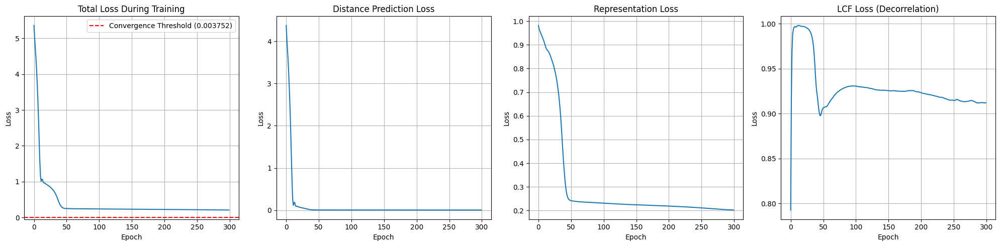

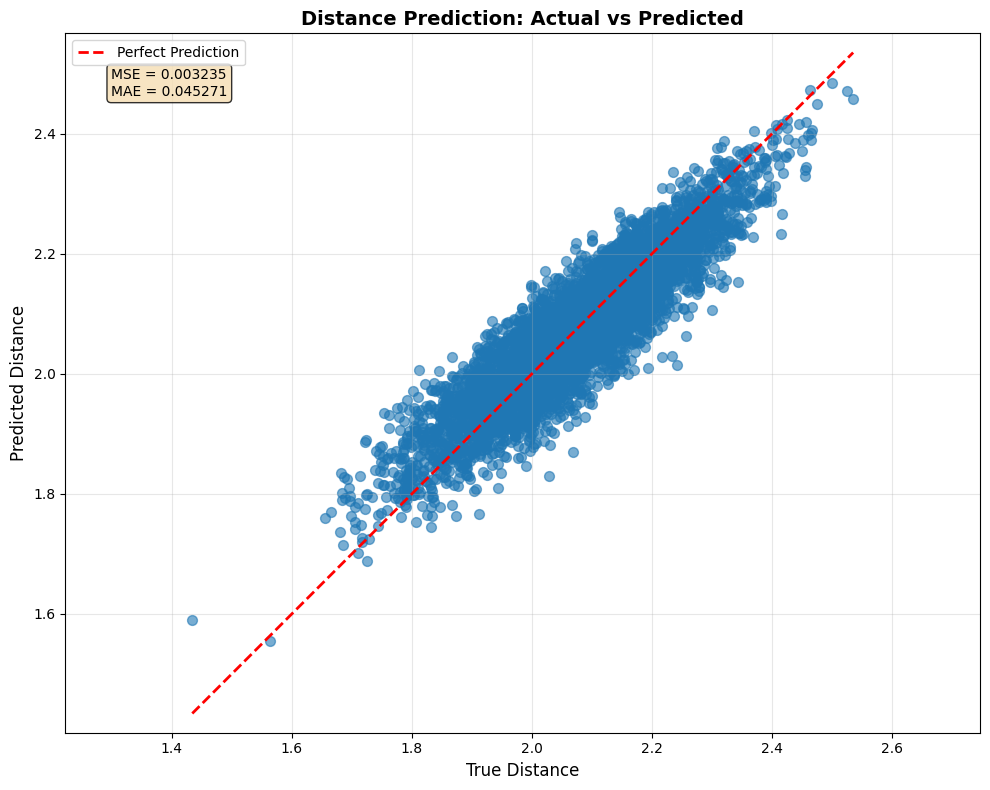

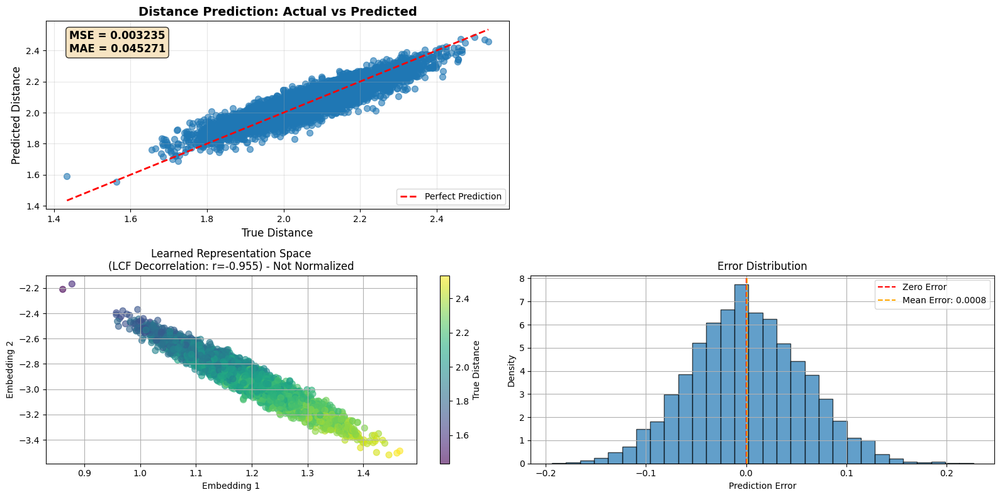

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step

Test Set Performance:
Test Pairwise Correlation: 0.0902
Test Distance Prediction MAE: 0.046687
Test Embedding Correlation (LCF): -0.9558
Test LCF Loss Value: 0.913560


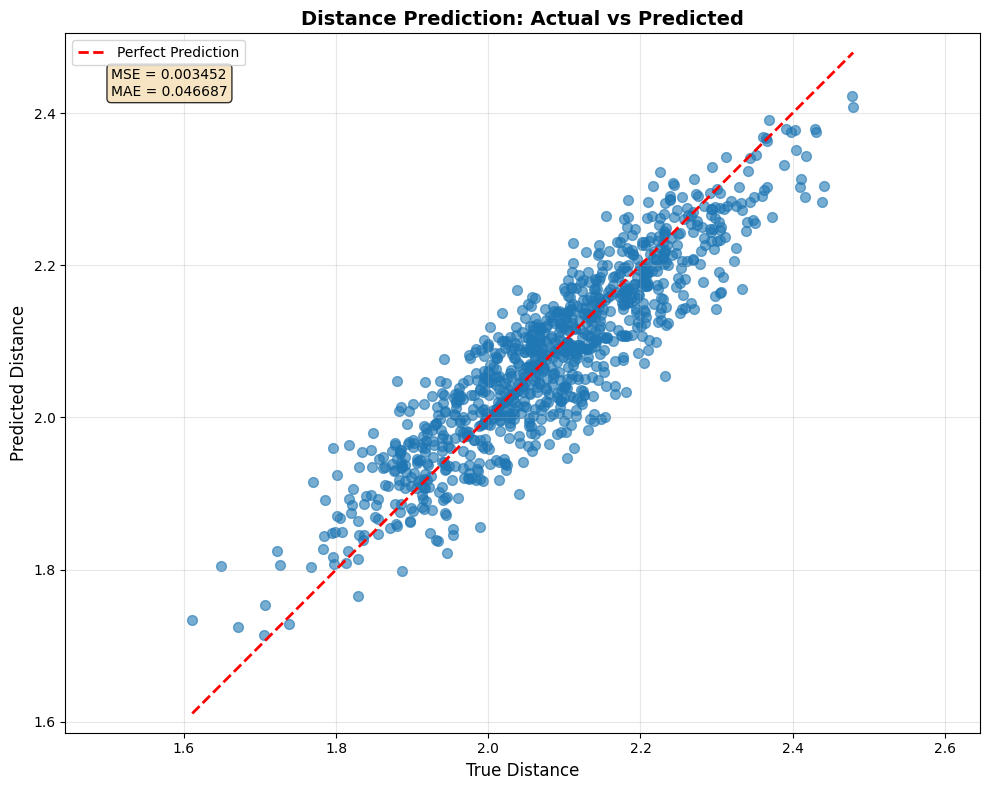

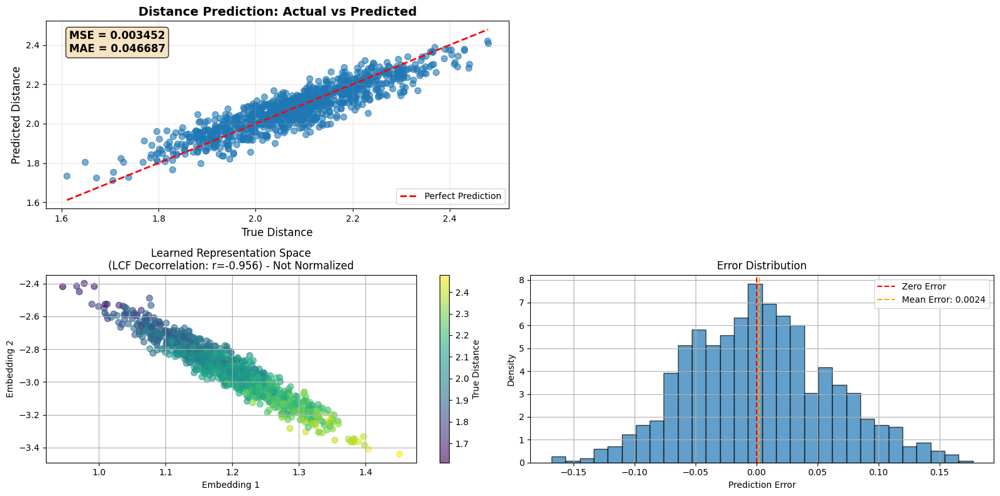


LCF Decorrelation Analysis:
Training Set Embedding Correlation: -0.9551
Test Set Embedding Correlation: -0.9558
LCF Loss Weight Used: 0.1


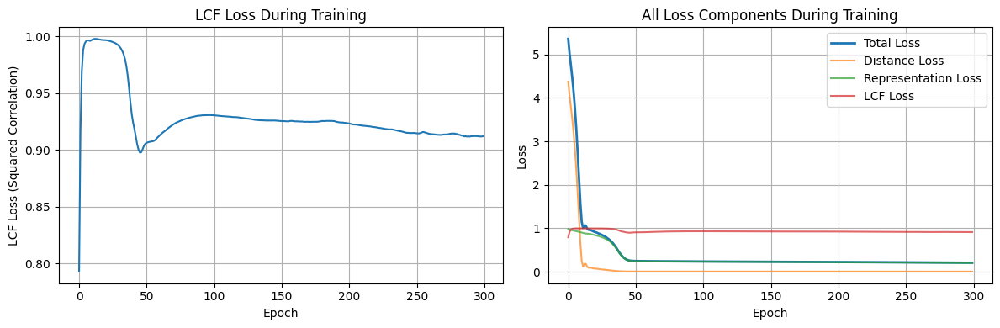

In [19]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)


# Training setup with TrainerV4_3
noise_level = 0.15
trainer = TrainerV4_3(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=False
)

# Train with three losses: distance MSE + PDC representation + LCF decorrelation
(history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=1.0,              # PDC loss for representation learning
    lcf_loss_weight=0.,                         # NEW: LCF decorrelation auxiliary loss
    num_points=5000, 
    noise_level=noise_level, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics including LCF
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Calculate actual correlation between embedding dimensions
f1 = representation_predictions[:, 0]
f2 = representation_predictions[:, 1]
actual_correlation = np.corrcoef(f1, f2)[0, 1]
print(f"Actual Embedding Correlation (LCF target): {actual_correlation:.4f}")

# Calculate final LCF loss value
final_lcf_loss = lcf_loss_vec(None, representation_predictions).numpy()
print(f"Final LCF Loss Value: {final_lcf_loss:.6f}")

# Plot training history (now shows all four losses: total, distance, representation, LCF)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including LCF decorrelation info
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]
# test_predictions[2] is the LCF auxiliary output (identical to representation)

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

# Calculate test set LCF metrics
test_f1 = test_representation_predictions[:, 0]
test_f2 = test_representation_predictions[:, 1]
test_actual_correlation = np.corrcoef(test_f1, test_f2)[0, 1]
test_lcf_loss = lcf_loss_vec(None, test_representation_predictions).numpy()

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")
print(f"Test Embedding Correlation (LCF): {test_actual_correlation:.4f}")
print(f"Test LCF Loss Value: {test_lcf_loss:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

# Additional analysis: Compare correlation before and after LCF
print(f"\nLCF Decorrelation Analysis:")
print(f"Training Set Embedding Correlation: {actual_correlation:.4f}")
print(f"Test Set Embedding Correlation: {test_actual_correlation:.4f}")
print(f"LCF Loss Weight Used: 0.1")

# Plot correlation over time if available in history
if 'lcf_auxiliary_loss' in history.history:
    plt.figure(figsize=(12, 4))
    
    # Plot LCF loss progression
    plt.subplot(1, 2, 1)
    plt.plot(history.history['lcf_auxiliary_loss'])
    plt.title('LCF Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('LCF Loss (Squared Correlation)')
    plt.grid(True)
    
    # Plot total loss vs individual components
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Total Loss', linewidth=2)
    plt.plot(history.history['distance_prediction_loss'], label='Distance Loss', alpha=0.7)
    
    rep_loss_key = f"{trainer.rep_output_name}_loss"
    if rep_loss_key in history.history:
        plt.plot(history.history[rep_loss_key], label='Representation Loss', alpha=0.7)
    
    plt.plot(history.history['lcf_auxiliary_loss'], label='LCF Loss', alpha=0.7)
    plt.title('All Loss Components During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step

Training Metrics:
Initial Total Loss: 5.052309
Final Total Loss: 0.177449
Initial Distance Loss: 3.996438
Final Distance Loss: 0.002892
Initial Representation Loss: 0.989845
Final Representation Loss: 0.174221
Initial LCF Loss: 0.116111
Final LCF Loss: 0.000065
Convergence Threshold: 0.003537
Model did not converge to threshold
Total Training Time: 17.03 seconds
Average Time per Batch: 10.36 ms

Distance Prediction Metrics:
MSE: 0.002875
MAE: 0.042686

Representation Quality:
Pairwise Correlation: 0.0758
Noise Level Used: 0.15
LCF Loss Weight: 0.5
Final Pairwise Correlation: 0.0758
Distance Prediction MAE: 0.042686
Actual Embedding Correlation (LCF target): -0.0049
Final LCF Loss Value: 0.000024


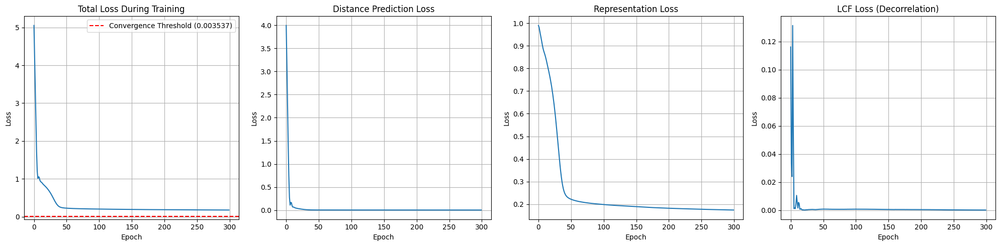

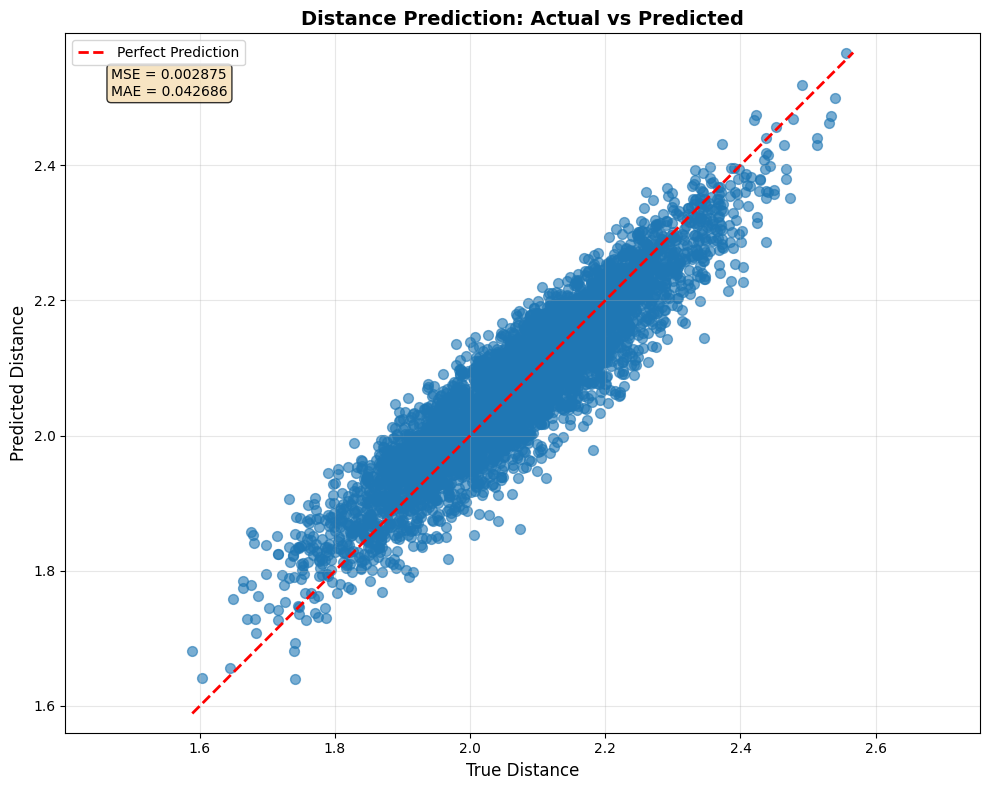

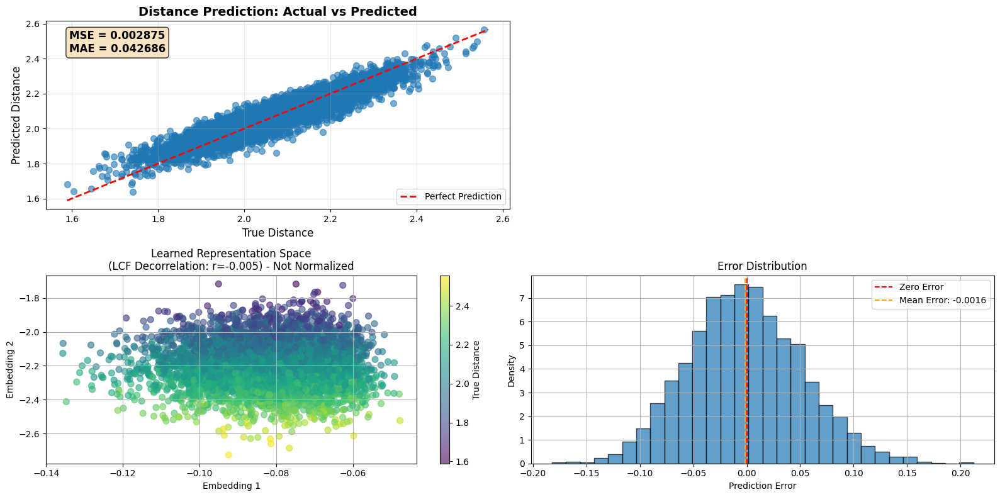

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step

Test Set Performance:
Test Pairwise Correlation: 0.0640
Test Distance Prediction MAE: 0.045043
Test Embedding Correlation (LCF): -0.0239
Test LCF Loss Value: 0.000572


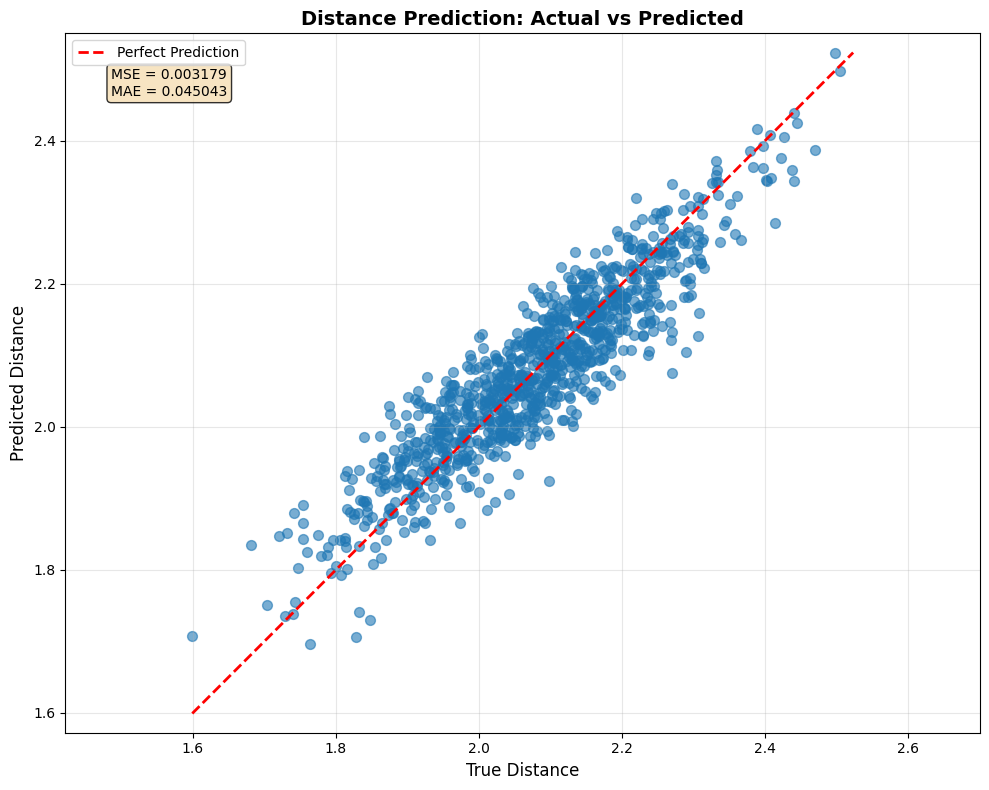

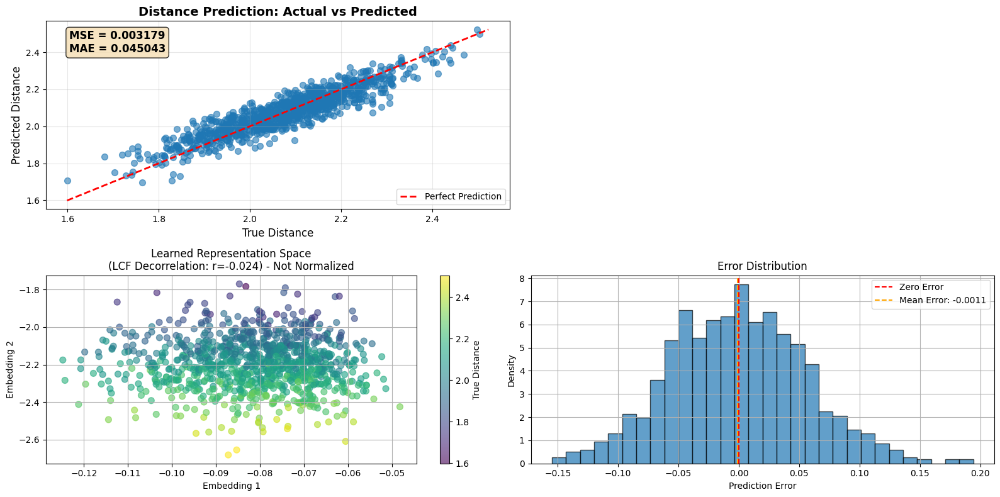


LCF Decorrelation Analysis:
Training Set Embedding Correlation: -0.0049
Test Set Embedding Correlation: -0.0239
LCF Loss Weight Used: 0.1


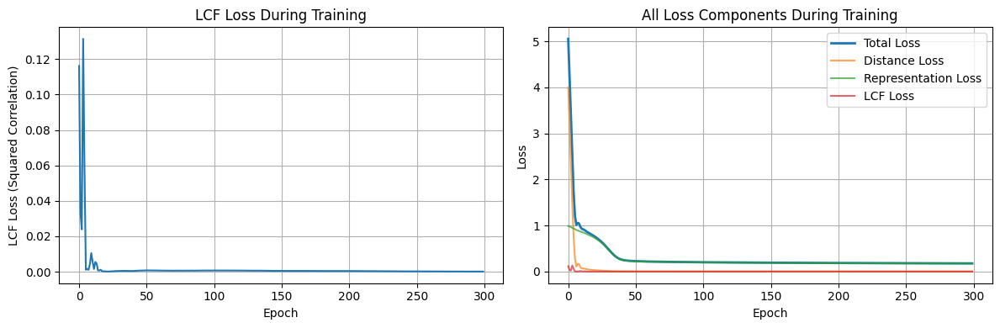

In [10]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)


# Training setup with TrainerV4_3
noise_level = 0.15
trainer = TrainerV4_3(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=False
)

# Train with three losses: distance MSE + PDC representation + LCF decorrelation
(history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=1.0,              # PDC loss for representation learning
    lcf_loss_weight=0.5,                         # NEW: LCF decorrelation auxiliary loss
    num_points=5000, 
    noise_level=noise_level, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics including LCF
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Calculate actual correlation between embedding dimensions
f1 = representation_predictions[:, 0]
f2 = representation_predictions[:, 1]
actual_correlation = np.corrcoef(f1, f2)[0, 1]
print(f"Actual Embedding Correlation (LCF target): {actual_correlation:.4f}")

# Calculate final LCF loss value
final_lcf_loss = lcf_loss_vec(None, representation_predictions).numpy()
print(f"Final LCF Loss Value: {final_lcf_loss:.6f}")

# Plot training history (now shows all four losses: total, distance, representation, LCF)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including LCF decorrelation info
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]
# test_predictions[2] is the LCF auxiliary output (identical to representation)

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

# Calculate test set LCF metrics
test_f1 = test_representation_predictions[:, 0]
test_f2 = test_representation_predictions[:, 1]
test_actual_correlation = np.corrcoef(test_f1, test_f2)[0, 1]
test_lcf_loss = lcf_loss_vec(None, test_representation_predictions).numpy()

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")
print(f"Test Embedding Correlation (LCF): {test_actual_correlation:.4f}")
print(f"Test LCF Loss Value: {test_lcf_loss:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

# Additional analysis: Compare correlation before and after LCF
print(f"\nLCF Decorrelation Analysis:")
print(f"Training Set Embedding Correlation: {actual_correlation:.4f}")
print(f"Test Set Embedding Correlation: {test_actual_correlation:.4f}")
print(f"LCF Loss Weight Used: 0.1")

# Plot correlation over time if available in history
if 'lcf_auxiliary_loss' in history.history:
    plt.figure(figsize=(12, 4))
    
    # Plot LCF loss progression
    plt.subplot(1, 2, 1)
    plt.plot(history.history['lcf_auxiliary_loss'])
    plt.title('LCF Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('LCF Loss (Squared Correlation)')
    plt.grid(True)
    
    # Plot total loss vs individual components
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Total Loss', linewidth=2)
    plt.plot(history.history['distance_prediction_loss'], label='Distance Loss', alpha=0.7)
    
    rep_loss_key = f"{trainer.rep_output_name}_loss"
    if rep_loss_key in history.history:
        plt.plot(history.history[rep_loss_key], label='Representation Loss', alpha=0.7)
    
    plt.plot(history.history['lcf_auxiliary_loss'], label='LCF Loss', alpha=0.7)
    plt.title('All Loss Components During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step

Training Metrics:
Initial Total Loss: 6.403972
Final Total Loss: 0.316294
Initial Distance Loss: 4.328483
Final Distance Loss: 0.002566
Initial Representation Loss: 1.003935
Final Representation Loss: 0.156759
Initial LCF Loss: 0.668201
Final LCF Loss: 0.000067
Convergence Threshold: 0.004483
Model did not converge to threshold
Total Training Time: 50.57 seconds
Average Time per Batch: 9.74 ms

Distance Prediction Metrics:
MSE: 0.002562
MAE: 0.040388

Representation Quality:
Pairwise Correlation: 0.0614
Noise Level Used: 0.15
LCF Loss Weight: 0.1
Final Pairwise Correlation: 0.0614
Distance Prediction MAE: 0.040388
Actual Embedding Correlation (LCF target): -0.0025
Final LCF Loss Value: 0.000006


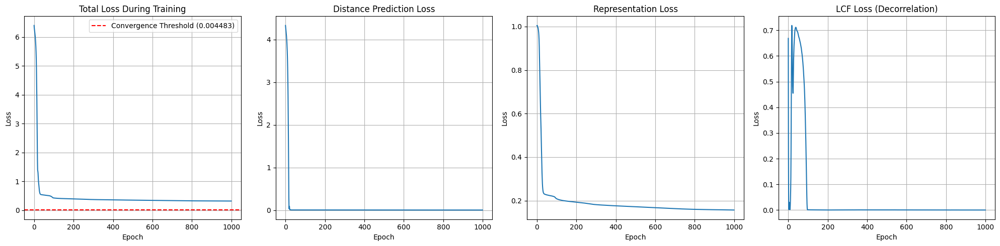

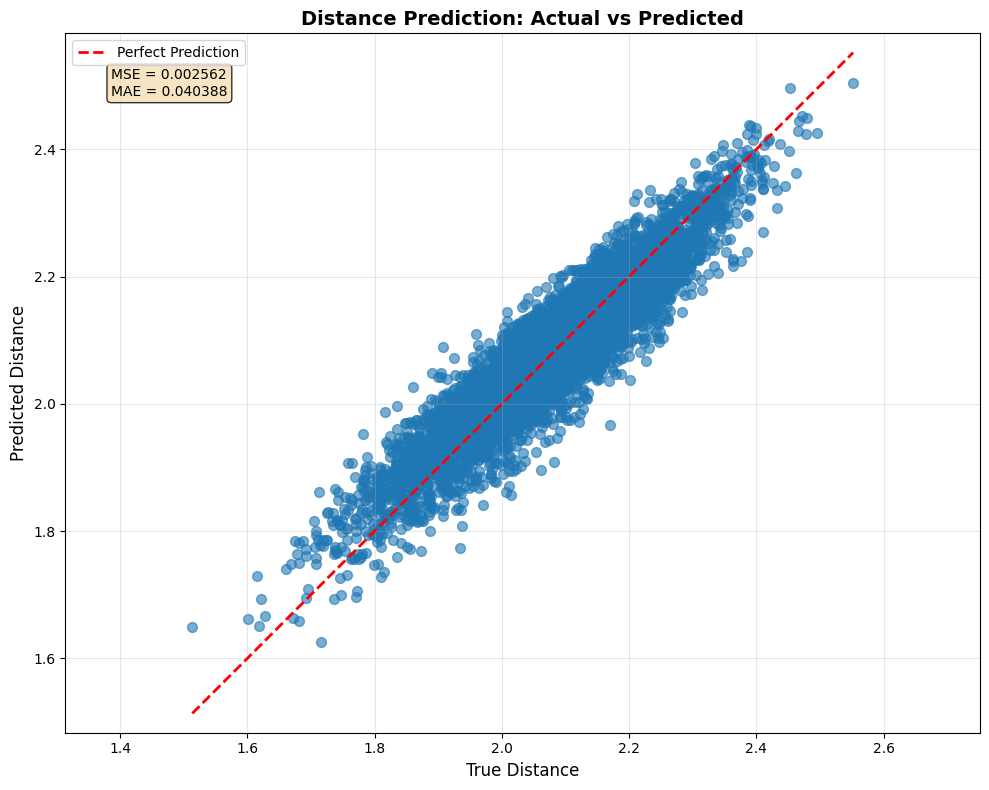

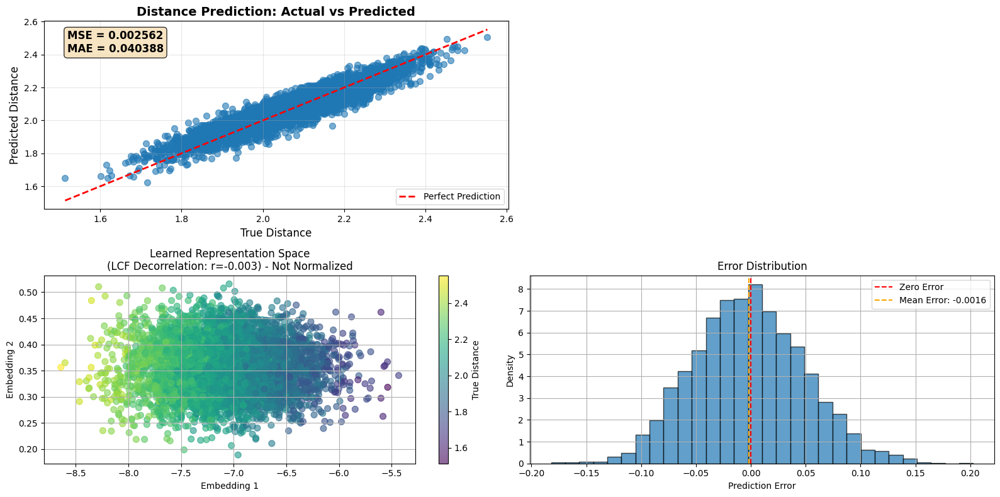

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 433us/step

Test Set Performance:
Test Pairwise Correlation: 0.0729
Test Distance Prediction MAE: 0.041786
Test Embedding Correlation (LCF): 0.0126
Test LCF Loss Value: 0.000159


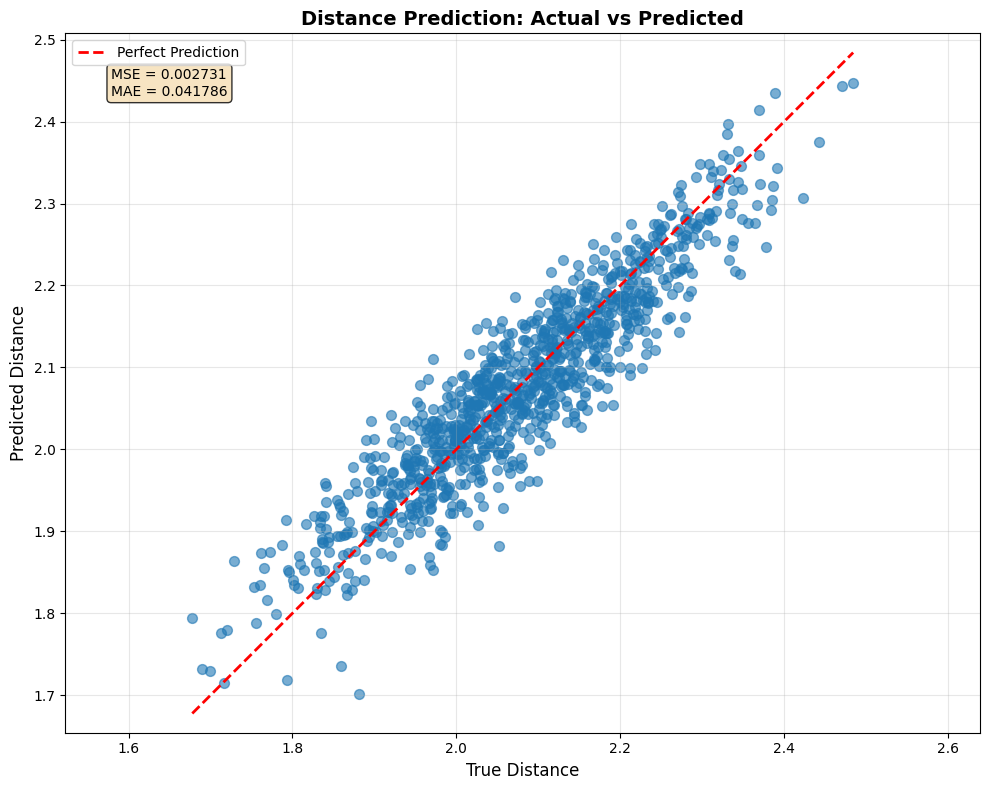

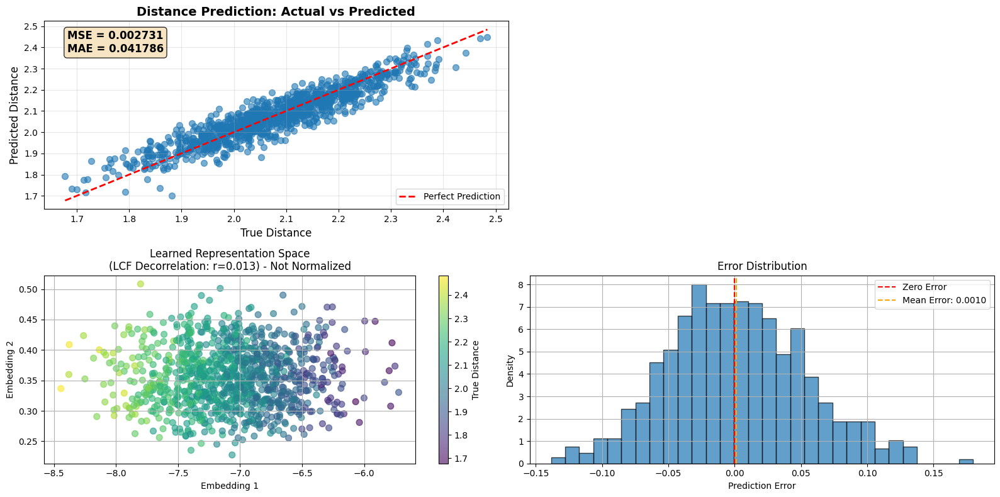


LCF Decorrelation Analysis:
Training Set Embedding Correlation: -0.0025
Test Set Embedding Correlation: 0.0126
LCF Loss Weight Used: 0.1


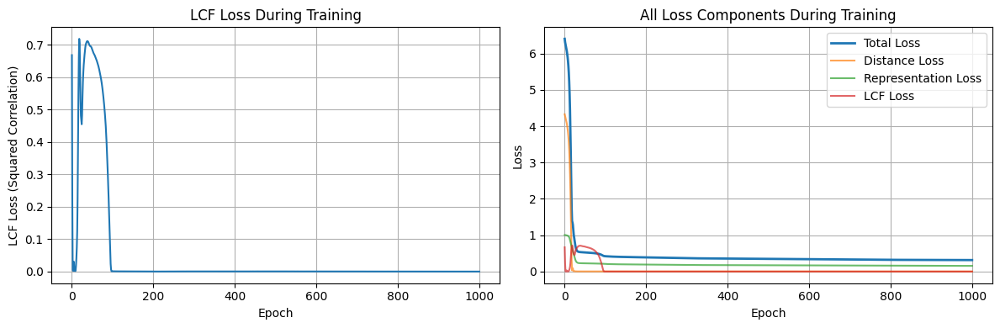

In [23]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pdc_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)


# Training setup with TrainerV4_3
noise_level = 0.15
trainer = TrainerV4_3(
    input_dim=16, 
    hidden_dims=[8, 16, 32, 16, 8], 
    embed_dim=2, 
    use_normalize_layer=False
)

# Train with three losses: distance MSE + PDC representation + LCF decorrelation
(history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=2.0,              # PDC loss for representation learning
    lcf_loss_weight=0.1,                         # NEW: LCF decorrelation auxiliary loss
    num_points=5000, 
    noise_level=noise_level, 
    epochs=1000, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics including LCF
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Calculate actual correlation between embedding dimensions
f1 = representation_predictions[:, 0]
f2 = representation_predictions[:, 1]
actual_correlation = np.corrcoef(f1, f2)[0, 1]
print(f"Actual Embedding Correlation (LCF target): {actual_correlation:.4f}")

# Calculate final LCF loss value
final_lcf_loss = lcf_loss_vec(None, representation_predictions).numpy()
print(f"Final LCF Loss Value: {final_lcf_loss:.6f}")

# Plot training history (now shows all four losses: total, distance, representation, LCF)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including LCF decorrelation info
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]
# test_predictions[2] is the LCF auxiliary output (identical to representation)

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

# Calculate test set LCF metrics
test_f1 = test_representation_predictions[:, 0]
test_f2 = test_representation_predictions[:, 1]
test_actual_correlation = np.corrcoef(test_f1, test_f2)[0, 1]
test_lcf_loss = lcf_loss_vec(None, test_representation_predictions).numpy()

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")
print(f"Test Embedding Correlation (LCF): {test_actual_correlation:.4f}")
print(f"Test LCF Loss Value: {test_lcf_loss:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

# Additional analysis: Compare correlation before and after LCF
print(f"\nLCF Decorrelation Analysis:")
print(f"Training Set Embedding Correlation: {actual_correlation:.4f}")
print(f"Test Set Embedding Correlation: {test_actual_correlation:.4f}")
print(f"LCF Loss Weight Used: 0.1")

# Plot correlation over time if available in history
if 'lcf_auxiliary_loss' in history.history:
    plt.figure(figsize=(12, 4))
    
    # Plot LCF loss progression
    plt.subplot(1, 2, 1)
    plt.plot(history.history['lcf_auxiliary_loss'])
    plt.title('LCF Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('LCF Loss (Squared Correlation)')
    plt.grid(True)
    
    # Plot total loss vs individual components
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Total Loss', linewidth=2)
    plt.plot(history.history['distance_prediction_loss'], label='Distance Loss', alpha=0.7)
    
    rep_loss_key = f"{trainer.rep_output_name}_loss"
    if rep_loss_key in history.history:
        plt.plot(history.history[rep_loss_key], label='Representation Loss', alpha=0.7)
    
    plt.plot(history.history['lcf_auxiliary_loss'], label='LCF Loss', alpha=0.7)
    plt.title('All Loss Components During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

PDS

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step

Training Metrics:
Initial Total Loss: 3.552544
Final Total Loss: 0.026552
Initial Distance Loss: 3.289774
Final Distance Loss: 0.017268
Initial Representation Loss: 0.504950
Final Representation Loss: 0.018514
Convergence Threshold: 0.002487
Model did not converge to threshold
Total Training Time: 11.93 seconds
Average Time per Batch: 6.81 ms

Distance Prediction Metrics:
MSE: 0.017234
MAE: 0.105660

Representation Quality:
Pairwise Correlation: 0.1140
Noise Level Used: 0.15
Final Pairwise Correlation: 0.1140
Distance Prediction MAE: 0.105660


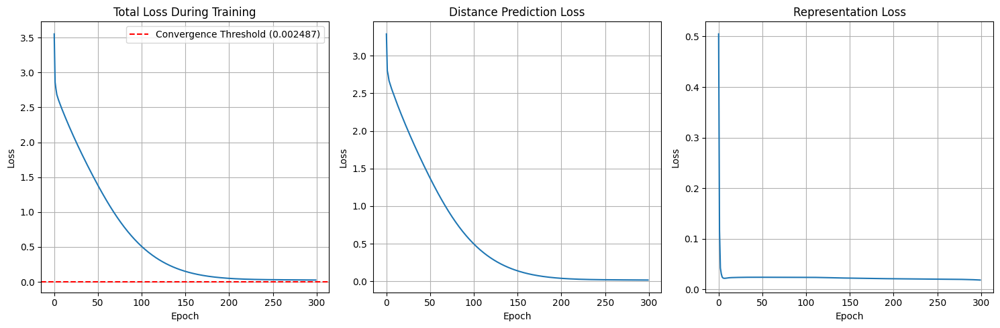

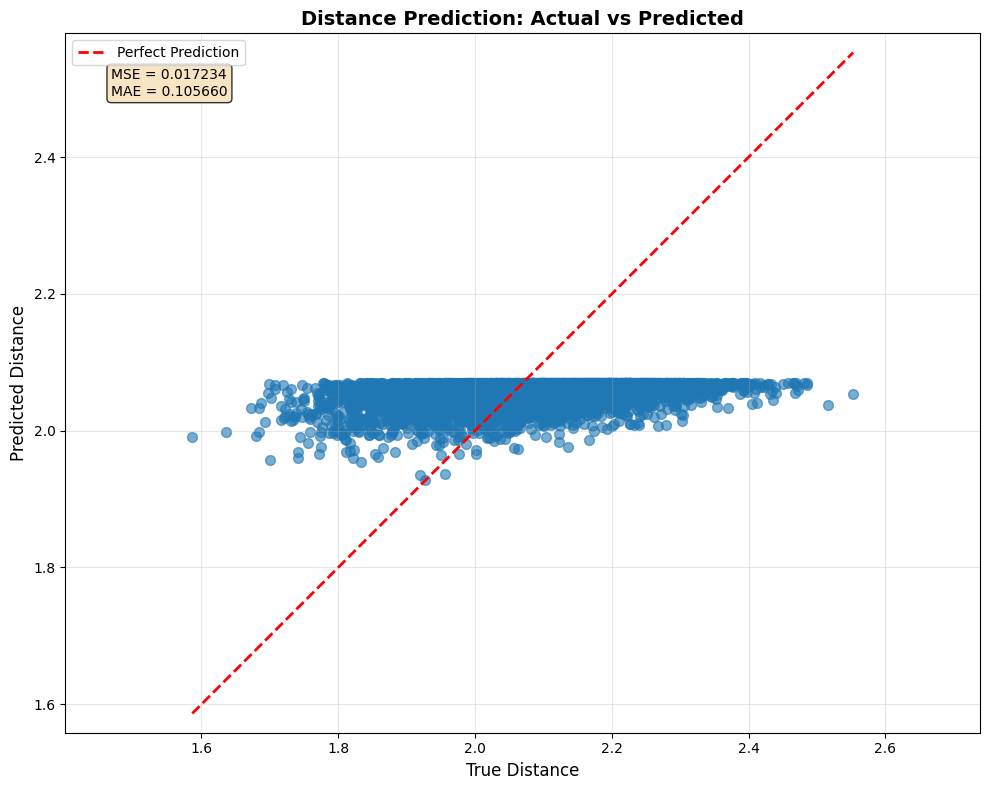

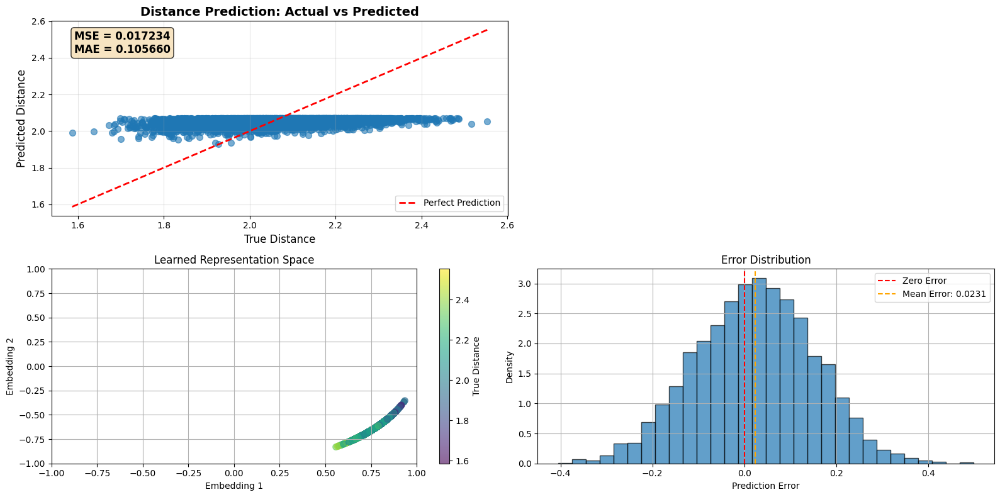

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step

Test Set Performance:
Test Pairwise Correlation: 0.1105
Test Distance Prediction MAE: 0.105009


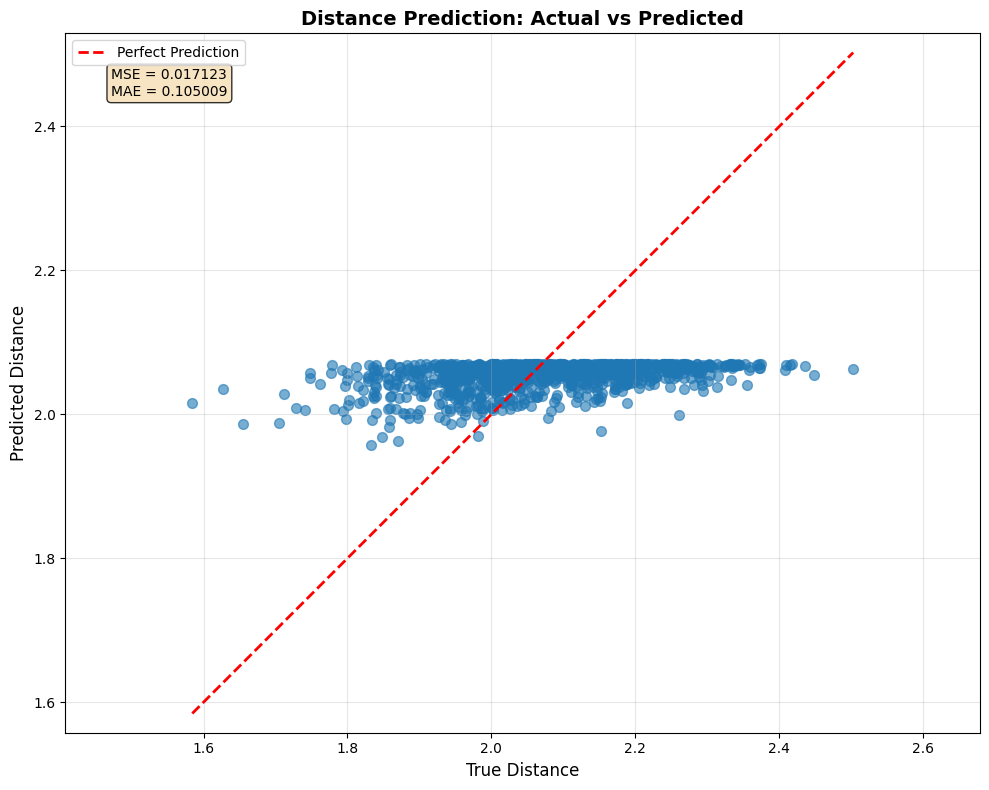

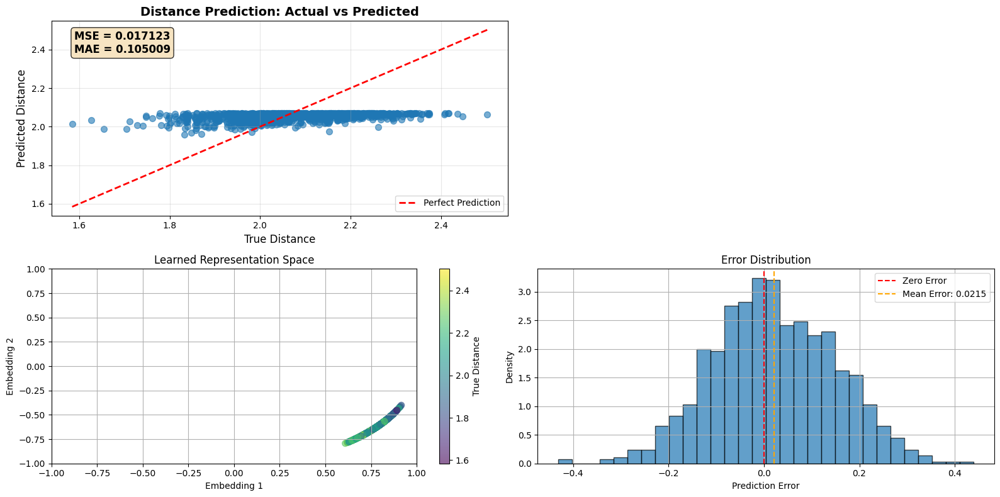

In [22]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pds_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=.5,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=300, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)

In [ ]:
def custom_loss_wrapper(y_true, y_pred):
    """
    Wrapper for PDC loss that handles the representation learning task.
    This should be used when applying PDC loss to representations.
    """
    # The PDC loss expects labels to be [batch_size, 1], but we're using it for 
    # representation learning where y_true are the input features [batch_size, 2]
    # We need to compute distances from the input features to use as labels
    
    # Compute distances from origin for each point in y_true (which are the input features)
    distances = tf.sqrt(tf.reduce_sum(tf.square(y_true), axis=1, keepdims=True))
    
    # Now apply PDC loss with proper shapes
    return mb.pds_loss_vec(distances, y_pred, pm)

def distance_custom_loss(y_true, y_pred):
    """
    Custom loss for distance prediction task.
    y_true: true distances [batch_size, 1]
    y_pred: predicted distances [batch_size, 1]
    """
    # For distance prediction, we might want to use PDC loss as well
    # or just stick with MSE
    return tf.keras.losses.mse(y_true, y_pred)

noise_level = 0.15
trainer = TrainerV4_1(input_dim=16, hidden_dims=[8, 16, 32, 16, 8], embed_dim=2, use_normalize_layer=True)

# Option 1: Use PDC loss for representation learning (recommended)
( history,
    distance_metrics, 
    correlation, 
    distance_predictions, 
    representation_predictions, 
    X_train, 
    y_distance
    ) = trainer.train(
    representation_loss_fn=custom_loss_wrapper,  # PDC loss for representation learning
    distance_loss_weight=1.0,                    # Standard MSE for distance prediction
    representation_loss_weight=.5,              # PDC loss for representation learning
    num_points=5000, 
    noise_level=noise_level, 
    epochs=1200, 
    batch_size=1024,
    verbose=0
)

# Print results with new metrics
print(f"Final Pairwise Correlation: {correlation:.4f}")
print(f"Distance Prediction MAE: {distance_metrics['mae']:.6f}")

# Plot training history (now shows both losses)
trainer.plot_training_history(history)

# Plot the main actual vs predicted plot
trainer.plot_actual_vs_predicted(y_distance, distance_predictions)

# Plot comprehensive analysis including actual vs predicted
trainer.plot_predictions(X_train, y_distance, distance_predictions, representation_predictions)

# Generate test data and evaluate
X_test, y_test = trainer.generate_synthetic_data(num_points=1000, noise_level=noise_level)
test_predictions = trainer.model.predict(X_test)
test_distance_predictions = test_predictions[0]
test_representation_predictions = test_predictions[1]

# Evaluate on test data
test_distance_metrics = trainer.compute_distance_metrics(y_test, test_distance_predictions)
test_correlation = trainer.compute_pairwise_correlation(X_test, test_representation_predictions)

print(f"\nTest Set Performance:")
print(f"Test Pairwise Correlation: {test_correlation:.4f}")
print(f"Test Distance Prediction MAE: {test_distance_metrics['mae']:.6f}")

# Plot test results
trainer.plot_actual_vs_predicted(y_test, test_distance_predictions)
trainer.plot_predictions(X_test, y_test, test_distance_predictions, test_representation_predictions)